# This Notebook Contains:

### Text SOM (for TF-IDF Alternative please check file '2.1_Text_SOM(Doc2Vec_TF-IDF)')
### Madrid Fuyu SOM
### IndieFilms Fuyu SOM
### Madrid Image SOM
### IndieFilms Frame SOM
### Global Search Examples

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import glob, os, sys
import numpy as np
import csv
import cv2

In [3]:
import pickle
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer

In [4]:
import tensorflow as tf
import PIL
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import numpy as np
from PIL import Image
import networkx as nx
from IPython.display import Image as iImage
from IPython.display import display
import math
import matplotlib.pyplot as plt
import ebooklib
from ebooklib import epub
import random
import re
import os
import nltk
from nltk.corpus import words
import gensim
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import words, stopwords, names
from sklearn.decomposition import PCA
import scipy.spatial
from matplotlib import cm
import matplotlib.image as mpimg
import pandas as pd
import jieba
from sklearn.metrics.pairwise import linear_kernel
from nltk import pos_tag
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import sklearn

# Texts

In [5]:
from preprocessmodel import preprocessmodel

In [6]:
def merge_strings_until_limit(strings, min_length, max_length, test_for_max=0):
    merged_string = ""
    merged_strings = []

    for s in strings:
        if len(merged_string) <= min_length:
            merged_string += s
        elif len(merged_string) > max_length and test_for_max < 5:
            split_paragraph = merged_string.split('.')
            split_paragraph_repoint = []
            for sp in split_paragraph:
                split_paragraph_repoint.append(sp + '.')
            merged = merge_strings_until_limit(split_paragraph_repoint, min_length, max_length, test_for_max + 1)
            merged_strings.extend(merged)
            merged_string = s
        else:
            merged_strings.append(merged_string)
            merged_string = s

    if merged_string:
        merged_strings.append(merged_string)

    return merged_strings

In [7]:
import ebooklib
import re

def read_epub_book(epub_file, ID):
    book = ebooklib.epub.read_epub(epub_file)
    text = ""

    for item in book.get_items():
        if item.get_type() == ebooklib.ITEM_DOCUMENT:
            content = item.get_content().decode('utf-8')
            content = re.sub('<[^<]+?>', '', content)  # Remove HTML tags
            content = re.sub('\s+', ' ', content)  # Replace multiple whitespaces with a single space
            content = re.sub('\n', ' ', content)
            content = re.sub("&#13;", ' ', content)
            text += content
            #paragraphs.extend(content.strip().split("&#13;"))
    book_item = {'text': text, 'bookID':ID}
    return book_item

def read_epub_paragraphs(epub_file, ID):
    book = ebooklib.epub.read_epub(epub_file)
    paragraphs = []

    for item in book.get_items():
        if item.get_type() == ebooklib.ITEM_DOCUMENT:
            content = item.get_content().decode('utf-8')
            content = re.sub('<[^<]+?>', '', content)  # Remove HTML tags
            content = re.sub('\s+', ' ', content)  # Replace multiple whitespaces with a single space
            content = re.sub('\n', ' ', content)
            paragraphs.extend(content.strip().split("&#13;"))
    paragraphs = merge_strings_until_limit(paragraphs, 200, 1000)
    paragraphs = [{'paragraph':paragraphs[i], 'nr':i,'bookID':ID} for i in range(len(paragraphs)) if len(paragraphs[i])>50]
    return paragraphs[1:-1]

def process_multiple_epub_files(file_paths):
    all_paragraphs = []
    all_books = []
    for idx, file_path in enumerate(file_paths, start=1):
        paragraphs = read_epub_paragraphs(file_path, idx)
        all_paragraphs.extend(paragraphs)
        book_info = read_epub_book(file_path, idx)
        all_books.append(book_info)
    return all_books, all_paragraphs

file_paths = ['D:\\FinalAssignment\\Books\\huxley-brave-new-world.epub', 'D:\\FinalAssignment\\Books\\morris-news-from-nowhere.epub', 'D:\\FinalAssignment\\Books\\orwell-nineteen-eighty-four.epub']  # Add more file paths as needed
books, paragraphs = process_multiple_epub_files(file_paths)

F:\Anaconda\envs\py38\lib\site-packages\ebooklib\epub.py:1395: UserWarning: In the future version we will turn default option ignore_ncx to True.
  warnings.warn('In the future version we will turn default option ignore_ncx to True.')


In [8]:
list = []
list = books, paragraphs

In [9]:
import json

In [10]:
data = list
with open('JSON/list.json', "w") as json_file:
    json.dump(data, json_file)

In [11]:
with open('JSON/list.json', 'r') as file:
    # Load the JSON data into a Python dictionary
    data01 = json.load(file)

In [12]:
data02 = data01[1]

In [13]:
data02[:3]

[{'paragraph': 'Brave New World Aldous Huxley Copyright © 2014 epubBooks All Rights Reserved. This publication is protected by copyright. By payment of the required fees, you have been granted the non-exclusive, non-transferable right to access and read the text of this ebook on-screen or via personal text-to-speech computer systems. No part of this text may be reproduced, transmitted, downloaded, decompiled, reverse engineered, stored in or introduced into any information storage and retrieval system, in any form or by any means, whether electronic or mechanical, now known or hereinafter invented, without the express written permission of epubBooks. www.epubbooks.com',
  'nr': 1,
  'bookID': 1},
 {'paragraph': "Chapter One A squat grey building of only thirty–four stories. Over the main entrance the words, CENTRAL LONDON HATCHERY AND CONDITIONING CENTRE, and, in a shield, the World State's motto, COMMUNITY, IDENTITY, STABILITY.",
  'nr': 2,
  'bookID': 1},
 {'paragraph': ' The enormou

In [14]:
paragraphs = [item['paragraph'] for item in data02]


In [15]:
paragraphs[2]

' The enormous room on the ground floor faced towards the north. Cold for all the summer beyond the panes, for all the tropical heat of the room itself, a harsh thin light glared through the windows, hungrily seeking some draped lay figure, some pallid shape of academic goose–flesh, but finding only the glass and nickel and bleakly shining porcelain of a laboratory.'

In [16]:
#text_list

In [17]:
from preprocessmodel import preprocess
processed_text=preprocess(paragraphs)
#preprocess_text_list = processed_text.preprocess_text_list

In [18]:
#processed_text

In [124]:
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU1(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE

def find_BMU_2(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argpartition(cos_sims, -2, axis=None)[-2], cos_sims.shape)

def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU1(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)

def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

def find_BMU1(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)

def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU1(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM

def cosine(a,b):
    return cosine_similarity([a], [b])[0][0]

def u_matrix(lattice):
    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)
    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += cosine(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += cosine(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += cosine(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += cosine(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values

def activate1(train_data, SOM, p):
    #normalP = normalise(train_data, p)
    p = p.reshape(1, -1)
    activatedSOM = np.array([[cosine_similarity(p, [c])[0][0] for c in r] for r in SOM])
    #normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (activatedSOM -1)*(-1)
    return activatedSOM

def activate2(train_data, SOM, p):
    #normalP = normalise(train_data, p)
#     p = p.reshape(1, -1)
    activatedSOM = np.array([[cosine_similarity([p], [c])[0][0] for c in r] for r in SOM])
    #normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
#     activatedSOM = (activatedSOM -1)*(-1)
    return activatedSOM

def normalise_2(train):
    min_d = np.min(train, axis=0)
    max_d = np.max(train, axis=0)
    normalised_train = (train - min_d) / (max_d - min_d)
    return normalised_train

def find_closest_cos(data, v):
    cos_dist = cosine_similarity(data, [v])
    return np.argmax(cos_dist)

In [20]:
sentences=processed_text
tagged_data = [TaggedDocument(words=sentence.split(), tags=[str(i)]) for i, sentence in enumerate(sentences)]
model1 = Doc2Vec(vector_size=300, min_count=1, epochs=10)
model1.build_vocab(tagged_data)
model1.train(tagged_data, total_examples=model1.corpus_count, epochs=model1.epochs)
sentence_vectors = [model1.infer_vector(sentence.split()) for sentence in sentences]
#u_matrix = np.array(sentence_vectors)

In [21]:
#with open('sentence_vectors.pkl', 'wb') as f:
    #pickle.dump(sentence_vectors, f)

Epoch: 1, QE: 0.0455, TE: 0.194


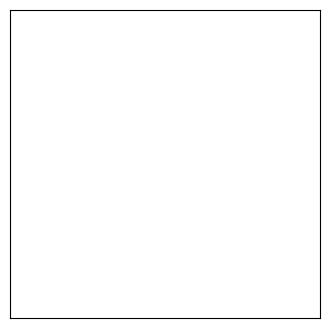

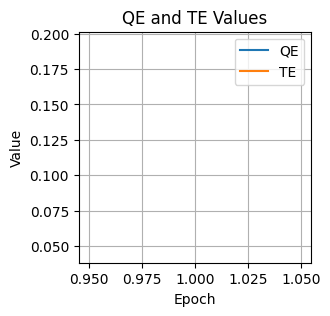

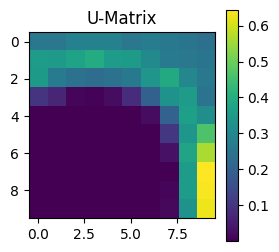

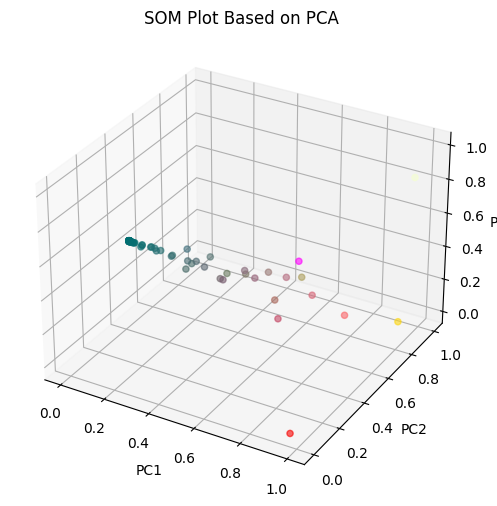

Epoch: 2, QE: 0.0399, TE: 0.172


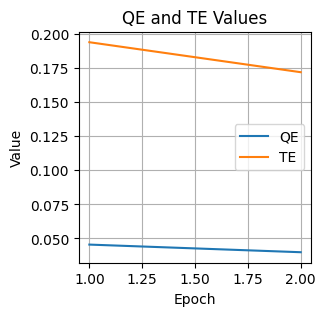

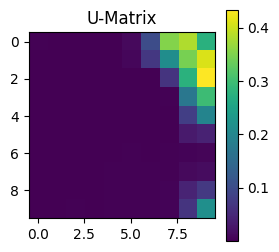

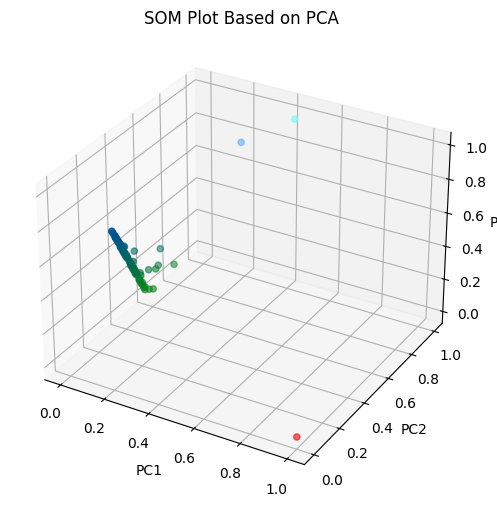

Epoch: 3, QE: 0.0448, TE: 0.13


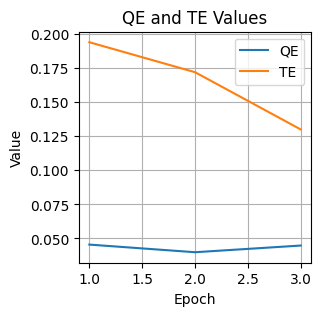

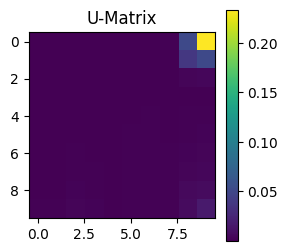

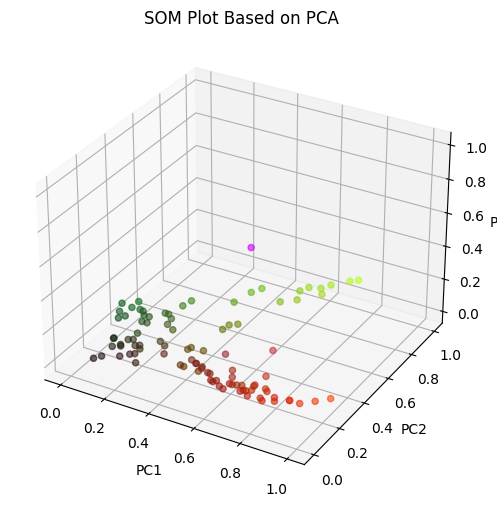

Epoch: 4, QE: 0.0445, TE: 0.154


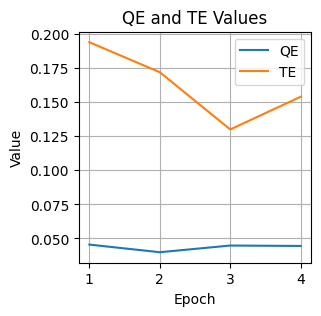

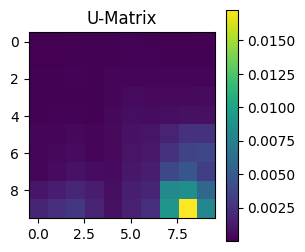

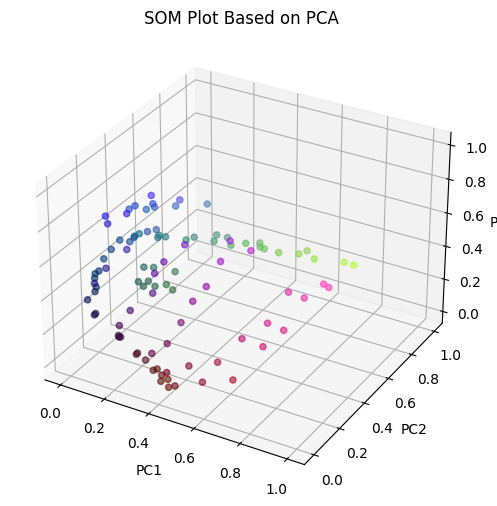

Epoch: 5, QE: 0.043, TE: 0.15


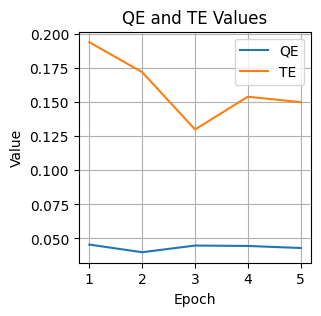

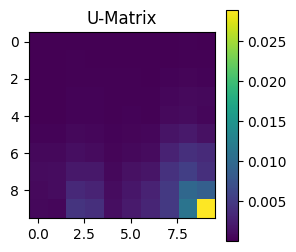

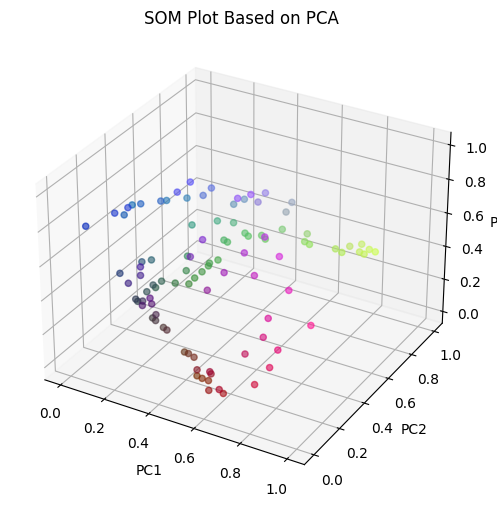

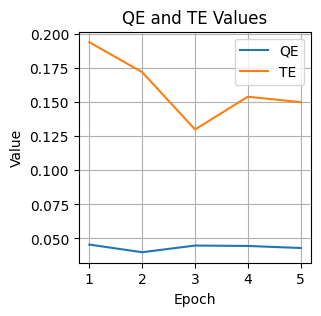

In [22]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Plot the SOM in 3D with PCA colors
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Assign PCA components to RGB channels
    colors = som_pca_norm

    # Plot each neuron's weight vector with PCA colors
    ax.scatter(som_pca_norm[:, 0], som_pca_norm[:, 1], som_pca_norm[:, 2], c=colors, alpha=0.6)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
    ax.set_title('SOM Plot Based on PCA')

    plt.show()

# Initialize SOM grid dimensions
m = 10
n = 10

# Initialize training data
train_data = sentence_vectors[:500]

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([5], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(3, 3))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix')
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values')
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

Epoch: 1, QE: 0.068, TE: 0.4466


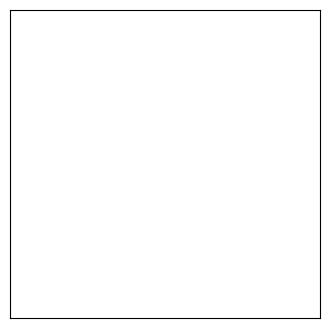

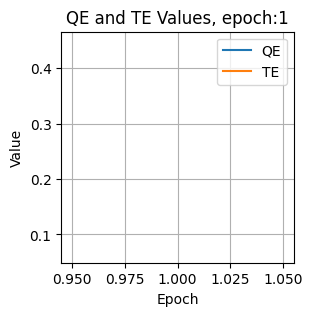

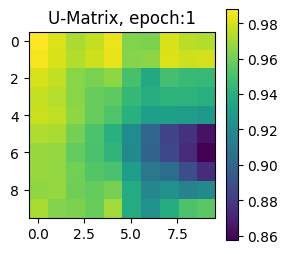

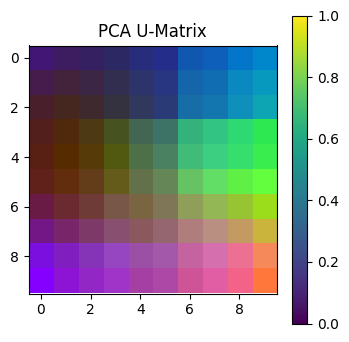

Epoch: 2, QE: 0.0768, TE: 0.4784


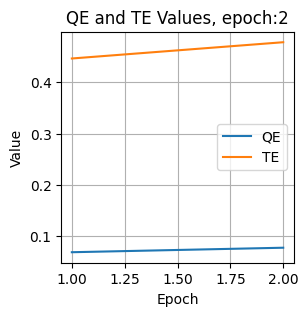

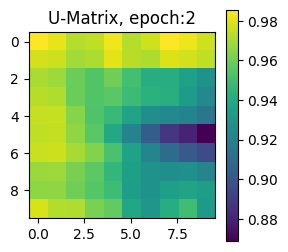

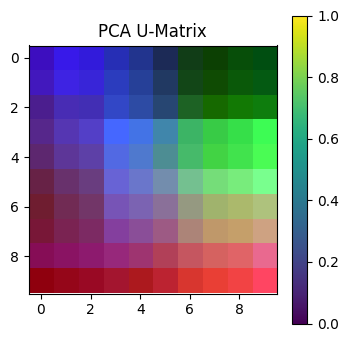

Epoch: 3, QE: 0.0751, TE: 0.5086


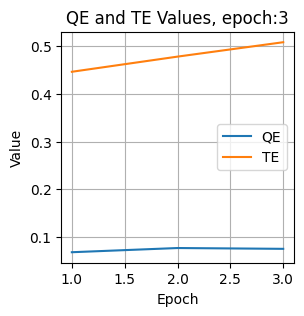

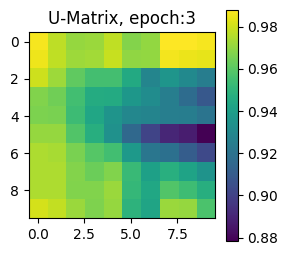

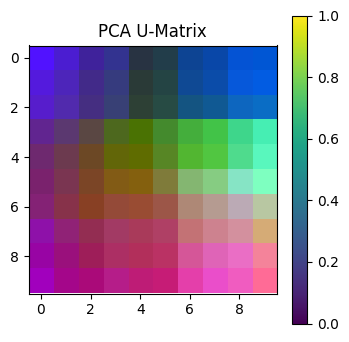

Epoch: 4, QE: 0.0762, TE: 0.4495


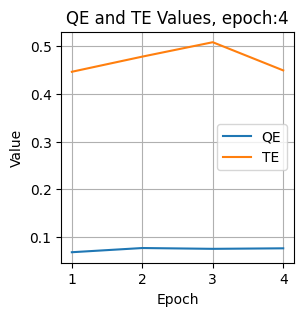

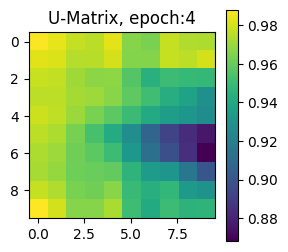

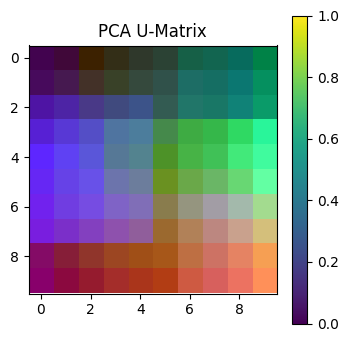

Epoch: 5, QE: 0.0739, TE: 0.4618


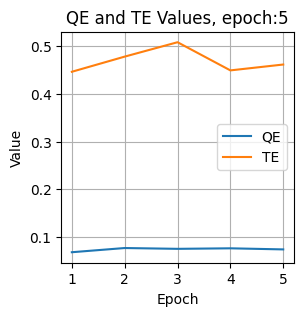

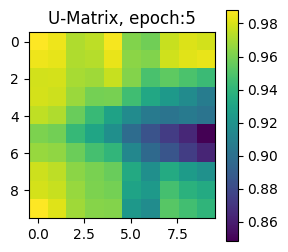

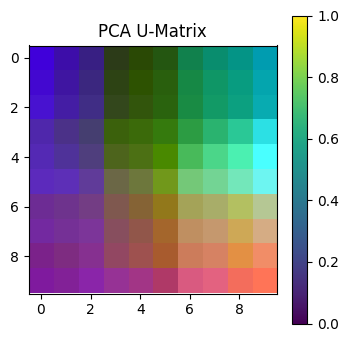

Epoch: 6, QE: 0.0734, TE: 0.4974


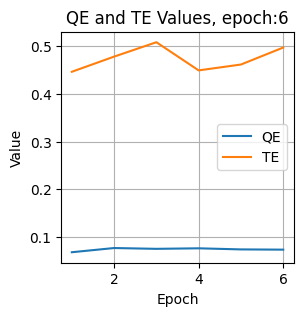

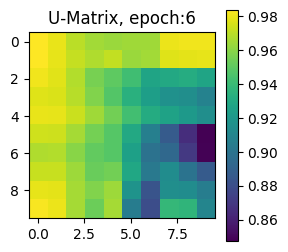

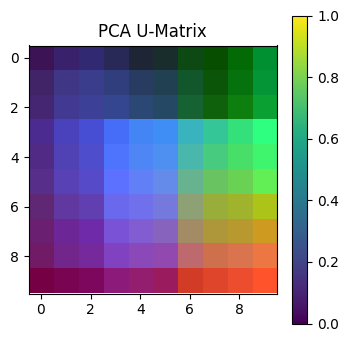

Epoch: 7, QE: 0.074, TE: 0.4837


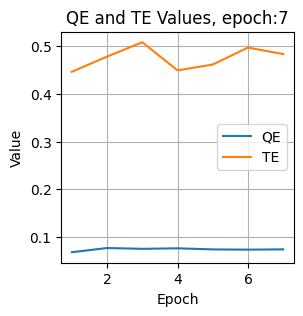

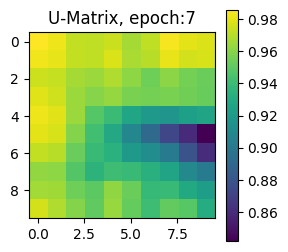

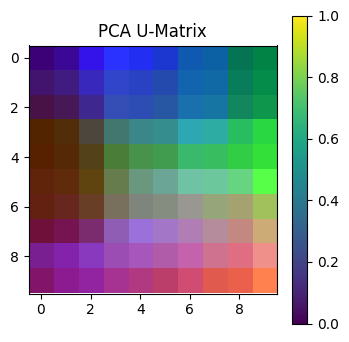

Epoch: 8, QE: 0.0764, TE: 0.4499


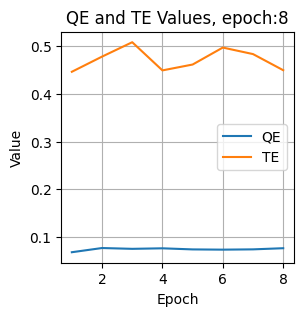

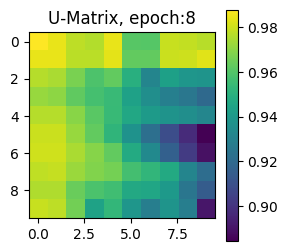

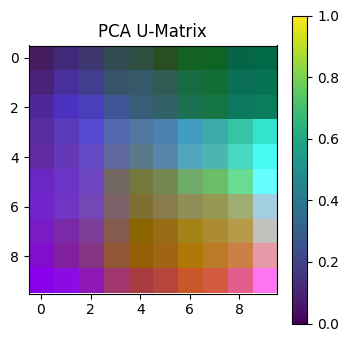

Epoch: 9, QE: 0.0749, TE: 0.4252


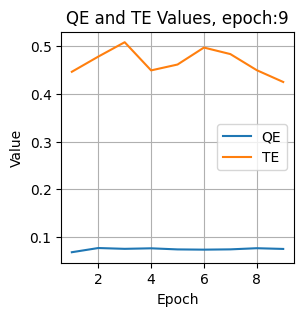

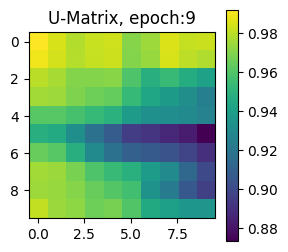

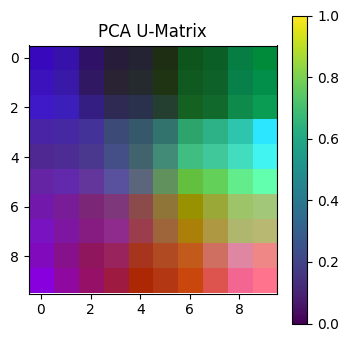

Epoch: 10, QE: 0.0759, TE: 0.489


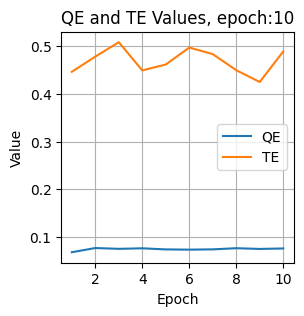

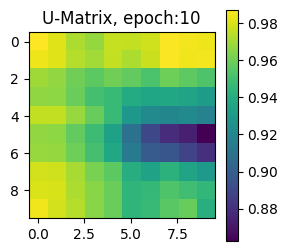

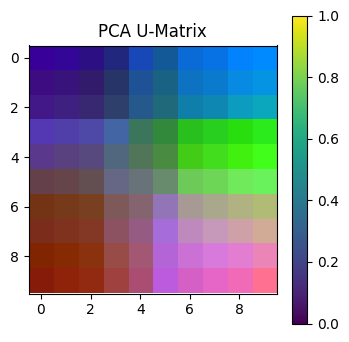

Epoch: 11, QE: 0.0745, TE: 0.5263


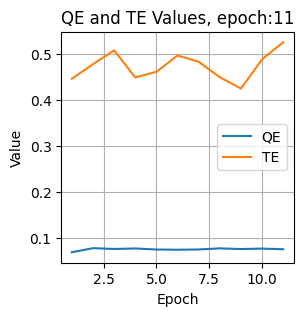

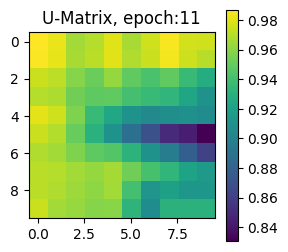

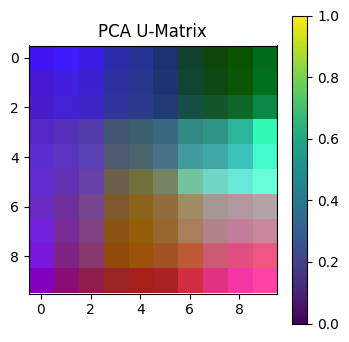

Epoch: 12, QE: 0.0754, TE: 0.4634


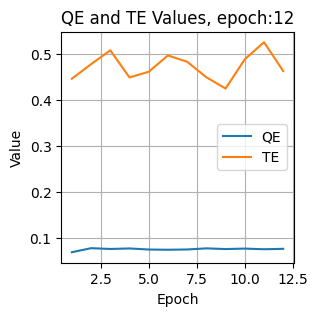

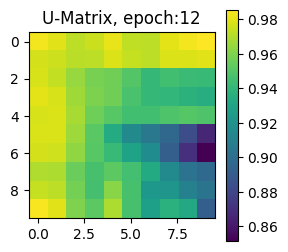

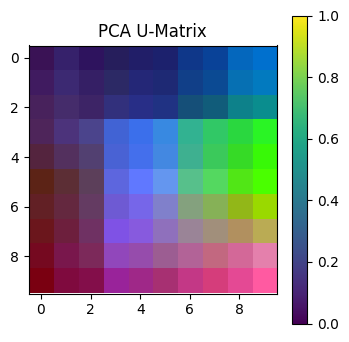

Epoch: 13, QE: 0.0757, TE: 0.4369


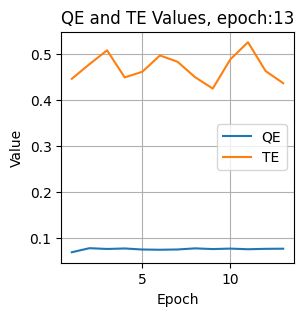

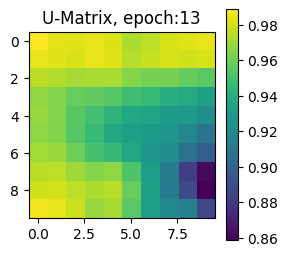

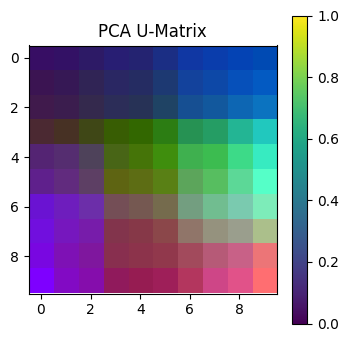

Epoch: 14, QE: 0.075, TE: 0.5192


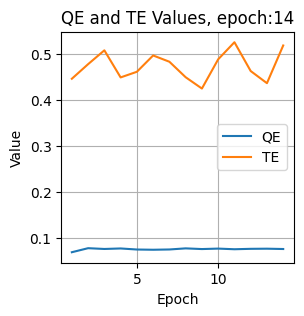

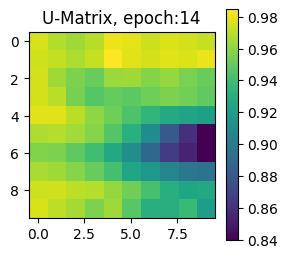

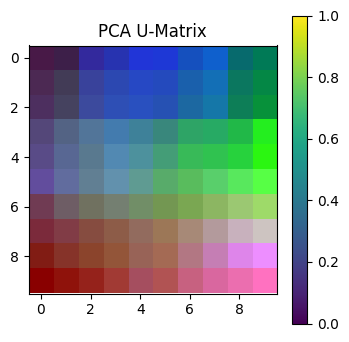

Epoch: 15, QE: 0.0748, TE: 0.4457


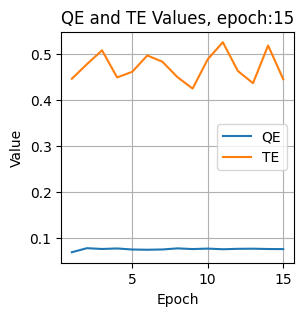

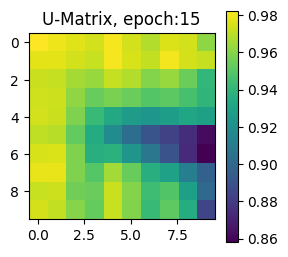

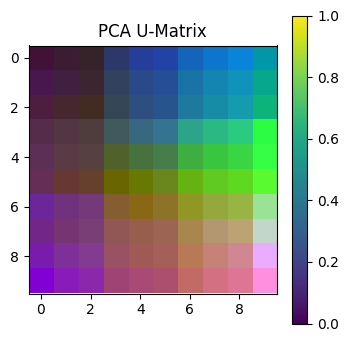

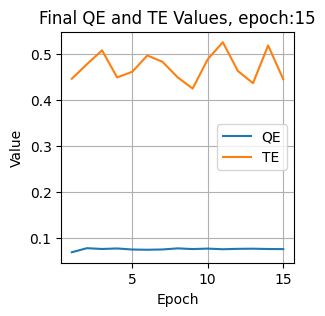

In [400]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Create a U-matrix with PCA components as RGB values
    u_matrix_pca = som_pca_norm.reshape(SOM.shape[:-1] + (3,))

    # Plot the U-matrix with PCA colors
    plt.figure(figsize=(4, 4))
    plt.imshow(u_matrix_pca)
    plt.title('PCA U-Matrix')
    plt.colorbar()
    plt.show()

# Initialize SOM grid dimensions
m = 10
n = 10

# Initialize training data
train_data = sentence_vectors

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([15], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(3, 3))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix, epoch:'+str(epoch))
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Final QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

In [401]:
SOM= SOMS[9]

In [402]:
QE = QE_values[9]
TE = TE_values[9]

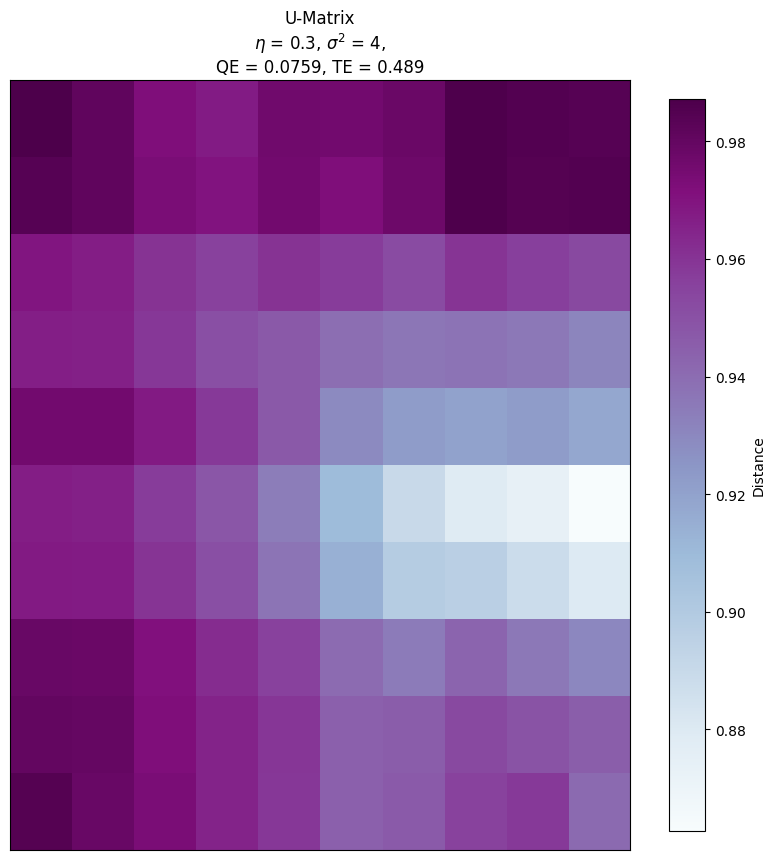

In [403]:
u_matrix_values = u_matrix(SOM)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [408]:
som_model = SOMS[9]

In [409]:
with open('som_model.pkl', 'wb') as f:
    pickle.dump(som_model, f)

In [410]:
with open('som_model.pkl', 'rb') as f:
    loaded_text_som_model = pickle.load(f)

In [411]:
data_dict = []
for i in range(len(loaded_text_som_model)):
    row = []
    for j in range(len(loaded_text_som_model[0])):
        row.append([])
    data_dict.append(row)
vectortextPairs=[]
for i in range(0,len(paragraphs)):
    vectortext={}
    vectortext['text']=paragraphs[i]
    vectortext['vector']=sentence_vectors[i]
    vectortextPairs.append(vectortext)
for i in vectortextPairs:
    g,h = find_BMU1(loaded_text_som_model,i['vector'])
    data_dict[g][h].append(i)

In [412]:
with open('data_dict.pkl', 'wb') as f:
    pickle.dump(data_dict, f)

### Defining search function

In [413]:
def searchtextsom(query):
    result = []
    query = [query]
    preprocessed_query = preprocess(query)
    query_vector = model1.infer_vector(preprocessed_query[0].split())
    activatedSOM = activate1(sentence_vectors, loaded_text_som_model, query_vector)
    
    plt.figure(figsize=(10, 10))  # 只需调用一次 plt.figure()
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    g, h = find_BMU1(loaded_text_som_model, query_vector)
    print((g, h))
    
    similarities = {}
    max_similarity = -1  # 初始化最大相似度为负值
    biggest = None  # 初始化 biggest 为 None
    for i in data_dict[g][h]:
        vector_array = np.array([i['vector']])
        vector_array = vector_array.reshape(1, -1) 
        similarity = cosine_similarity(vector_array, [loaded_text_som_model[g][h]])[0][0]
        similarities[i['text']] = similarity
        if biggest is None or similarity > max_similarity:
            max_similarity = similarity
            biggest = i['text']
            
    # 移除 result 列表中的 `'` 符号
    result = biggest.replace("'", "")
    return result

In [157]:
from nltk.tokenize import word_tokenize

In [120]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [138]:
def query_words(som_model, model, words, neuron_sentence_mapping):
    sentence_vectors = []
    for word in words:
        if word in model.wv:
            sentence_vectors.append(model.wv[word])
    if sentence_vectors:
        vectors_matrix = np.array(sentence_vectors)  # Convert vectors to NumPy array
        avg_vector = np.mean(vectors_matrix, axis=0)  # Compute average vector
        bmu = find_BMU(som_model, avg_vector)  # Find BMU
        return bmu, neuron_sentence_mapping.get(bmu, [])
    else:
        return None, []

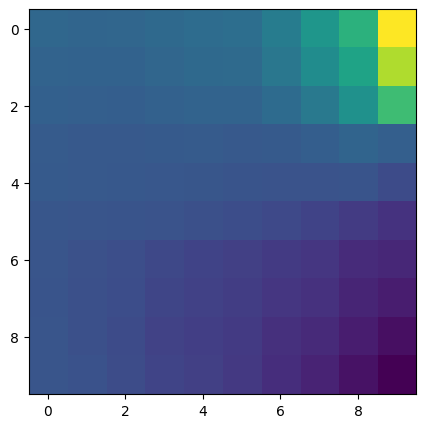

None, []


In [152]:
# 07

train_data = sentence_vectors

# Step 1: Convert the query sentences into vectors
query_sentences = ["barcelona"]
query_vectors = [model1.infer_vector(word_tokenize(sentence.lower())) for sentence in query_sentences]


# Step 2: Activate the SOM using the activate function for each query vector
activated_SOMs = []
for query_vector in query_vectors:
    activated_SOM = activate(train_data, som_model, query_vector)
    activated_SOMs.append(activated_SOM)

# Step 2: Activate the SOM using the activate function
activated_SOM = activate2(train_data, som_model, query_vector)

# plot
plt.figure(figsize=(5, 5))
im = plt.imshow(activated_SOM, aspect='auto')

plt.show()

# find the BMU
bmu, related_words = query_words(som_model, model1, query_sentences, data_dict)
print(f"{bmu}, {related_words}")

# Image Fuyu

In [35]:
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU1(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE
def find_BMU_2(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argpartition(cos_sims, -2, axis=None)[-2], cos_sims.shape)
def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU1(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)
def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p
def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p
def find_BMU1(SOM,x):
    somShape = SOM.shape
    simSOM = SOM.reshape((-1, len(x)))
    cos_sims = cosine_similarity([x], simSOM).reshape(somShape[:2])
    return np.unravel_index(np.argmax(cos_sims, axis=None), cos_sims.shape)

def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU1(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
def cosine(a,b):
    return cosine_similarity([a], [b])[0][0]

def u_matrix(lattice):
    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)
    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += cosine(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += cosine(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += cosine(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += cosine(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += cosine(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += cosine(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values
def activate1(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[cosine_similarity([normalP], [c])[0][0] for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    #activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM
def normalise_2(train):
    min_d = np.min(train, axis=0)
    max_d = np.max(train, axis=0)
    normalised_train = (train - min_d) / (max_d - min_d)
    return normalised_train
def find_closest_cos(data, v):
    cos_dist = cosine_similarity(data, [v])
    return np.argmax(cos_dist)

In [36]:
madrid_fuyu_text_list=[]
with open("Image_Textualisation.csv", 'r',encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for i in csvreader:
        madrid_fuyu_text_list.append(i[1])

In [37]:
clear_madrid_fuyu_text_list=[]
for i in madrid_fuyu_text_list:
    if i not in clear_madrid_fuyu_text_list:
        clear_madrid_fuyu_text_list.append(i)

In [38]:
preprocessed_madrid_fuyu_text_list=preprocess(clear_madrid_fuyu_text_list)

In [39]:
madrid_sentences=preprocessed_madrid_fuyu_text_list
tagged_data = [TaggedDocument(words=madrid_sentence.split(), tags=[str(i)]) for i, madrid_sentence in enumerate(madrid_sentences)]
model2 = Doc2Vec(vector_size=300, min_count=1, epochs=10)
model2.build_vocab(tagged_data)
model2.train(tagged_data, total_examples=model2.corpus_count, epochs=model2.epochs)
madrid_sentence_vectors = [model2.infer_vector(madrid_sentence.split()) for madrid_sentence in madrid_sentences]
#u_matrix = np.array(sentence_vectors)

In [40]:
with open('madrid_sentence_vectors.pkl', 'wb') as f:
    pickle.dump(madrid_sentence_vectors, f)

In [41]:
with open('madrid_sentence_vectors.pkl', 'rb') as f:
    madrid_sentence_vectors = pickle.load(f)

Epoch: 1, QE: 0.0759, TE: 0.199


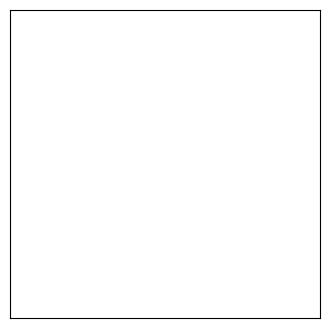

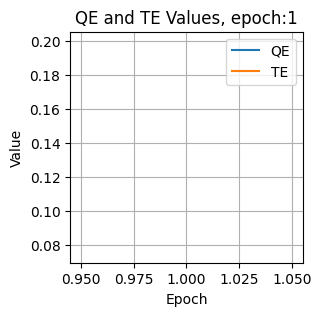

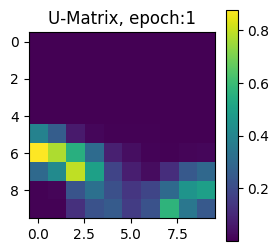

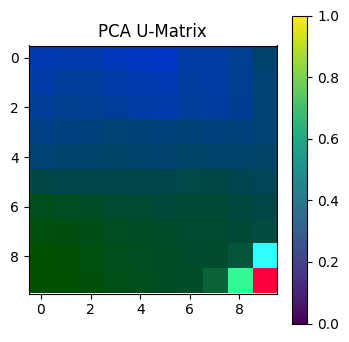

Epoch: 2, QE: 0.0862, TE: 0.2465


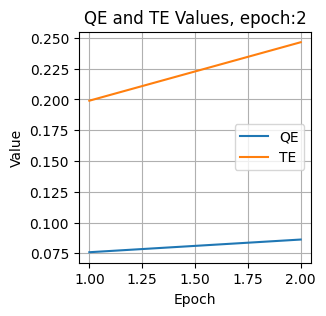

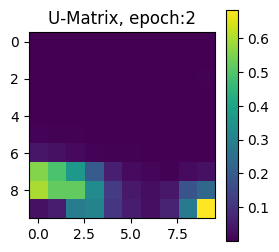

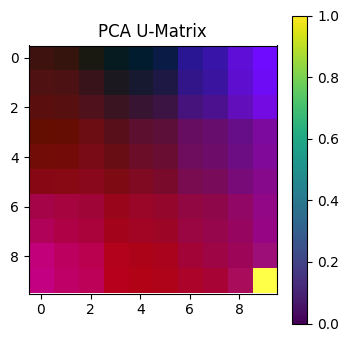

Epoch: 3, QE: 0.0832, TE: 0.2687


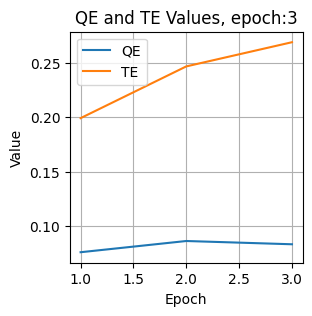

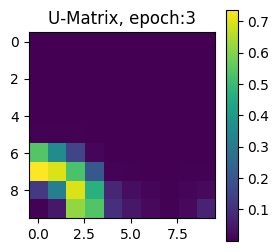

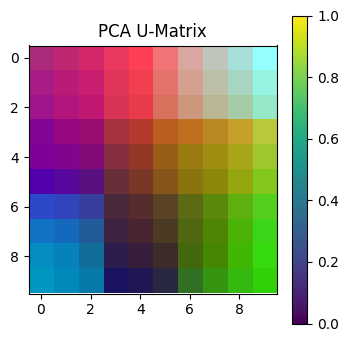

Epoch: 4, QE: 0.086, TE: 0.3152


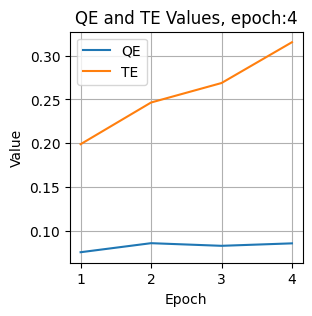

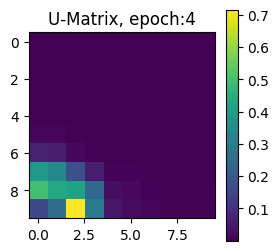

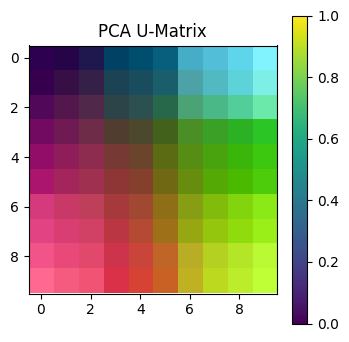

Epoch: 5, QE: 0.0835, TE: 0.3283


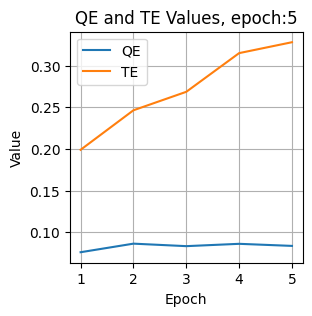

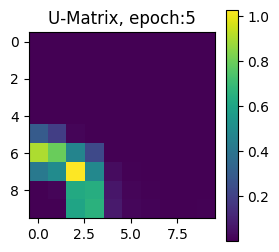

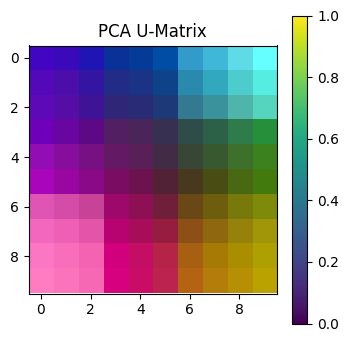

Epoch: 6, QE: 0.0831, TE: 0.2333


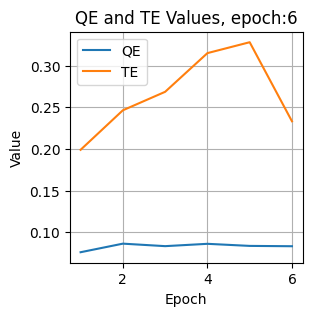

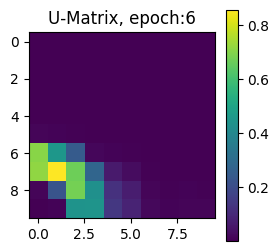

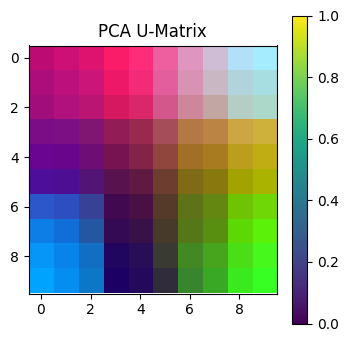

Epoch: 7, QE: 0.0851, TE: 0.2768


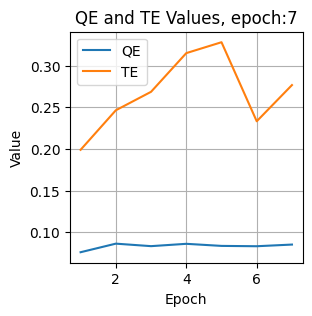

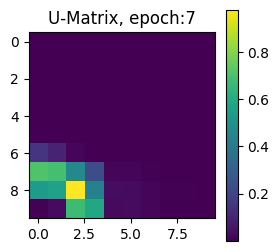

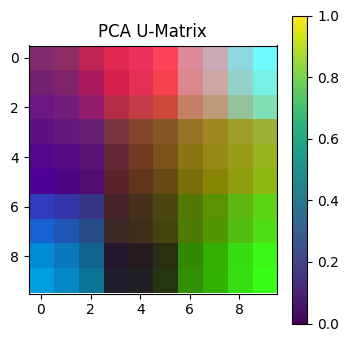

Epoch: 8, QE: 0.0837, TE: 0.3808


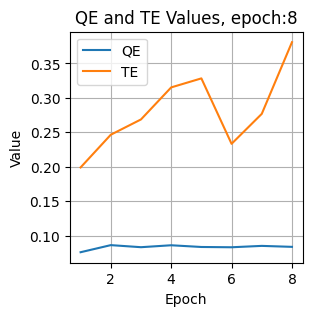

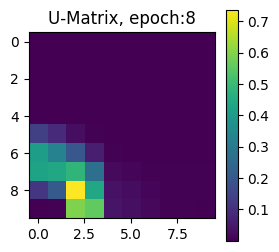

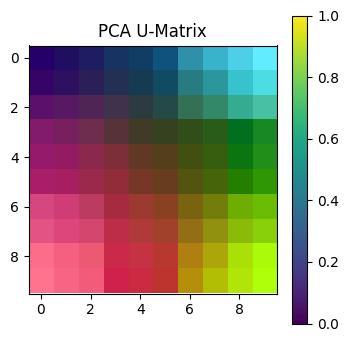

Epoch: 9, QE: 0.0861, TE: 0.2333


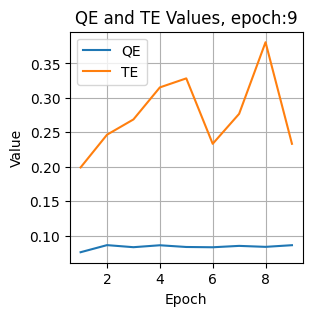

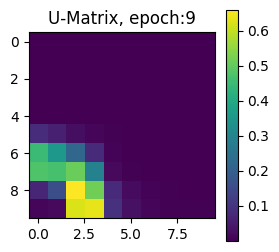

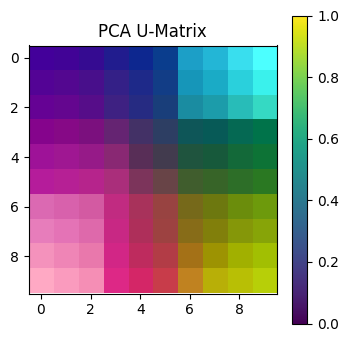

Epoch: 10, QE: 0.0838, TE: 0.3162


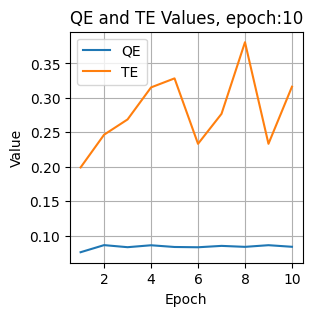

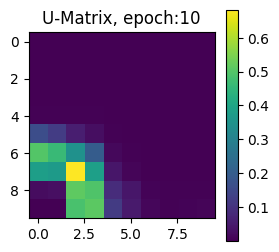

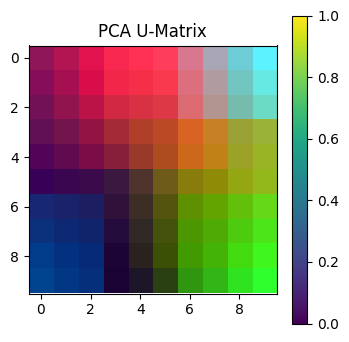

Epoch: 11, QE: 0.0819, TE: 0.2657


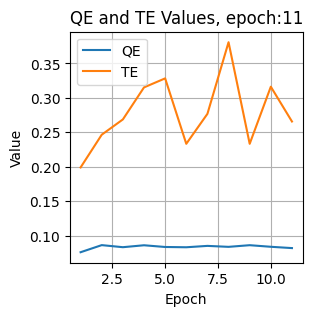

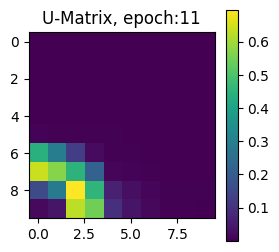

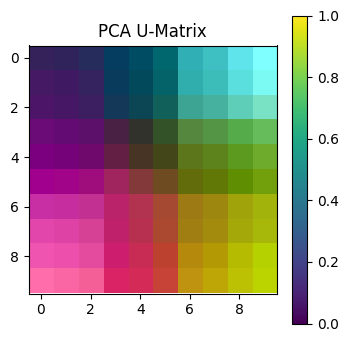

Epoch: 12, QE: 0.0816, TE: 0.3061


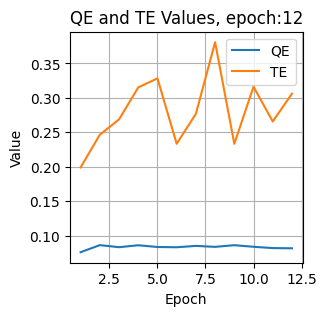

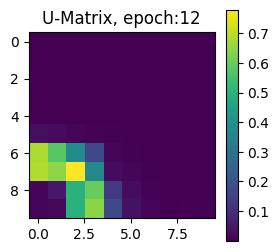

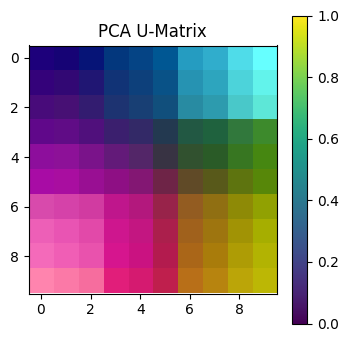

Epoch: 13, QE: 0.0829, TE: 0.3141


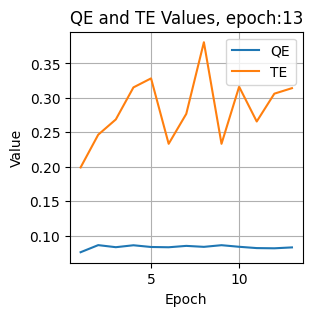

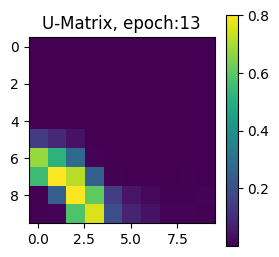

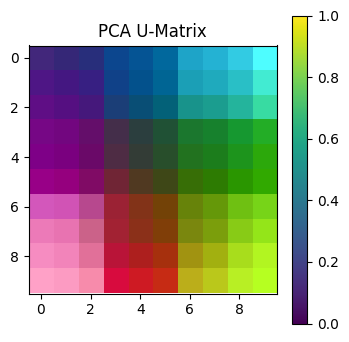

Epoch: 14, QE: 0.0889, TE: 0.2263


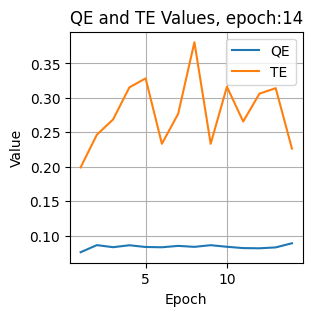

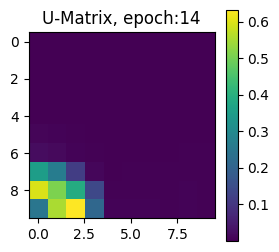

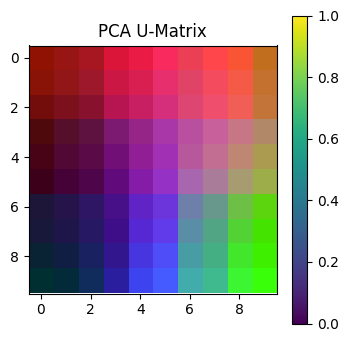

Epoch: 15, QE: 0.082, TE: 0.1566


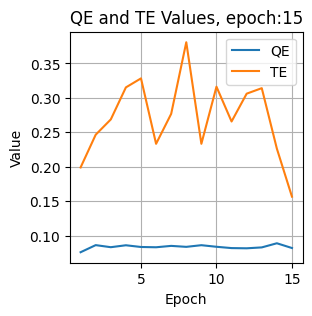

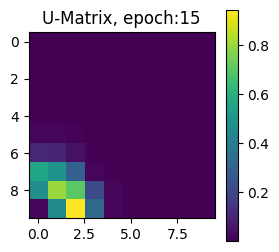

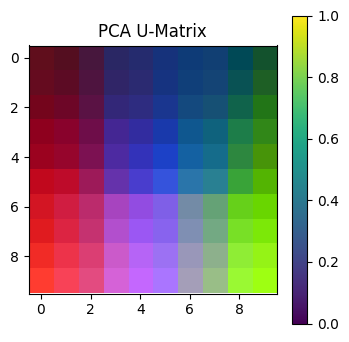

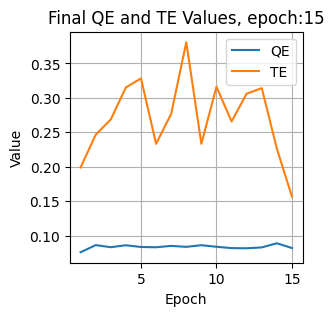

In [42]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Create a U-matrix with PCA components as RGB values
    u_matrix_pca = som_pca_norm.reshape(SOM.shape[:-1] + (3,))

    # Plot the U-matrix with PCA colors
    plt.figure(figsize=(4, 4))
    plt.imshow(u_matrix_pca)
    plt.title('PCA U-Matrix')
    plt.colorbar()
    plt.show()

# Initialize SOM grid dimensions
m = 10
n = 10

# Initialize training data
train_data = madrid_sentence_vectors

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([15], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(3, 3))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix, epoch:'+str(epoch))
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Final QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

In [43]:
SOM= SOMS[11]

In [44]:
QE = QE_values[11]
TE = TE_values[11]

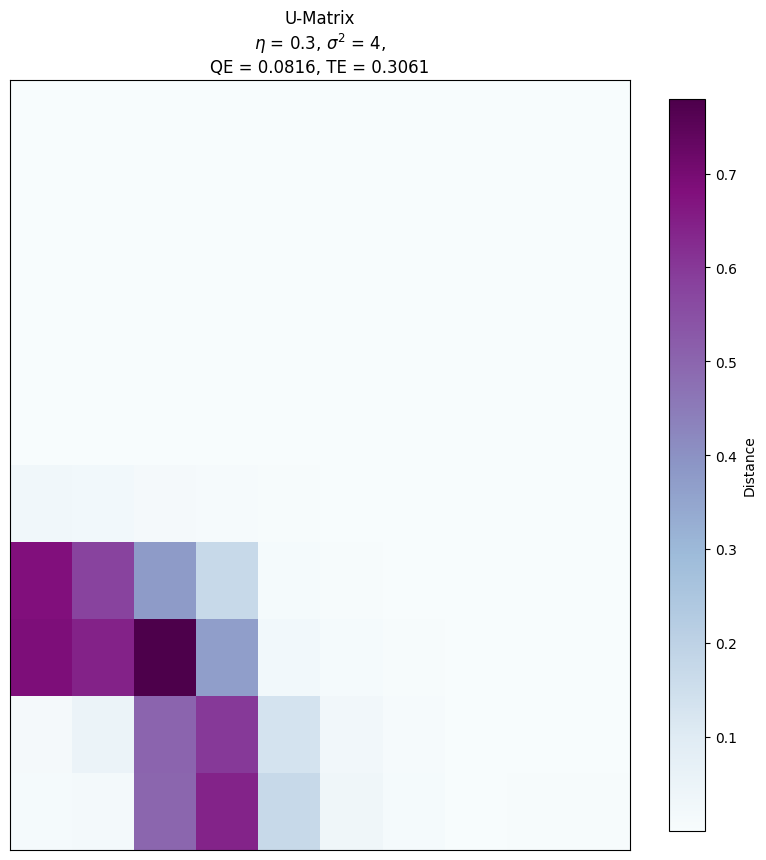

In [45]:
u_matrix_values = u_matrix(SOM)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [46]:
madrid_fuyu_som_model = SOMS[11]

In [47]:
with open('madrid_fuyu_som_model.pkl', 'wb') as f:
    pickle.dump(madrid_fuyu_som_model, f)

In [48]:
with open('madrid_fuyu_som_model.pkl', 'rb') as f:
    loaded_madrid_fuyu_som_model = pickle.load(f)

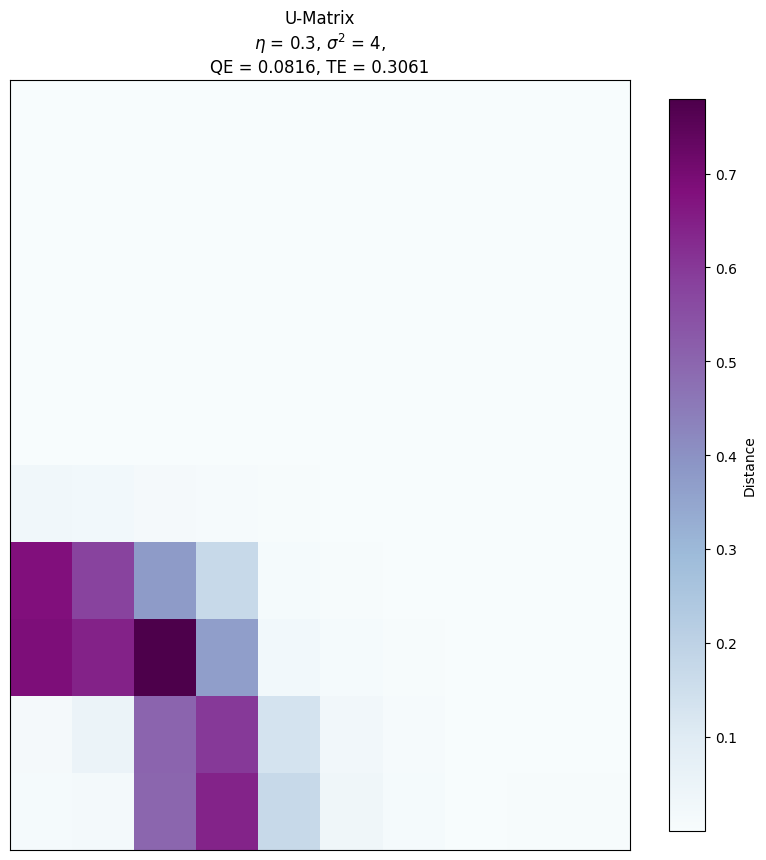

In [49]:
u_matrix_values = u_matrix(loaded_madrid_fuyu_som_model)
QE = round(calculateQE(loaded_madrid_fuyu_som_model, madrid_sentence_vectors), 4)
TE = round(calculateTE(loaded_madrid_fuyu_som_model, madrid_sentence_vectors), 4)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [50]:
madrid_fuyu_dict = []
for i in range(len(loaded_madrid_fuyu_som_model)):
    row = []
    for j in range(len(loaded_madrid_fuyu_som_model[0])):
        row.append([])
    madrid_fuyu_dict.append(row)
madridvectortextPairs=[]
for i in range(0,len(clear_madrid_fuyu_text_list)):
    madridvectortext={}
    madridvectortext['text']=clear_madrid_fuyu_text_list[i]
    madridvectortext['vector']=madrid_sentence_vectors[i]
    madridvectortextPairs.append(madridvectortext)
for i in madridvectortextPairs:
    g,h = find_BMU1(loaded_madrid_fuyu_som_model,i['vector'])
    madrid_fuyu_dict[g][h].append(i)

In [51]:
with open('madrid_fuyu_dict.pkl', 'wb') as f:
    pickle.dump(madrid_fuyu_dict, f)

In [52]:
with open('madrid_fuyu_dict.pkl', 'rb') as f:
    madrid_fuyu_dict = pickle.load(f)

### Defining Search Function

In [53]:
def searchmadridfuyusom(query):
    result=[]
    query=[query]
    preprocessed_query=preprocess(query)
    query_vector = model2.infer_vector(preprocessed_query[0].split())
    activatedSOM = activate1(madrid_sentence_vectors, loaded_madrid_fuyu_som_model, query_vector)
    fig = plt.figure()
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    similarities = {}
    for i in madrid_fuyu_dict[g][h]:
        vector_array = np.array([i['vector']])
        vector_array = vector_array.reshape(1, -1) 
        similarities[i['text']] = cosine_similarity(vector_array, [loaded_madrid_fuyu_som_model[g][h]])
    biggest = None
    max_similarity = similarities[madrid_fuyu_dict[g][h][0]['text']]
    for i in madrid_fuyu_dict[g][h]:
        sim = similarities[i['text']]
        if sim > max_similarity:
            max_similarity = sim
            biggest = i['text']
    result.append(biggest)
    return result

In [197]:
def searchmadridfuyusom(query):
    result = []
    query = [query]
    preprocessed_query = preprocess(query)
    query_vector = model1.infer_vector(preprocessed_query[0].split())
    activatedSOM = activate1(sentence_vectors, loaded_text_som_model, query_vector)
    
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
    g, h = find_BMU1(loaded_text_som_model, query_vector)
    
    # 检查索引是否有效
    if g < len(madrid_fuyu_dict) and h < len(madrid_fuyu_dict[0]):
        similarities = {}
        for i in madrid_fuyu_dict[g][h]:
            vector_array = np.array([i['vector']])
            vector_array = vector_array.reshape(1, -1) 
            similarities[i['text']] = cosine_similarity(vector_array, [loaded_text_som_model[g][h]])
        biggest = None
        max_similarity = similarities[madrid_fuyu_dict[g][h][0]['text']]
        for i in madrid_fuyu_dict[g][h]:
            sim = similarities[i['text']]
            if sim > max_similarity:
                max_similarity = sim
                biggest = i['text']
        result.append(biggest)
    else:
        print("BMU index out of range.")

    return result

<Figure size 640x480 with 0 Axes>

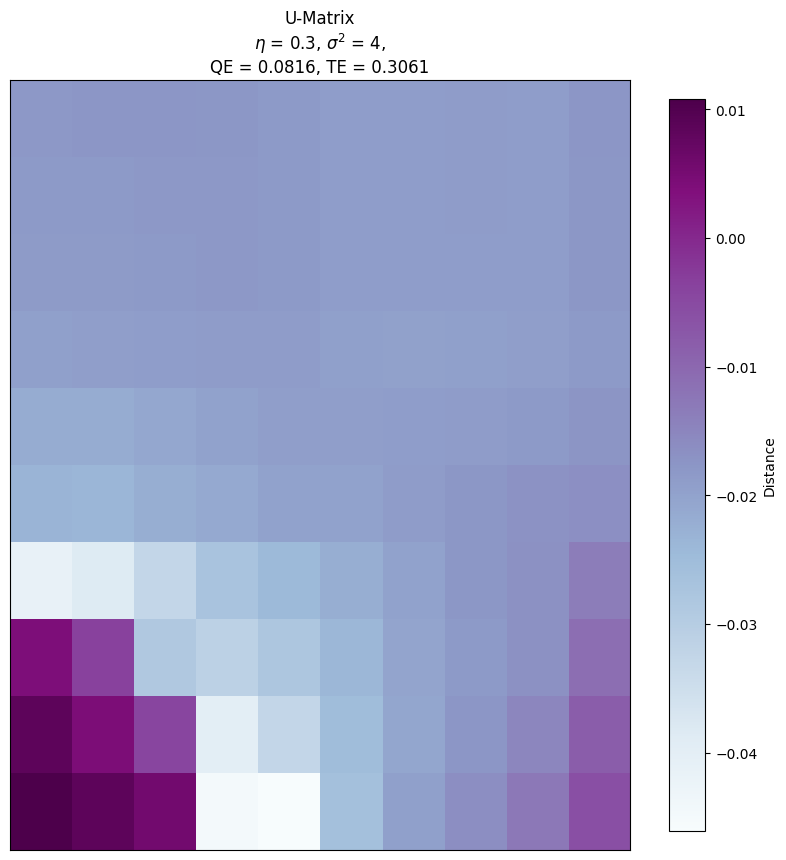

['In the image, there is a large crowd of people gathered together, with some of them wearing face masks. They are standing and walking around an outdoor market area.\n']

In [54]:
searchmadridfuyusom('She is not a doll.')

# IndieFilm Fuyu

In [236]:
indiefilms_fuyu_text_list=[]
with open("Frame_Textualisation.csv", 'r',encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for i in csvreader:
        indiefilms_fuyu_text_list.append(i[1])

In [237]:
clear_indiefilms_fuyu_text_list=[]
for i in indiefilms_fuyu_text_list:
    if i not in clear_indiefilms_fuyu_text_list:
        clear_indiefilms_fuyu_text_list.append(i)

In [238]:
preprocessed_indiefilms_fuyu_text_list=preprocess(clear_indiefilms_fuyu_text_list)

In [239]:
indiefilms_sentences=preprocessed_indiefilms_fuyu_text_list
tagged_data = [TaggedDocument(words=indiefilms_sentence.split(), tags=[str(i)]) for i, indiefilms_sentence in enumerate(indiefilms_sentences)]
model2 = Doc2Vec(vector_size=300, min_count=1, epochs=10)
model2.build_vocab(tagged_data)
model2.train(tagged_data, total_examples=model2.corpus_count, epochs=model2.epochs)
indiefilms_sentence_vectors = [model2.infer_vector(indiefilms_sentence.split()) for indiefilms_sentence in indiefilms_sentences]
#u_matrix = np.array(sentence_vectors)

In [240]:
with open('indiefilms_sentence_vectors.pkl', 'wb') as f:
    pickle.dump(indiefilms_sentence_vectors, f)

In [241]:
with open('indiefilms_sentence_vectors.pkl', 'rb') as f:
    indiefilms_sentence_vectors = pickle.load(f)

Epoch: 1, QE: 0.0677, TE: 0.7135


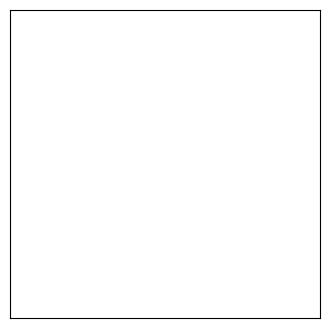

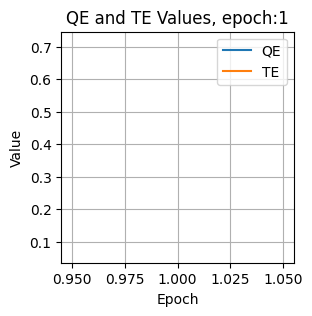

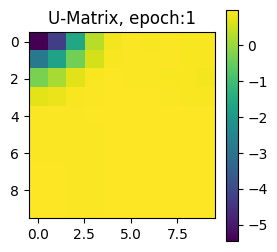

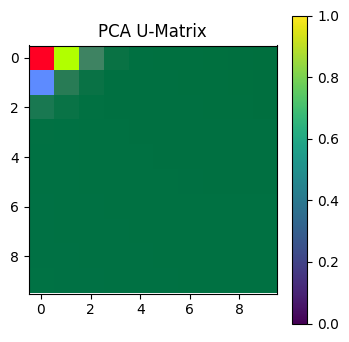

Epoch: 2, QE: 0.0587, TE: 0.6895


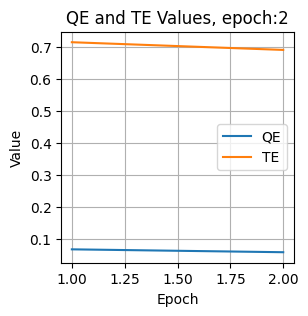

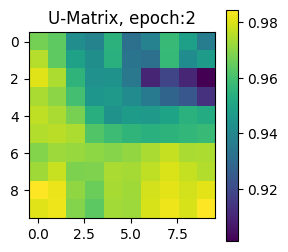

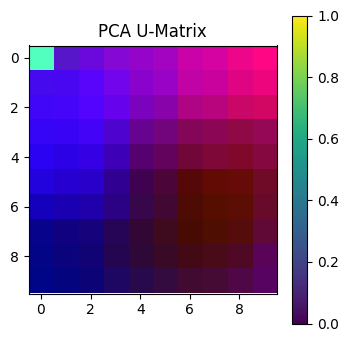

Epoch: 3, QE: 0.0585, TE: 0.6913


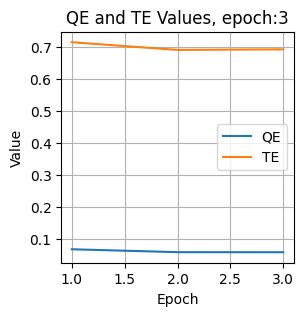

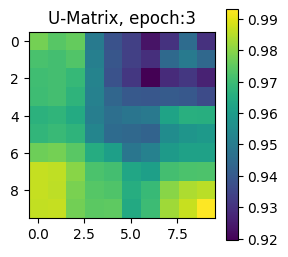

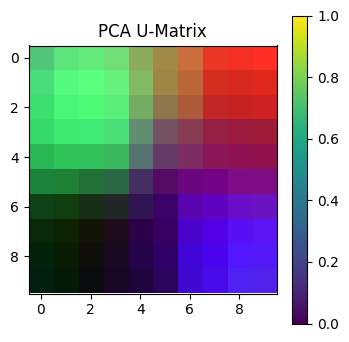

Epoch: 4, QE: 0.0578, TE: 0.671


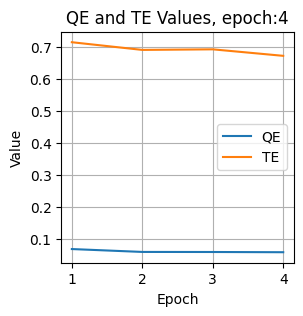

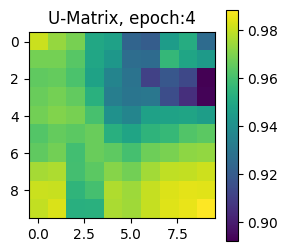

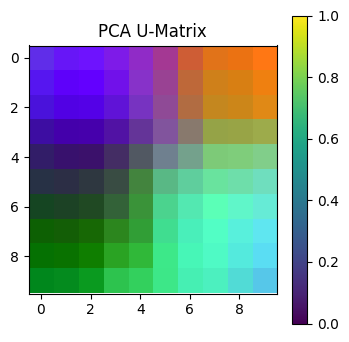

Epoch: 5, QE: 0.0567, TE: 0.6322


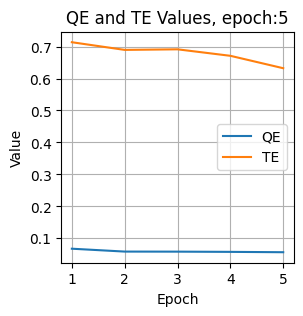

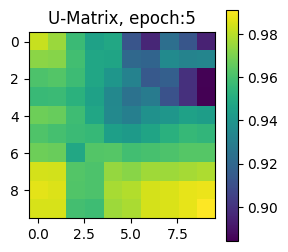

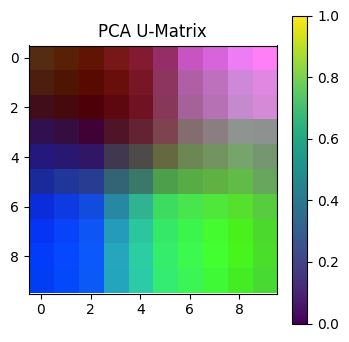

Epoch: 6, QE: 0.0572, TE: 0.6627


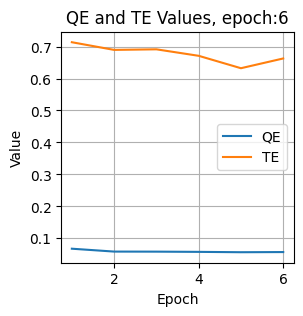

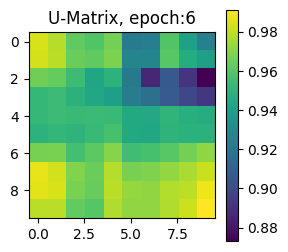

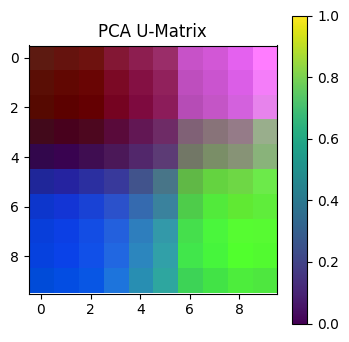

Epoch: 7, QE: 0.0569, TE: 0.6322


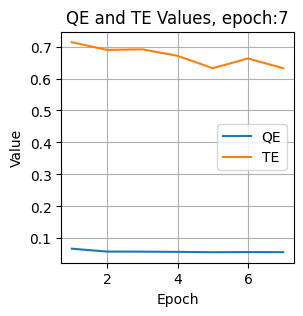

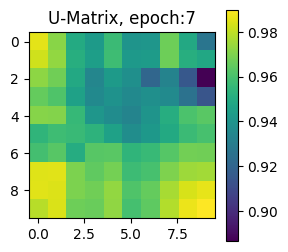

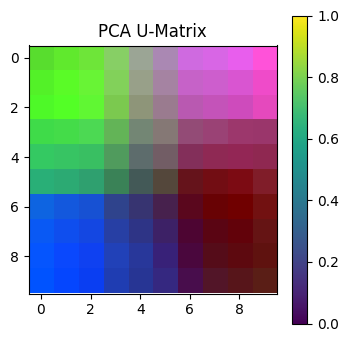

Epoch: 8, QE: 0.0572, TE: 0.6312


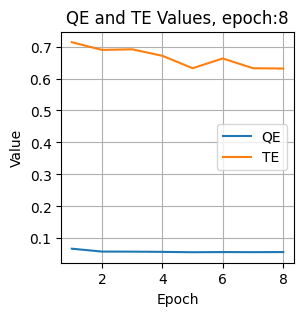

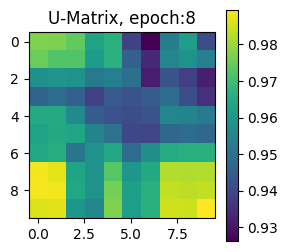

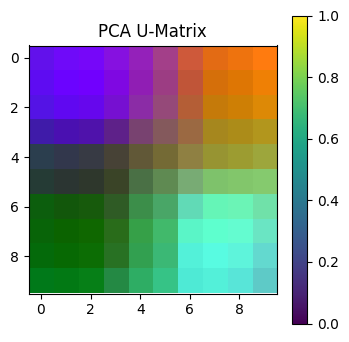

Epoch: 9, QE: 0.0577, TE: 0.7135


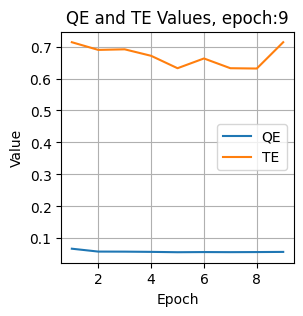

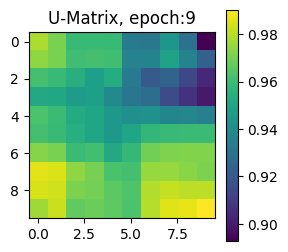

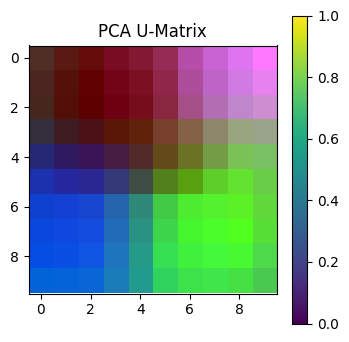

Epoch: 10, QE: 0.0573, TE: 0.6275


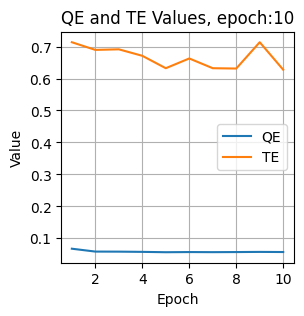

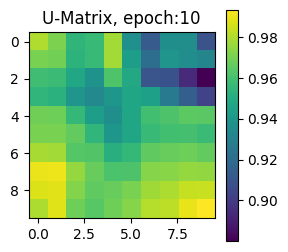

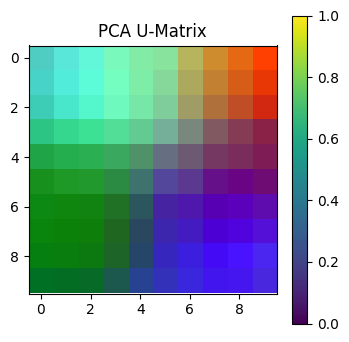

Epoch: 11, QE: 0.0572, TE: 0.6155


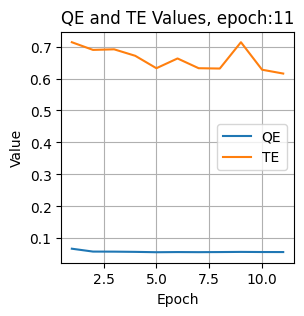

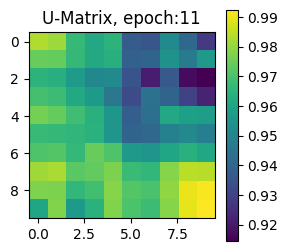

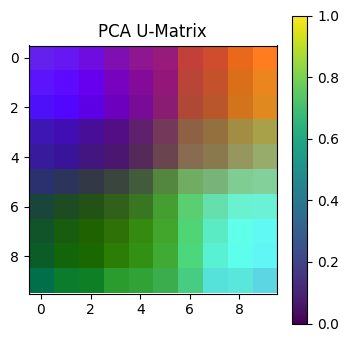

Epoch: 12, QE: 0.0587, TE: 0.646


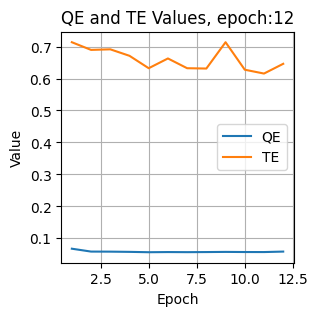

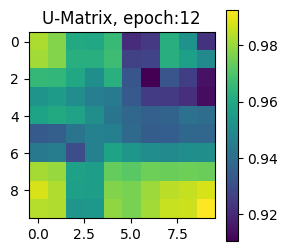

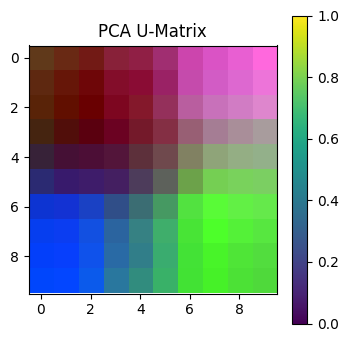

Epoch: 13, QE: 0.0576, TE: 0.6488


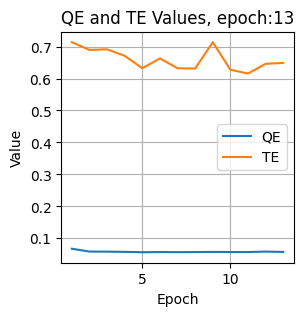

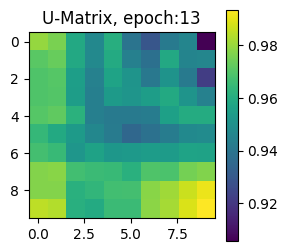

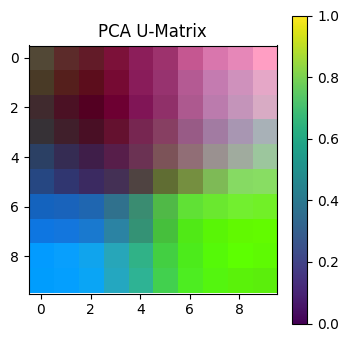

Epoch: 14, QE: 0.0568, TE: 0.7015


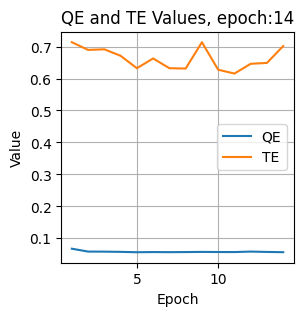

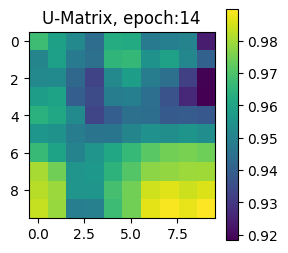

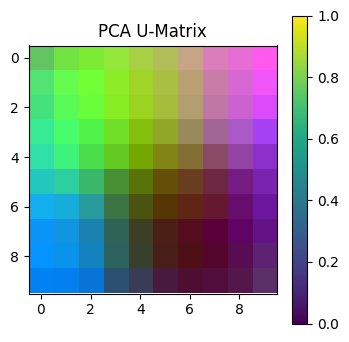

Epoch: 15, QE: 0.0569, TE: 0.6599


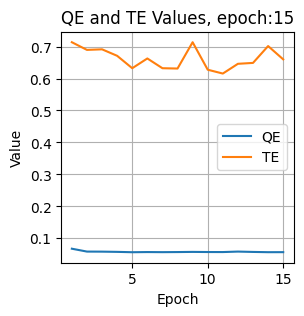

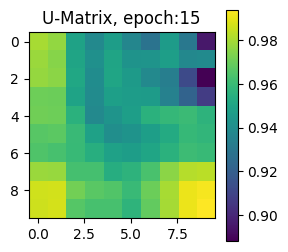

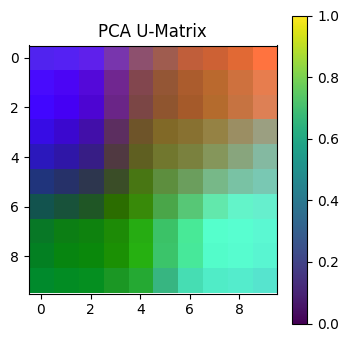

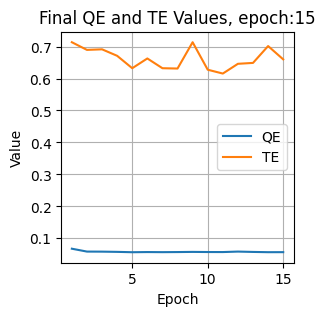

In [286]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Create a U-matrix with PCA components as RGB values
    u_matrix_pca = som_pca_norm.reshape(SOM.shape[:-1] + (3,))

    # Plot the U-matrix with PCA colors
    plt.figure(figsize=(4, 4))
    plt.imshow(u_matrix_pca)
    plt.title('PCA U-Matrix')
    plt.colorbar()
    plt.show()

# Initialize SOM grid dimensions
m = 10
n = 10

# Initialize training data
train_data = indiefilms_sentence_vectors

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([15], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(3, 3))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix, epoch:'+str(epoch))
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(3, 3))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Final QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

In [405]:
SOM= SOMS[14]

In [406]:
QE = QE_values[14]
TE = TE_values[14]

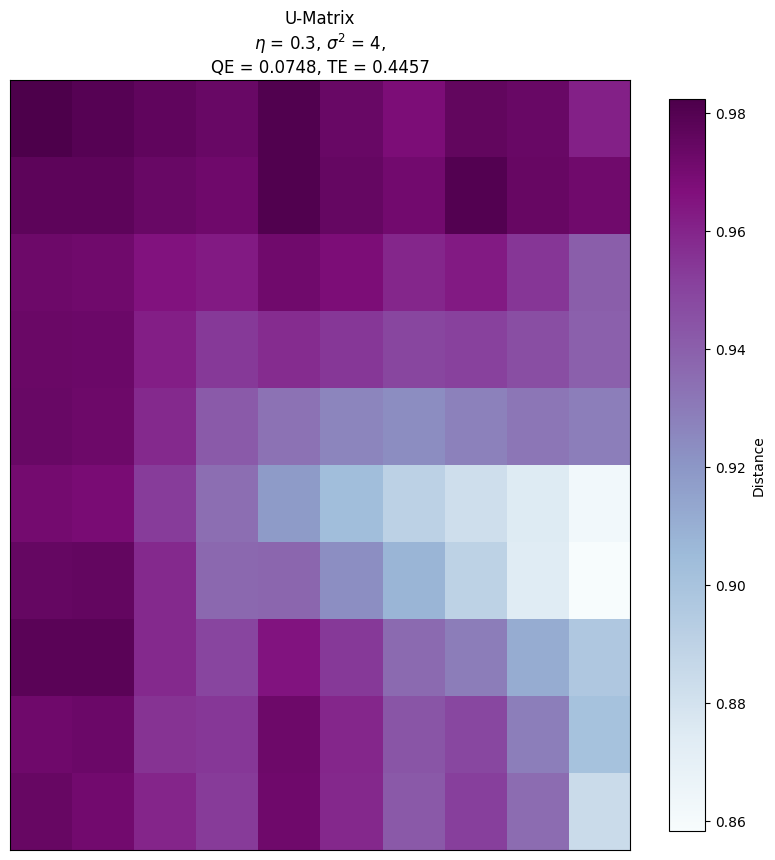

In [407]:
u_matrix_values = u_matrix(SOM)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [290]:
indiefilms_fuyu_som_model = SOMS[14]

In [291]:
with open('indiefilms_fuyu_som_model.pkl', 'wb') as f:
    pickle.dump(indiefilms_fuyu_som_model, f)

In [292]:
with open('indiefilms_fuyu_som_model.pkl', 'rb') as f:
    loaded_indiefilms_fuyu_som_model = pickle.load(f)

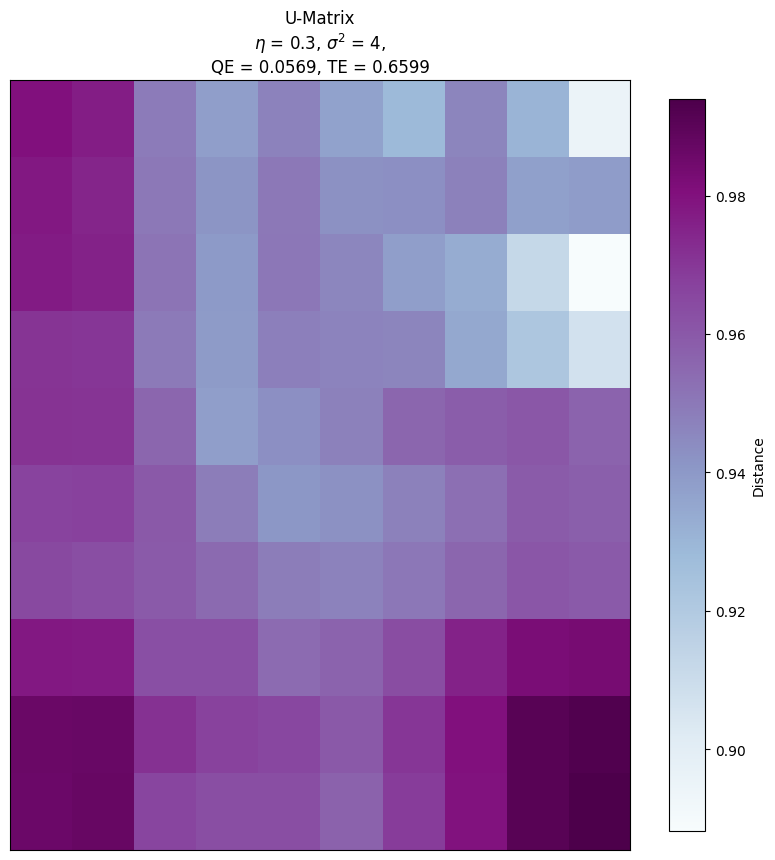

In [293]:
indiefilms_fuyu_u_matrix_values = u_matrix(loaded_indiefilms_fuyu_som_model)
QE = round(calculateQE(loaded_indiefilms_fuyu_som_model, indiefilms_sentence_vectors), 4)
TE = round(calculateTE(loaded_indiefilms_fuyu_som_model, indiefilms_sentence_vectors), 4)

plt.figure(figsize=(10, 10))
im = plt.imshow(indiefilms_fuyu_u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [294]:
indiefilms_fuyu_dict = []
for i in range(len(loaded_indiefilms_fuyu_som_model)):
    row = []
    for j in range(len(loaded_indiefilms_fuyu_som_model[0])):
        row.append([])
    indiefilms_fuyu_dict.append(row)
indiefilmsvectortextPairs=[]
for i in range(0,len(clear_indiefilms_fuyu_text_list)):
    indiefilmsvectortext={}
    indiefilmsvectortext['text']=clear_indiefilms_fuyu_text_list[i]
    indiefilmsvectortext['vector']=indiefilms_sentence_vectors[i]
    indiefilmsvectortextPairs.append(indiefilmsvectortext)
for i in indiefilmsvectortextPairs:
    g,h = find_BMU1(loaded_indiefilms_fuyu_som_model,i['vector'])
    indiefilms_fuyu_dict[g][h].append(i)

In [295]:
with open('indiefilms_fuyu_dict.pkl', 'wb') as f:
    pickle.dump(indiefilms_fuyu_dict, f)

In [296]:
with open('indiefilms_fuyu_dict.pkl', 'rb') as f:
    indiefilms_fuyu_dict = pickle.load(f)

In [297]:
def searchindiefilmsfuyusom(query):
    result=[]
    query=[query]
    preprocessed_query=preprocess(query)
    query_vector = model2.infer_vector(preprocessed_query[0].split())
    activatedSOM = activate1(indiefilms_sentence_vectors, loaded_indiefilms_fuyu_som_model, query_vector)
    fig = plt.figure()
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    similarities = {}
    for i in indiefilms_fuyu_dict[g][h]:
        vector_array = np.array([i['vector']])
        vector_array = vector_array.reshape(1, -1) 
        similarities[i['text']] = cosine_similarity(vector_array, [loaded_indiefilms_fuyu_som_model[g][h]])
    biggest = None
    max_similarity = similarities[indiefilms_fuyu_dict[g][h][0]['text']]
    for i in indiefilms_fuyu_dict[g][h]:
        sim = similarities[i['text']]
        if sim > max_similarity:
            max_similarity = sim
            biggest = i['text']
    result.append(biggest)
    return result

# Madrid Images

In [55]:
model3 = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3),
  include_top=False,
  pooling='avg'
)

In [56]:
madridFiles = os.listdir('D:\\FinalAssignment\\Images')

In [57]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [58]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file,
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

In [59]:
madridfeatures = []
for m in madridFiles:
    if m != '.DS_Store':
        path = os.path.join('D:\\FinalAssignment\\Images', m)
        f = processImage(path, model3)
        madridfeatures.append(f)

1/1 [==============================] - 0s 65ms/step


In [60]:
with open('madridfeatures.pkl', 'wb') as f:
    pickle.dump(madridfeatures, f)

In [61]:
with open('madridfeatures.pkl', 'rb') as f:
    madridfeatures = pickle.load(f)

In [62]:
madridfeatureImagePairs = []
for i in range(len(madridfeatures)):
    featureImage = {}
    featureImage['image'] = madridFiles[i]
    featureImage['feature'] = madridfeatures[i]
    madridfeatureImagePairs.append(featureImage)

In [63]:
def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p
def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

In [64]:
def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):
    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values

In [65]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

Epoch: 1, QE: 0.156, TE: 0.3571


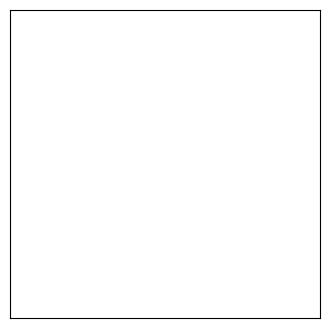

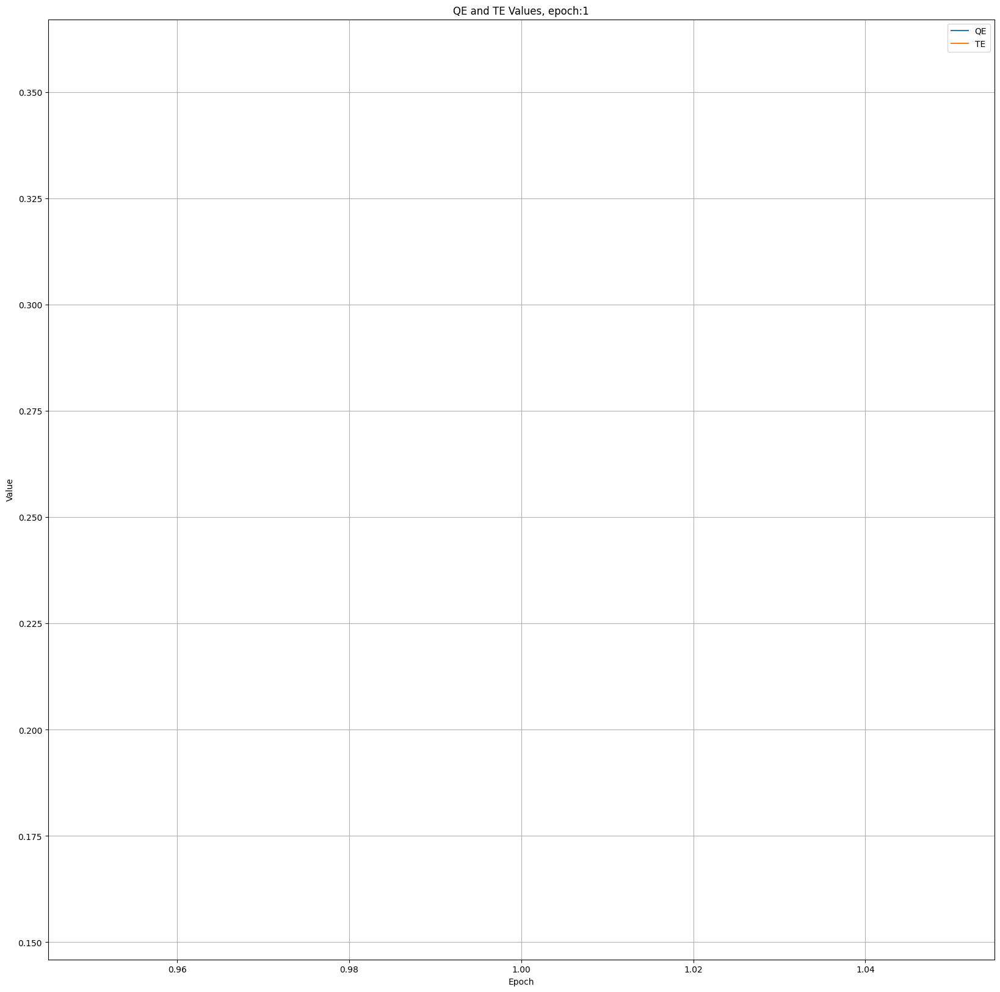

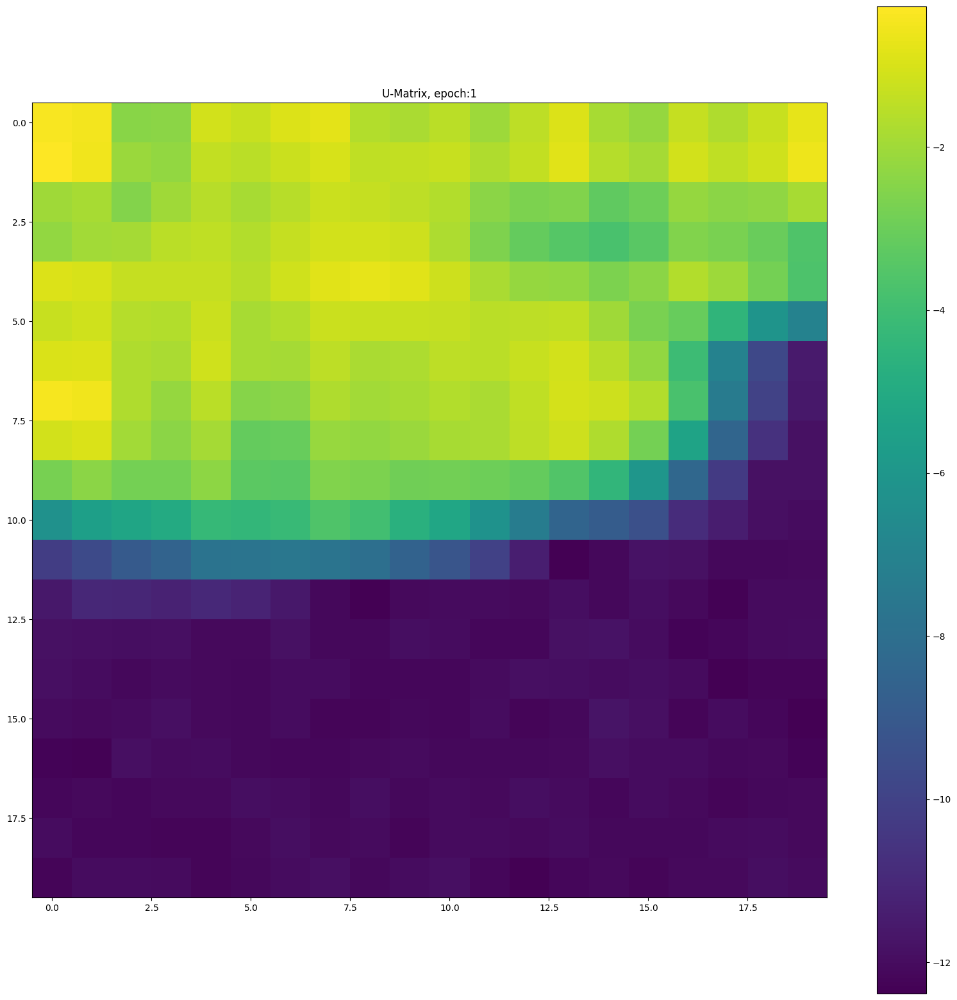

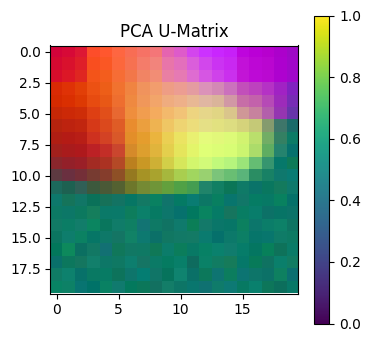

Epoch: 2, QE: 0.1518, TE: 0.3737


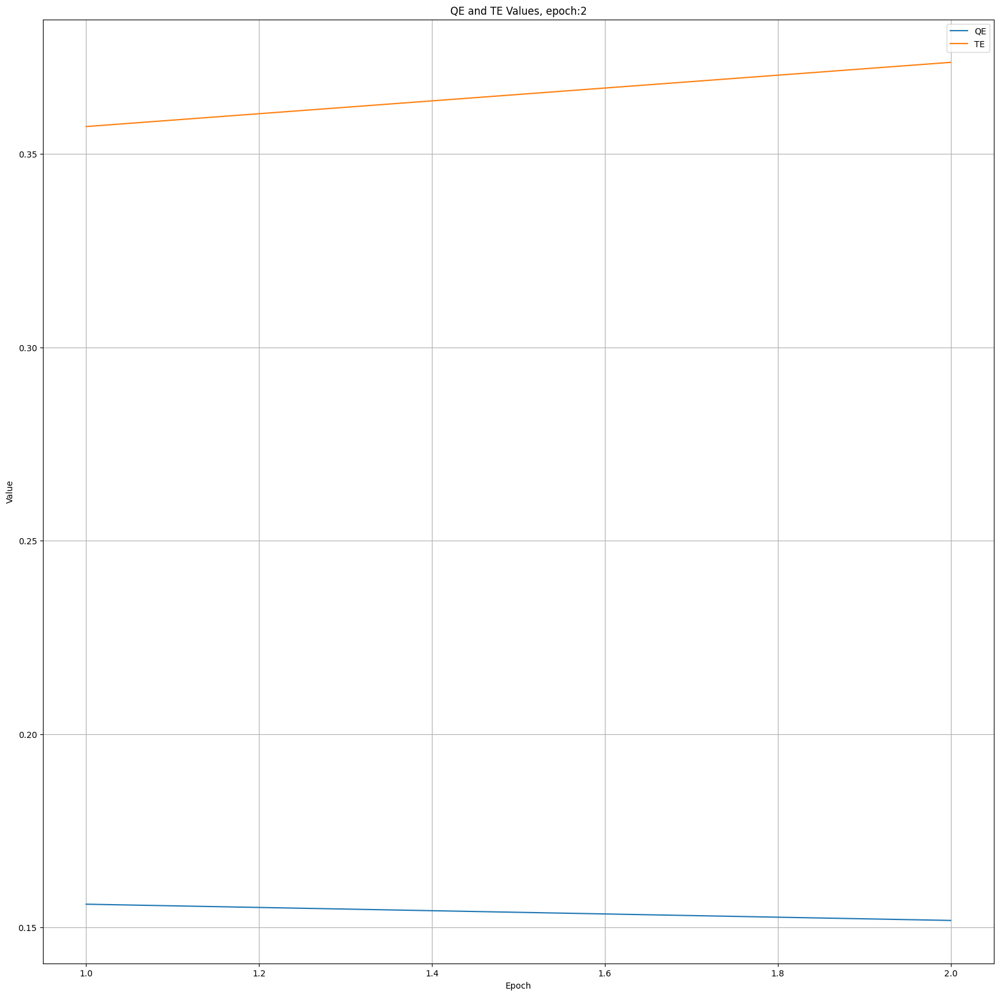

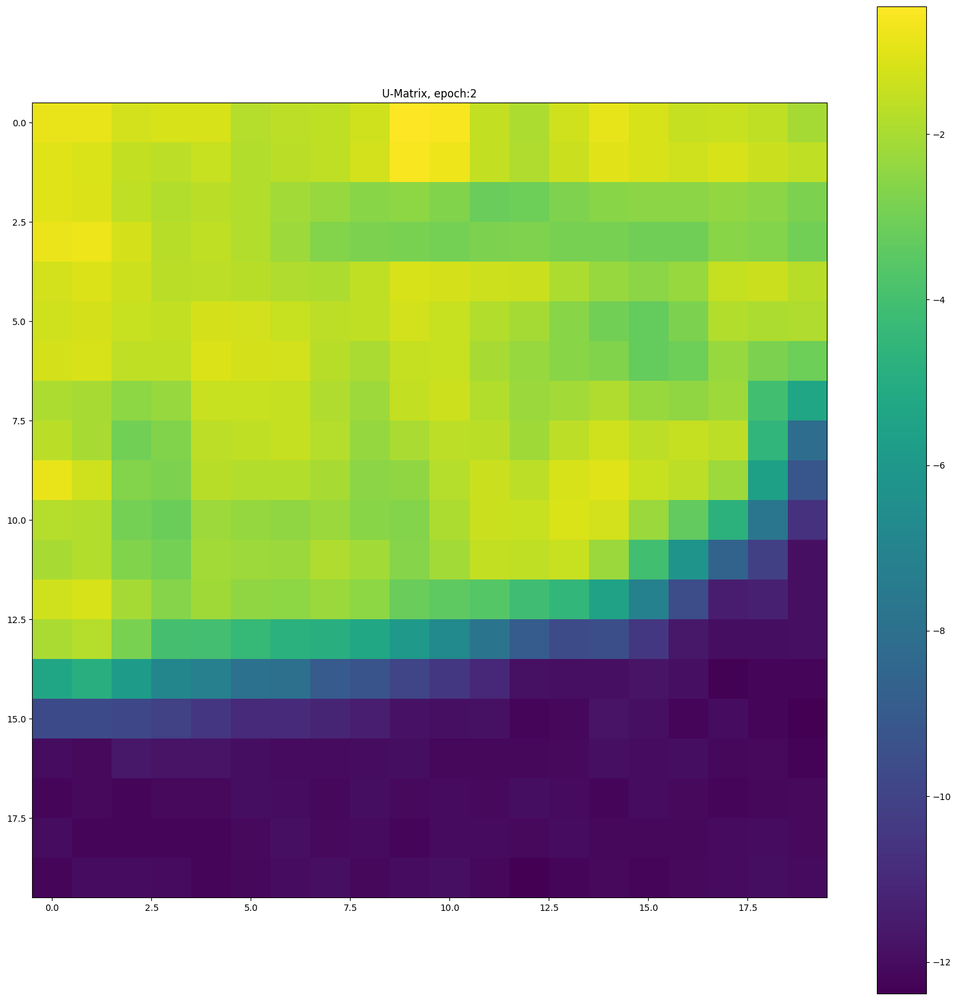

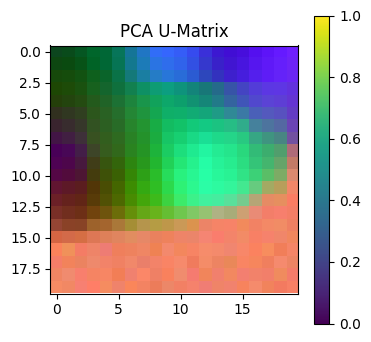

Epoch: 3, QE: 0.1482, TE: 0.3415


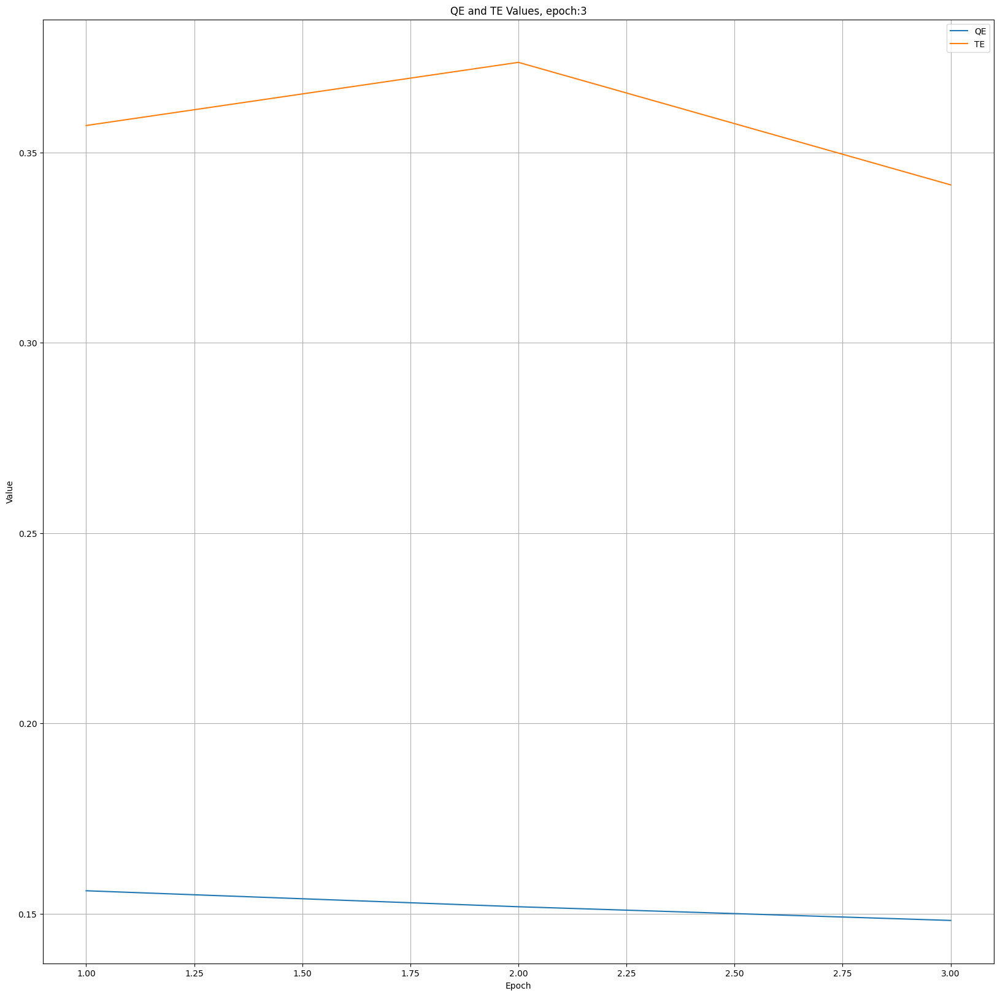

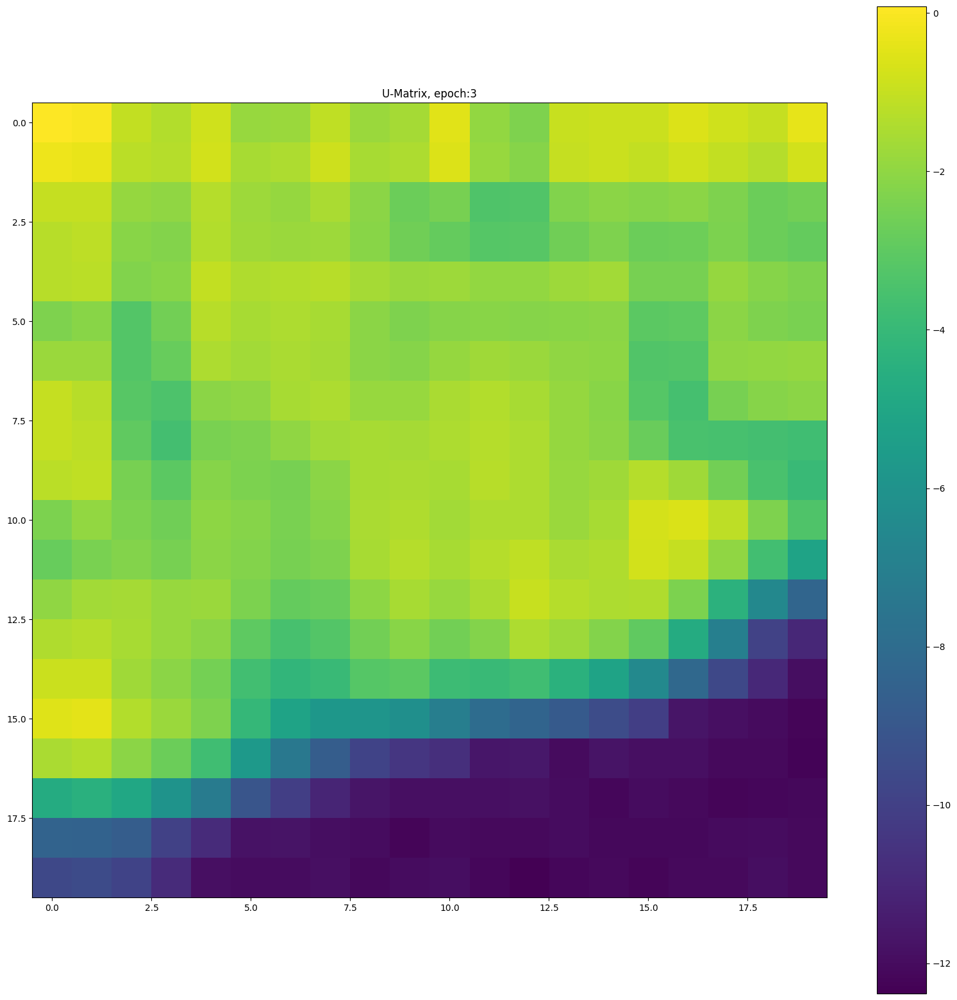

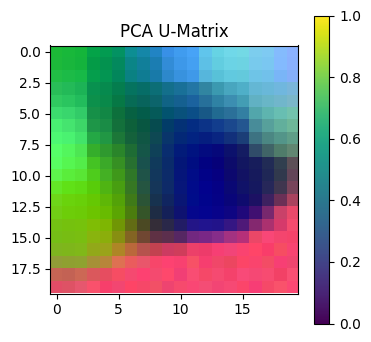

Epoch: 4, QE: 0.146, TE: 0.3473


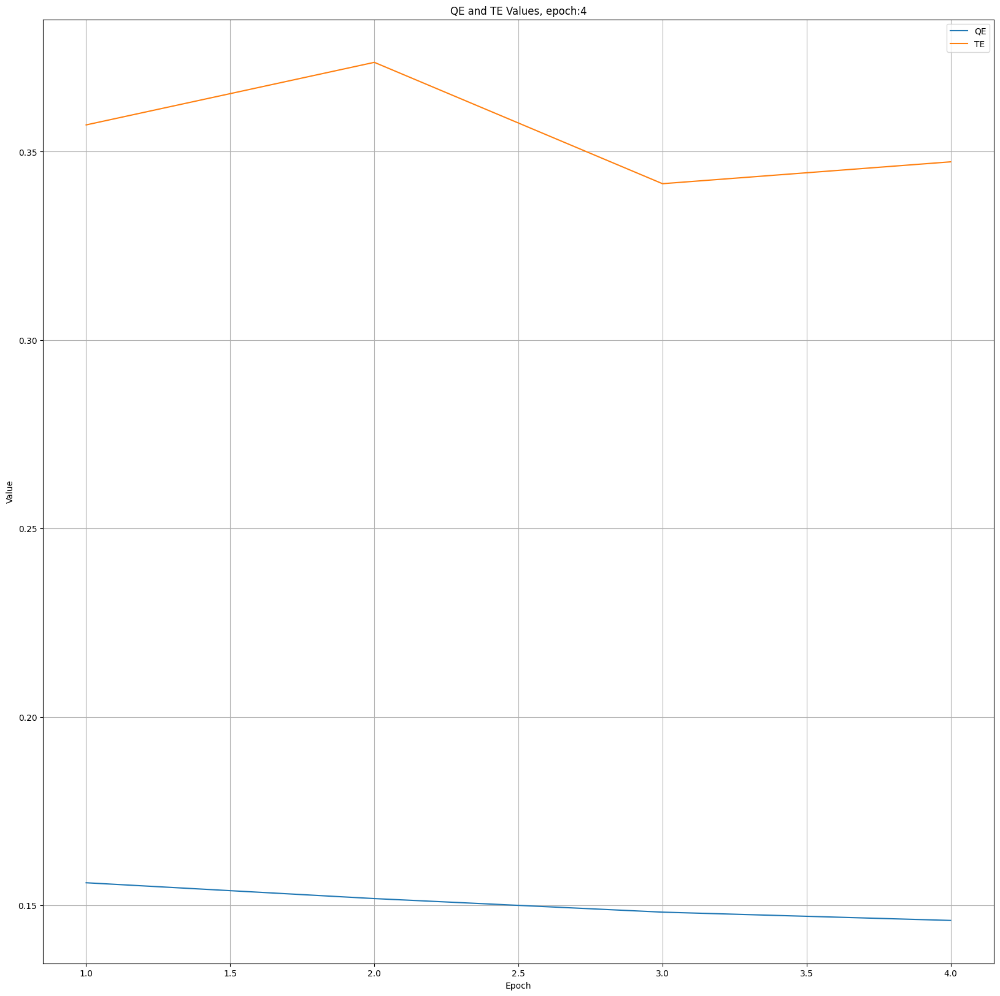

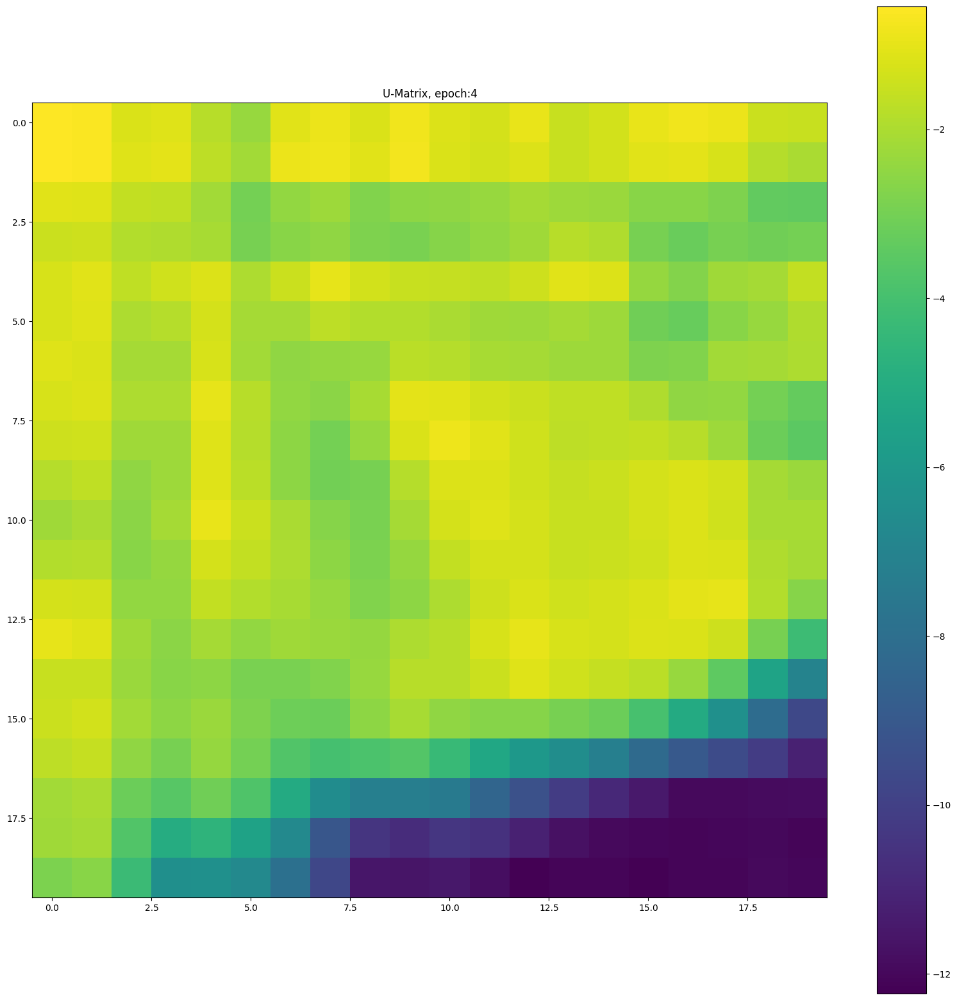

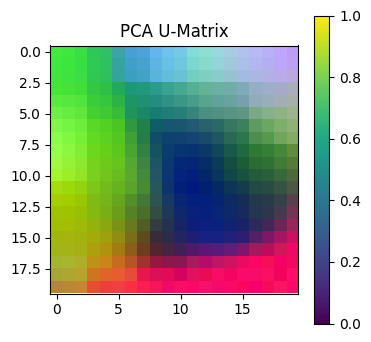

Epoch: 5, QE: 0.1454, TE: 0.3473


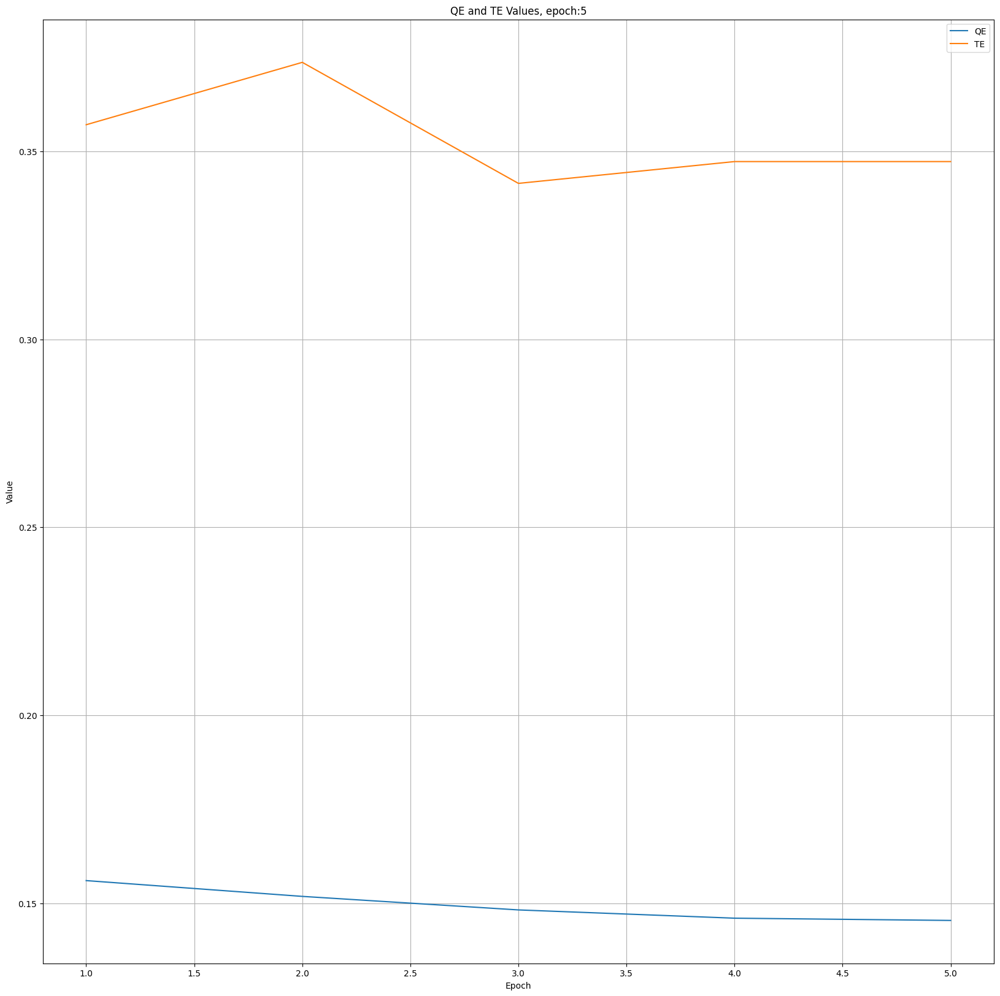

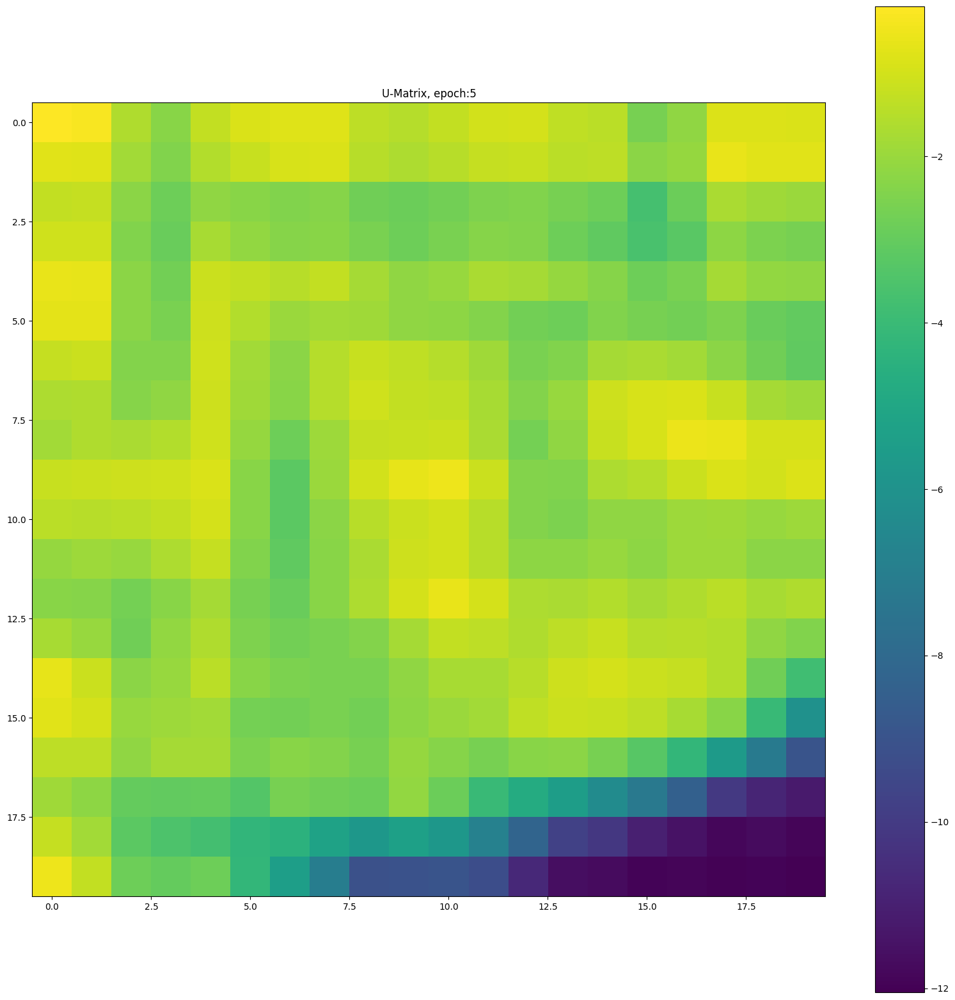

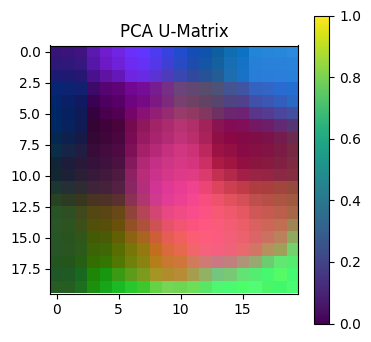

Epoch: 6, QE: 0.1443, TE: 0.3171


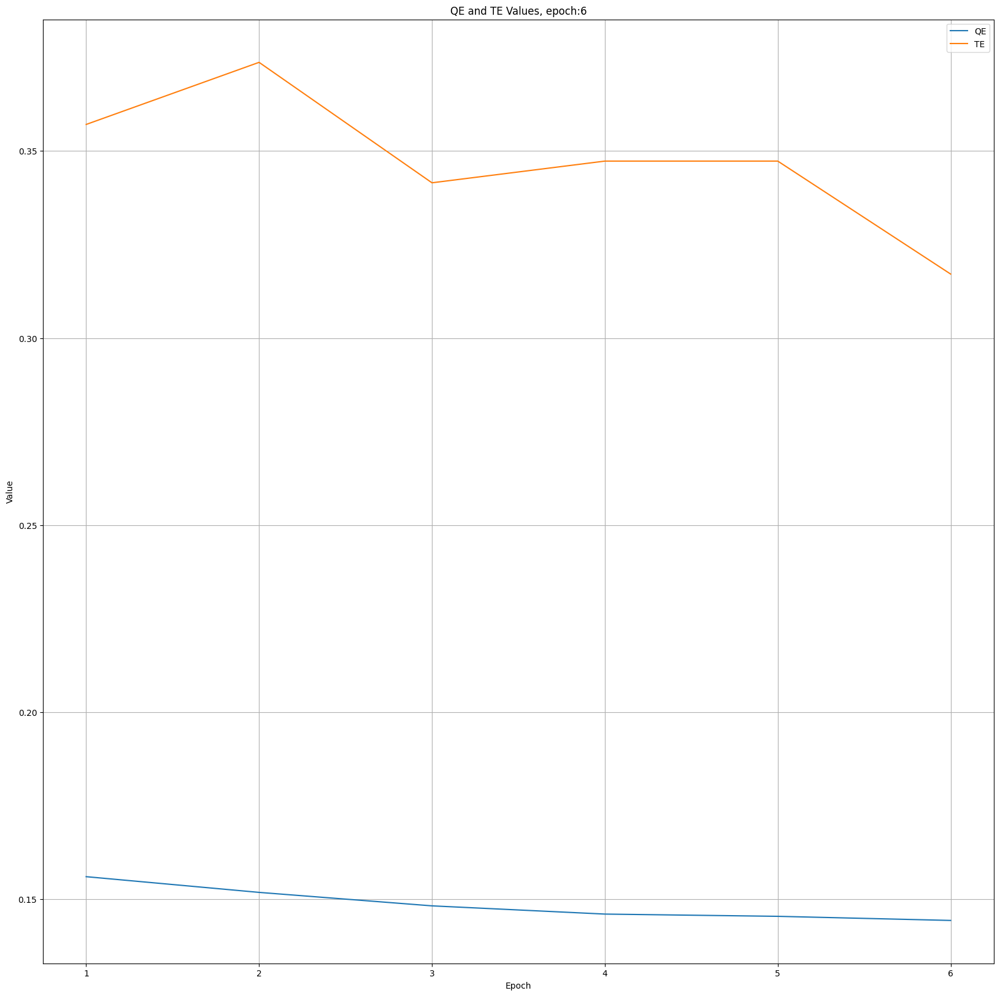

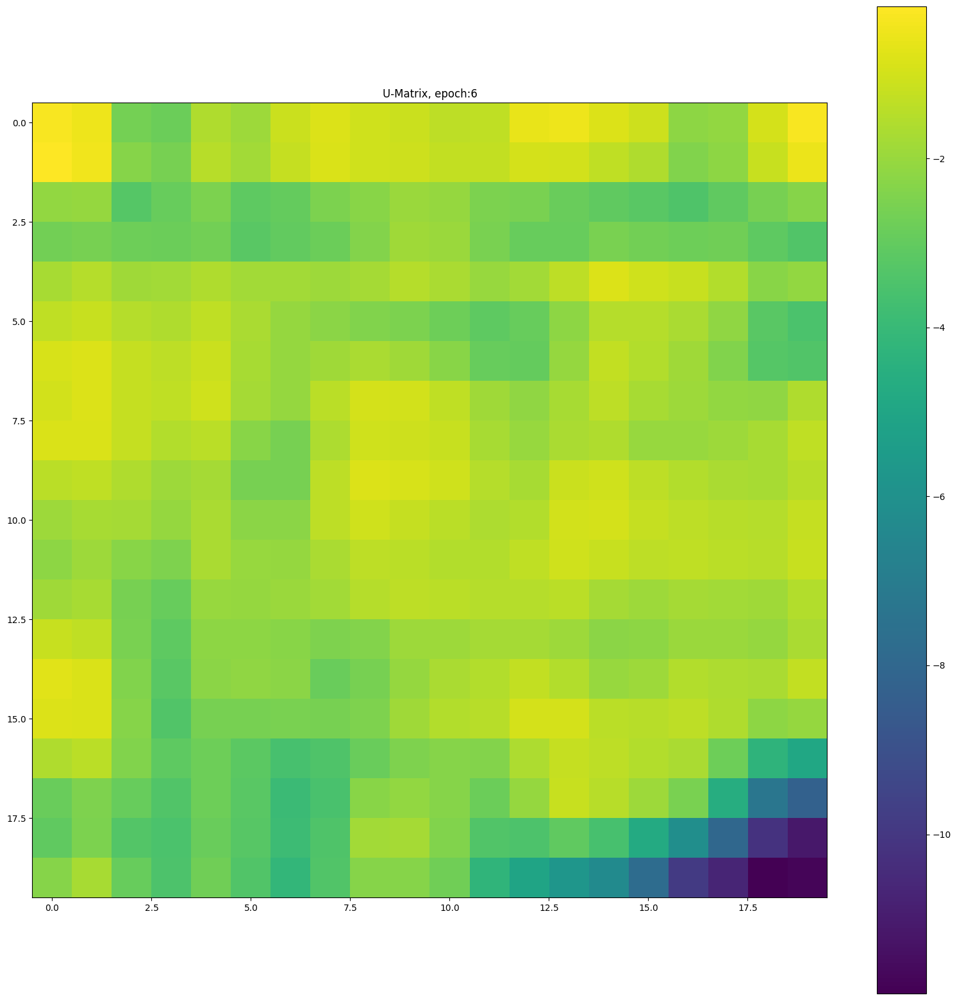

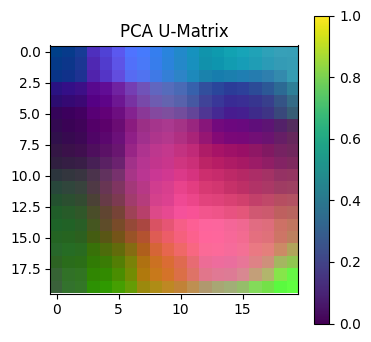

Epoch: 7, QE: 0.1453, TE: 0.3473


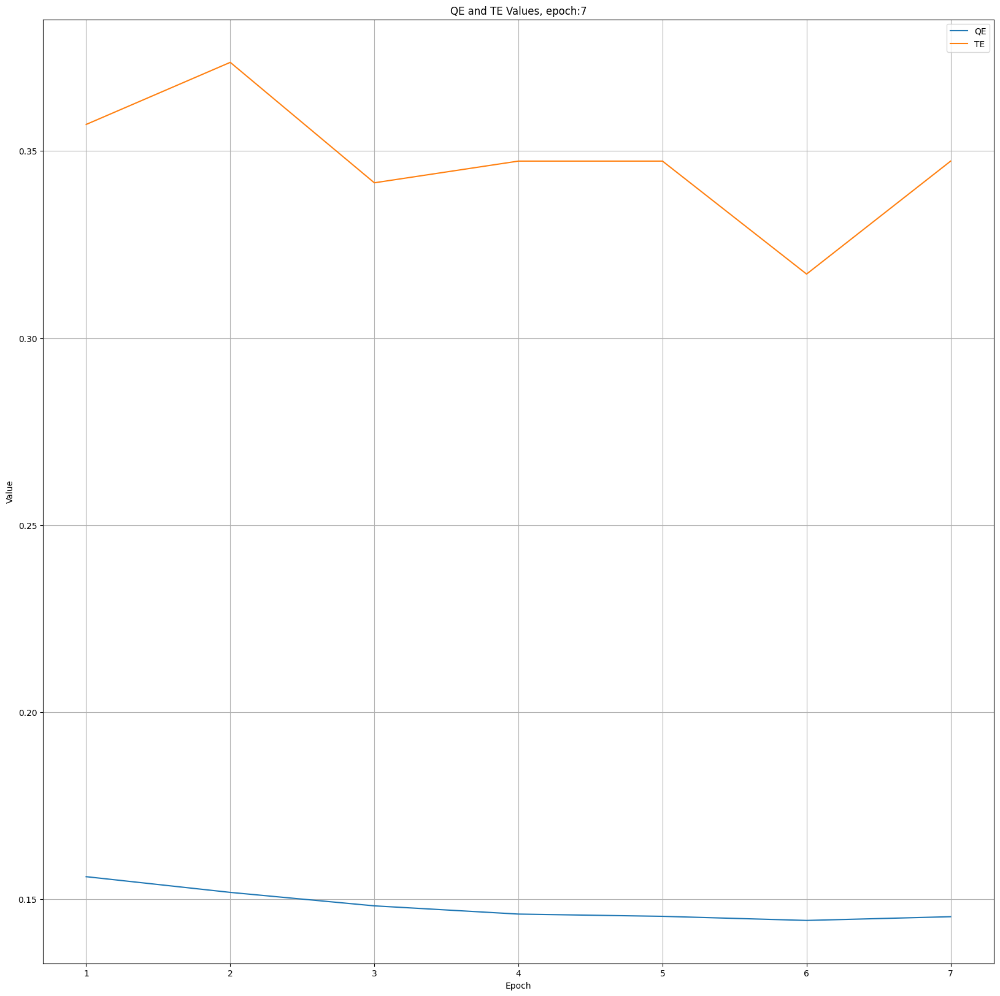

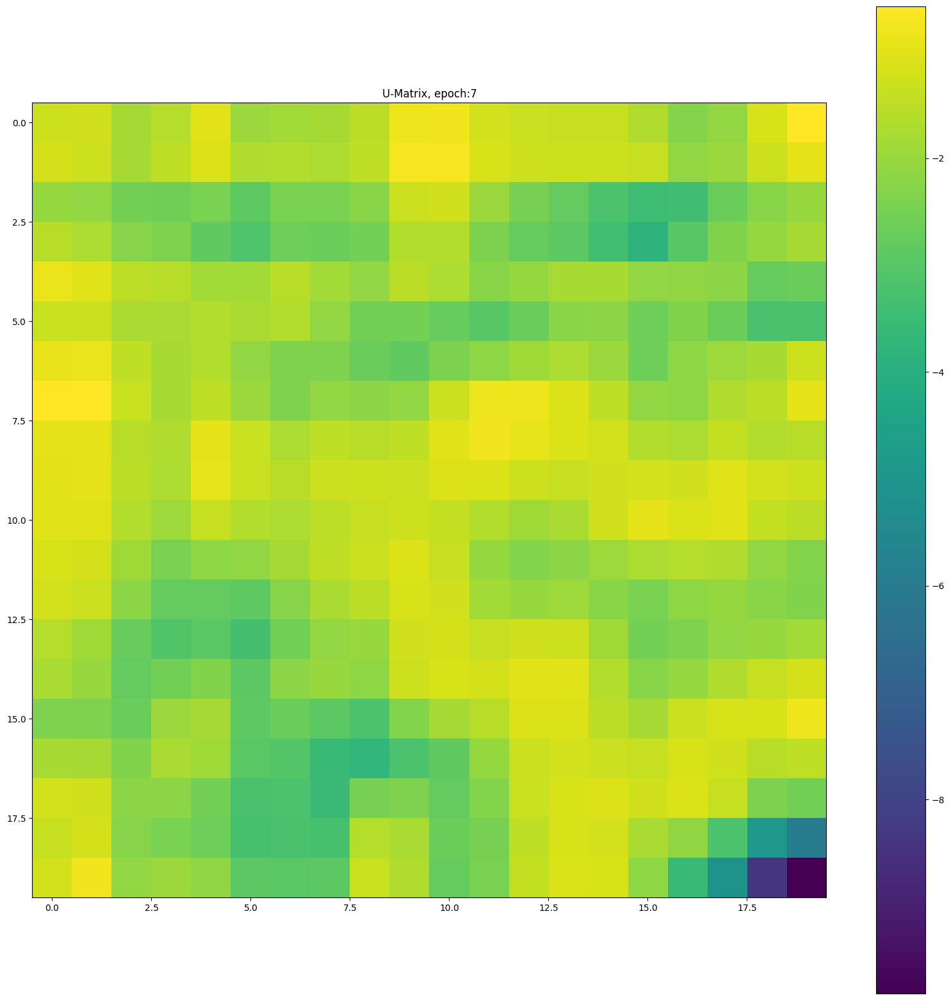

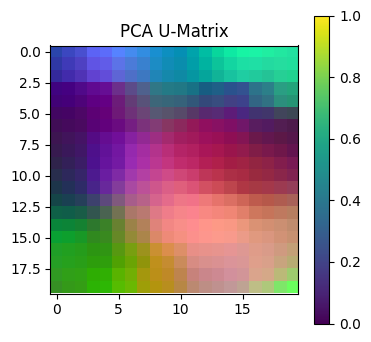

Epoch: 8, QE: 0.144, TE: 0.3717


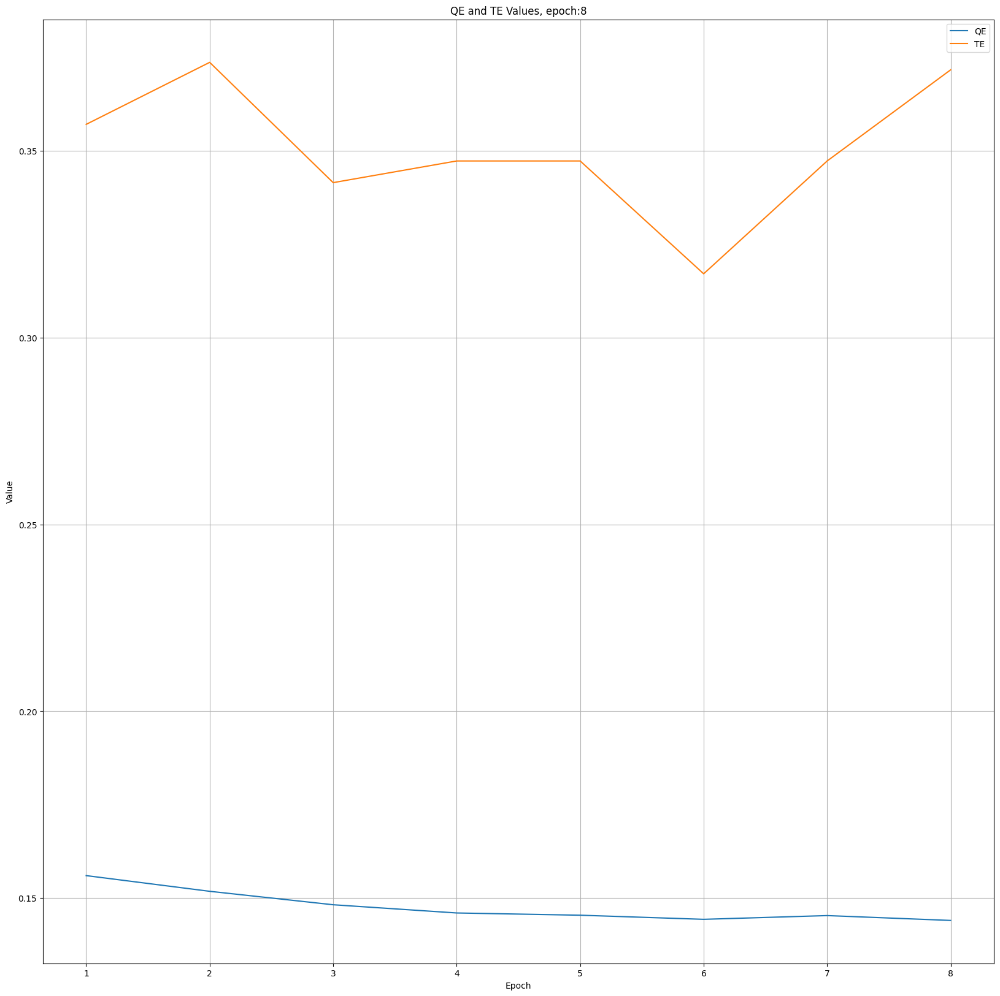

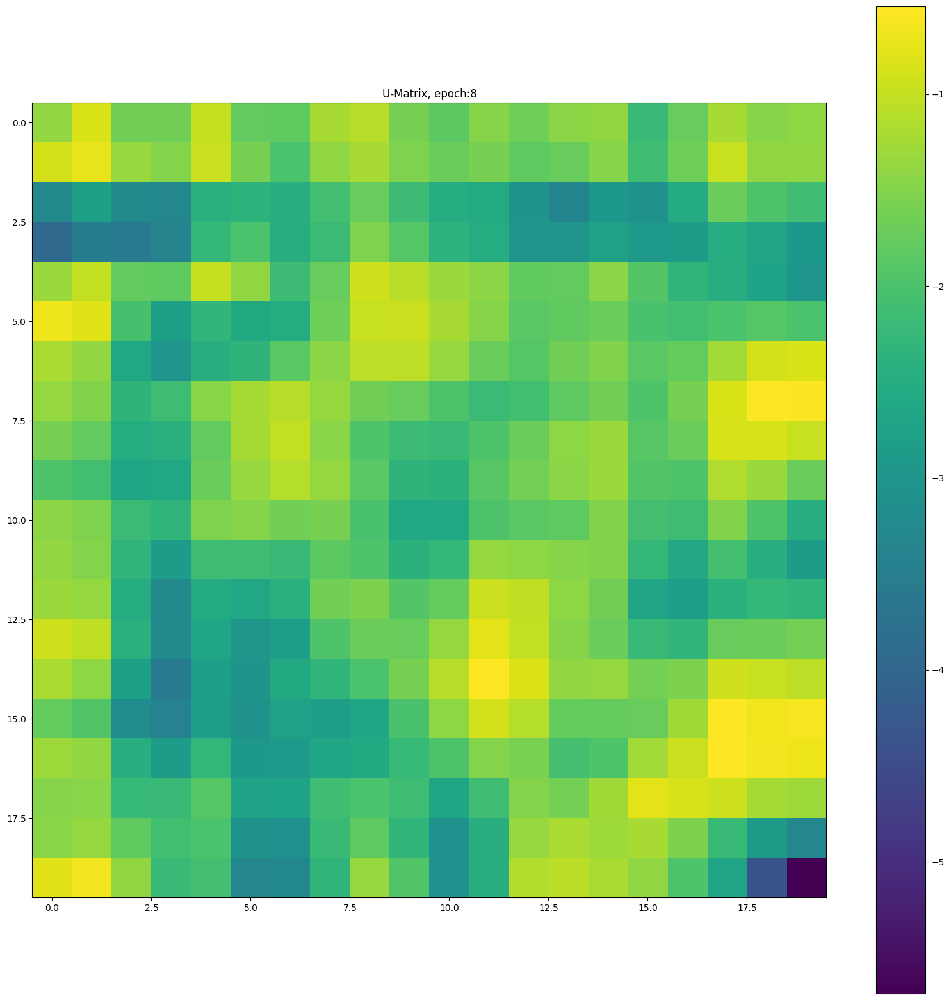

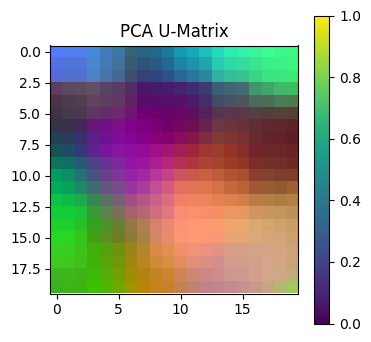

Epoch: 9, QE: 0.1439, TE: 0.3288


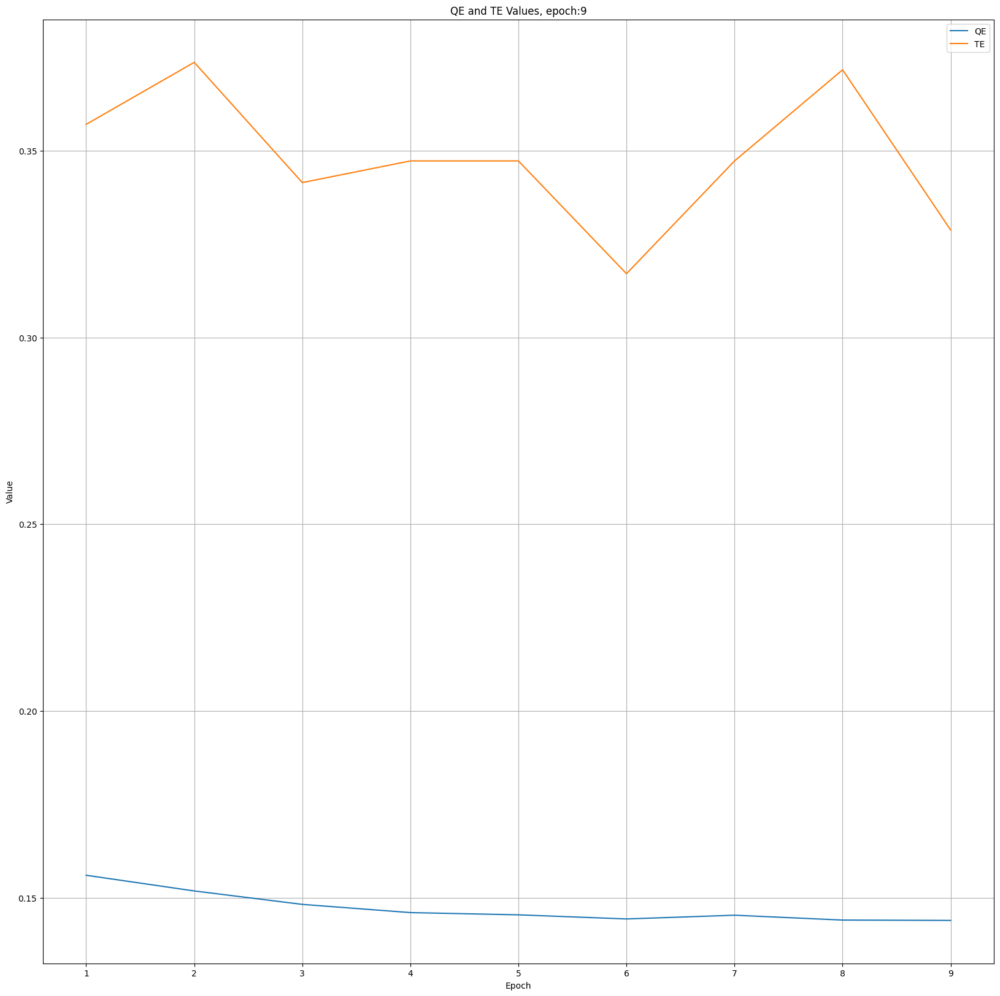

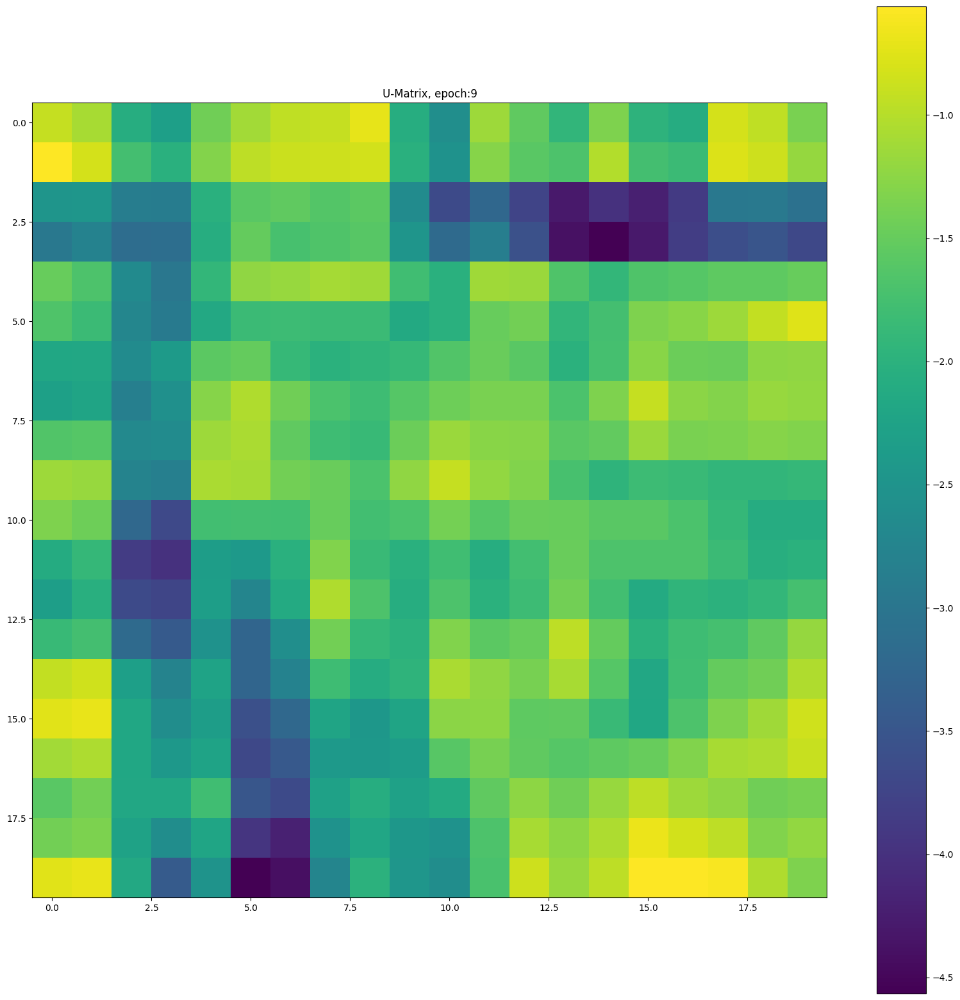

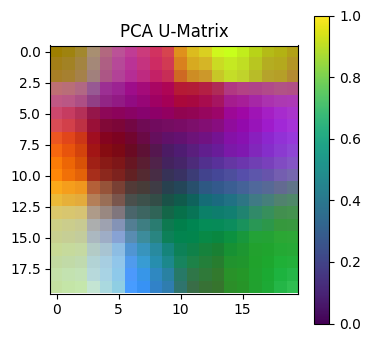

Epoch: 10, QE: 0.146, TE: 0.3327


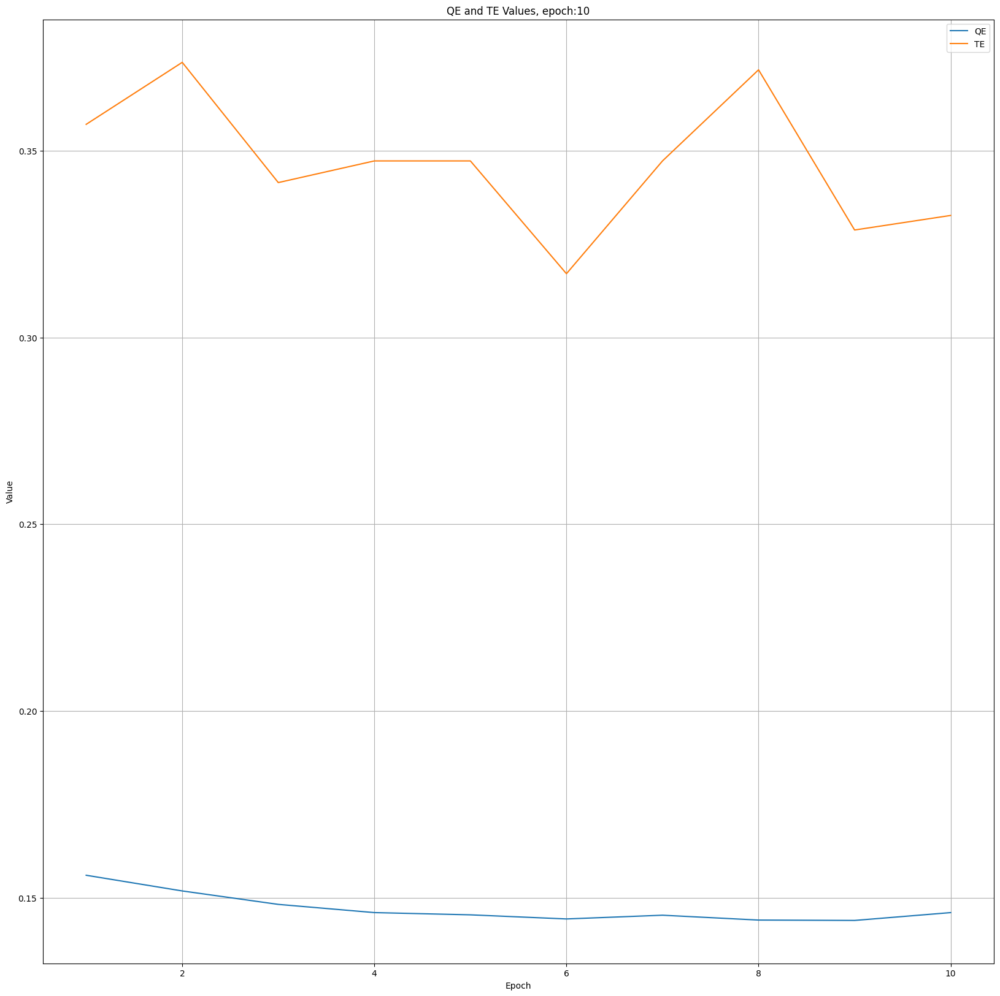

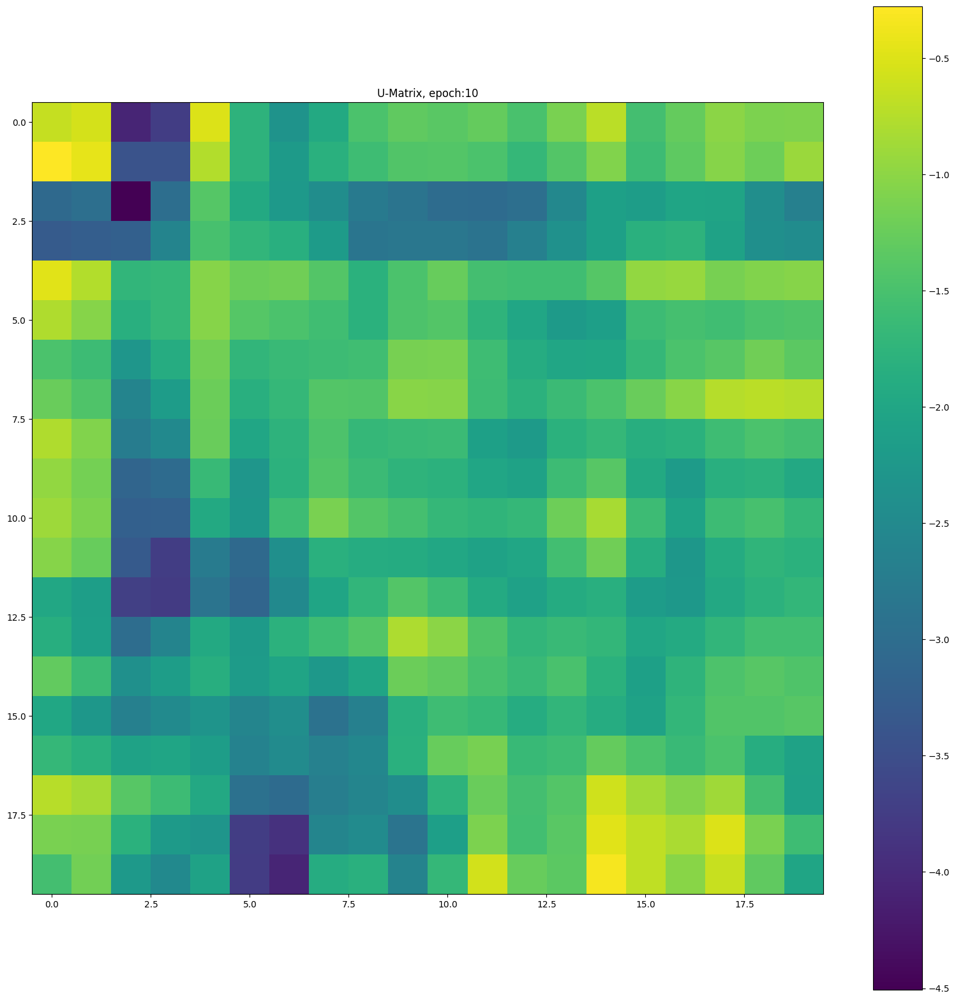

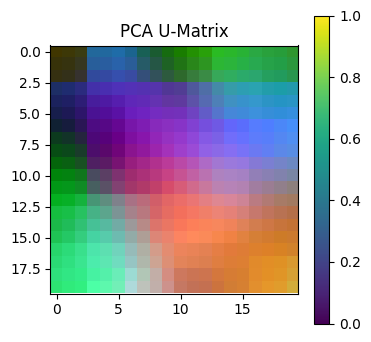

Epoch: 11, QE: 0.1449, TE: 0.322


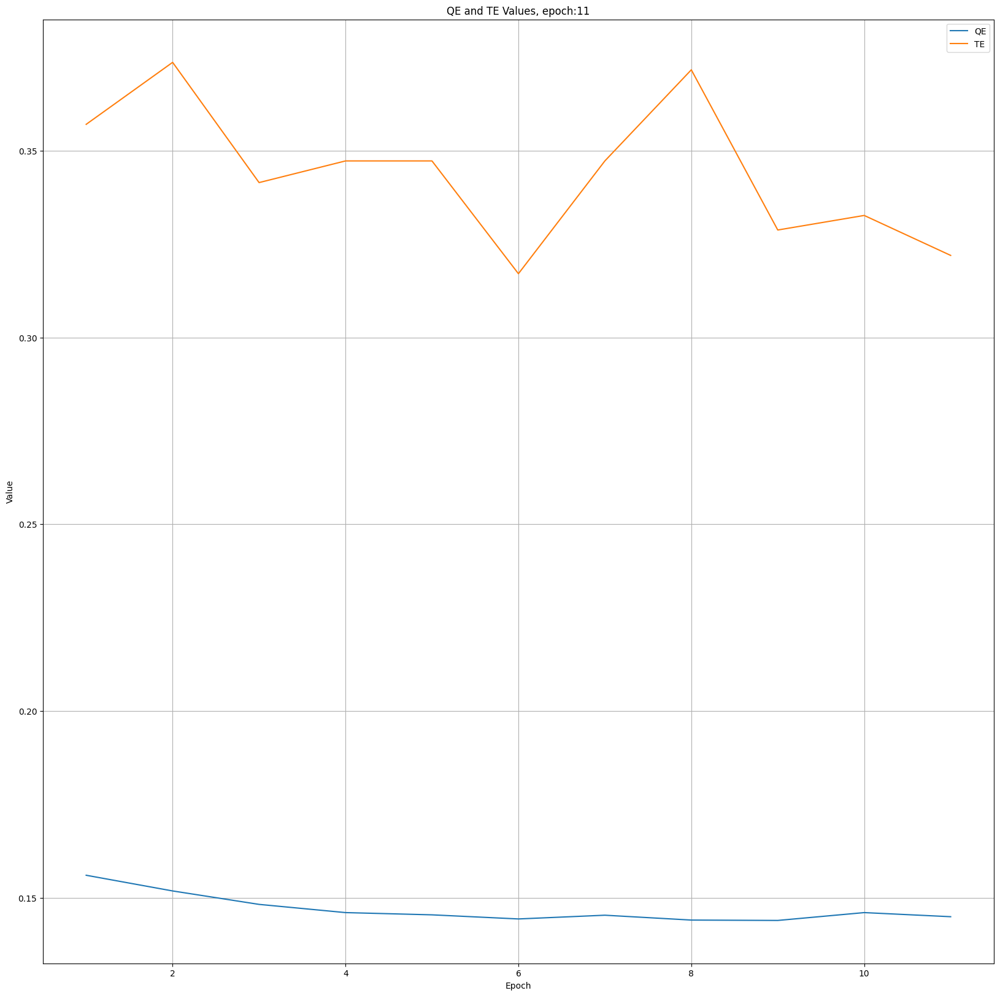

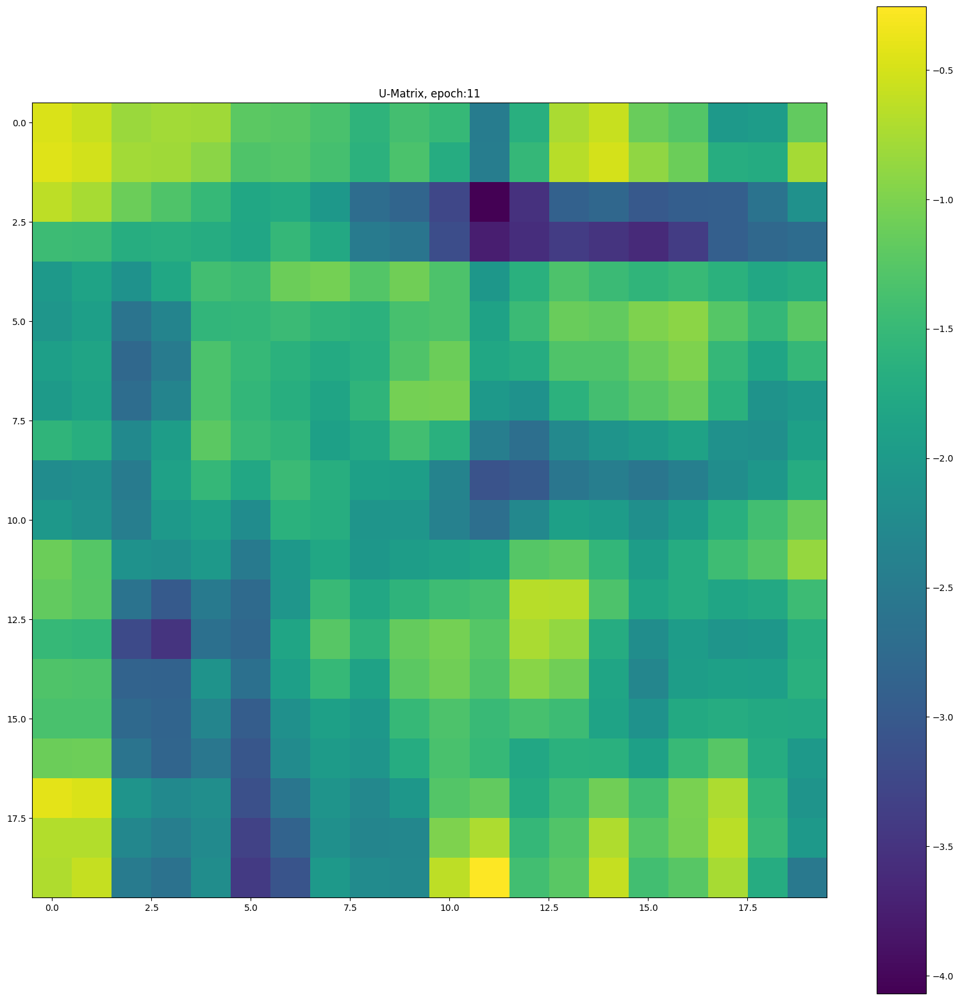

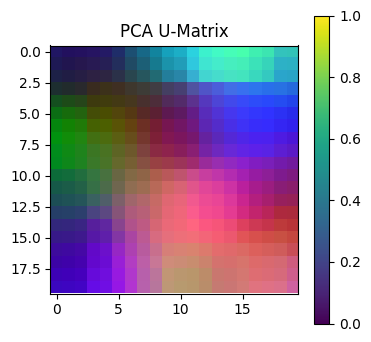

Epoch: 12, QE: 0.1441, TE: 0.3454


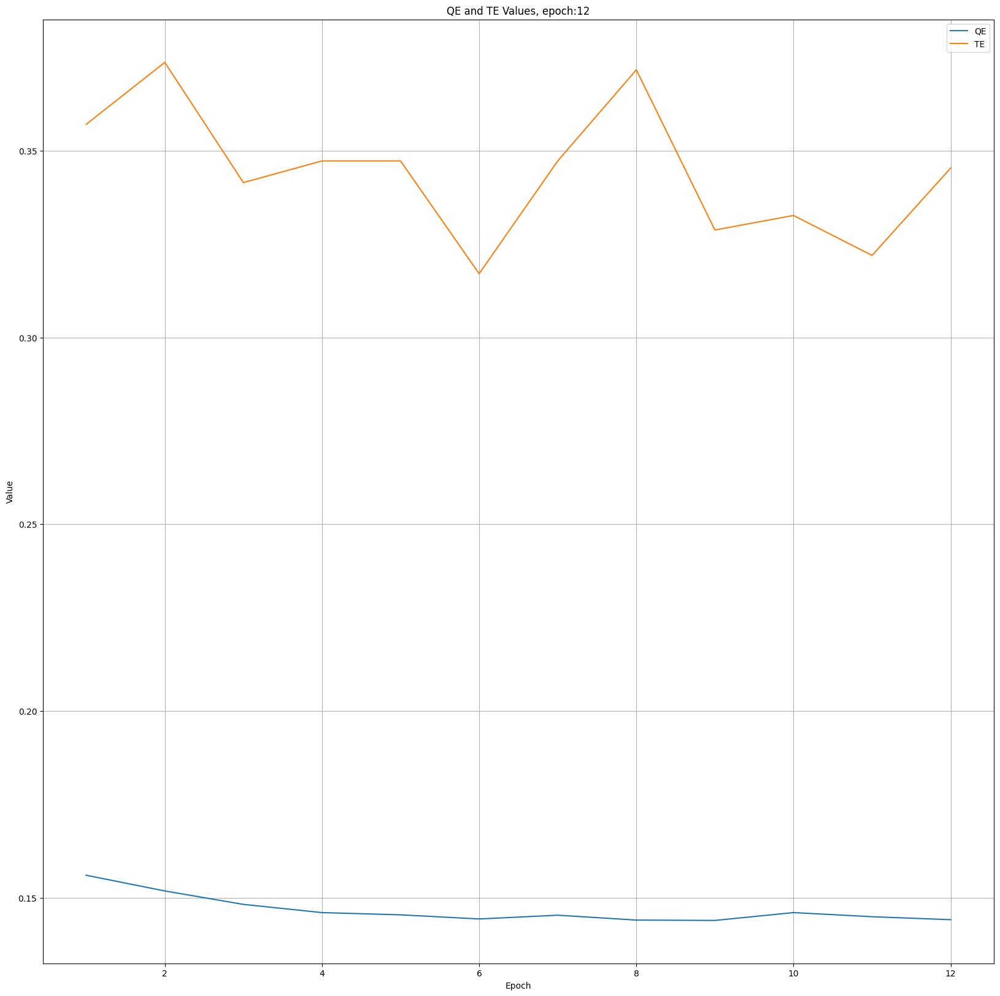

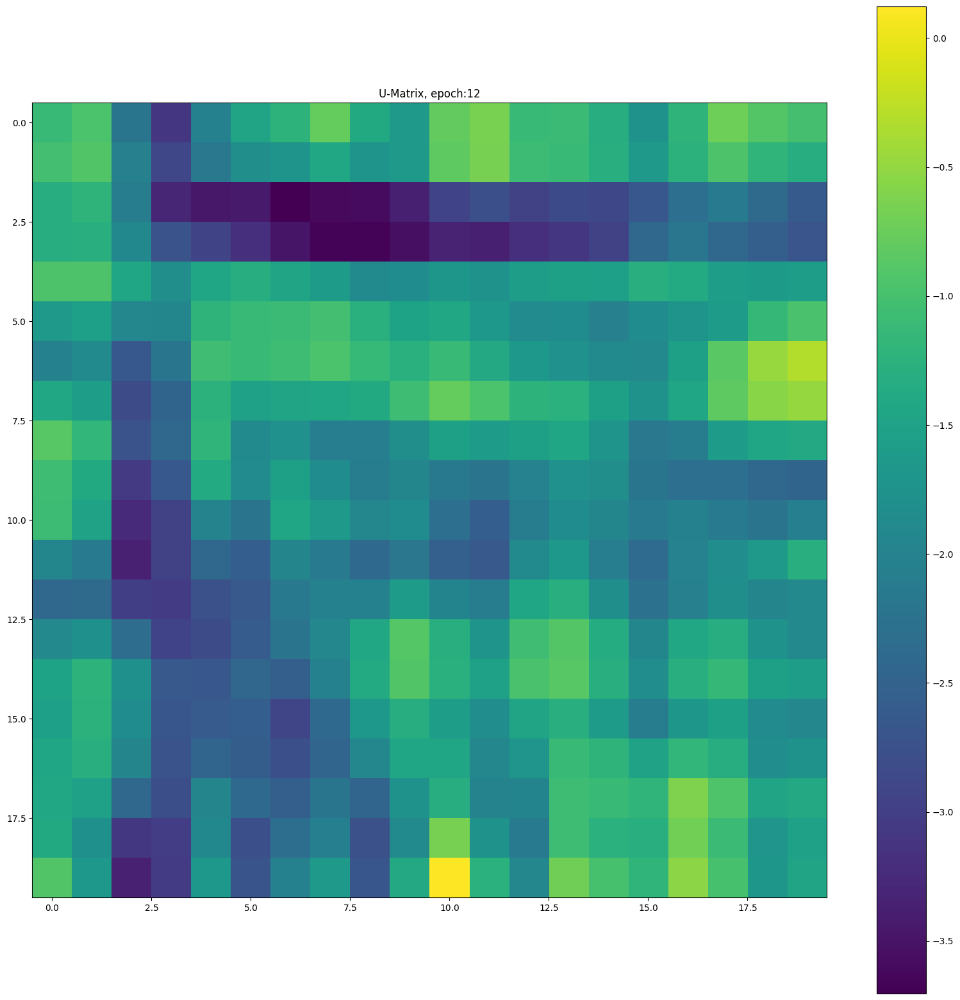

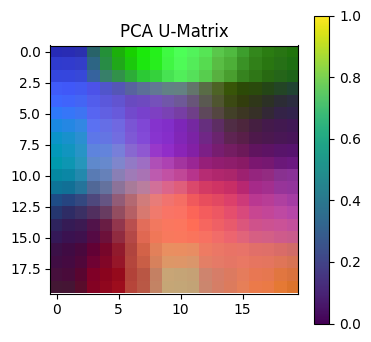

Epoch: 13, QE: 0.1448, TE: 0.3063


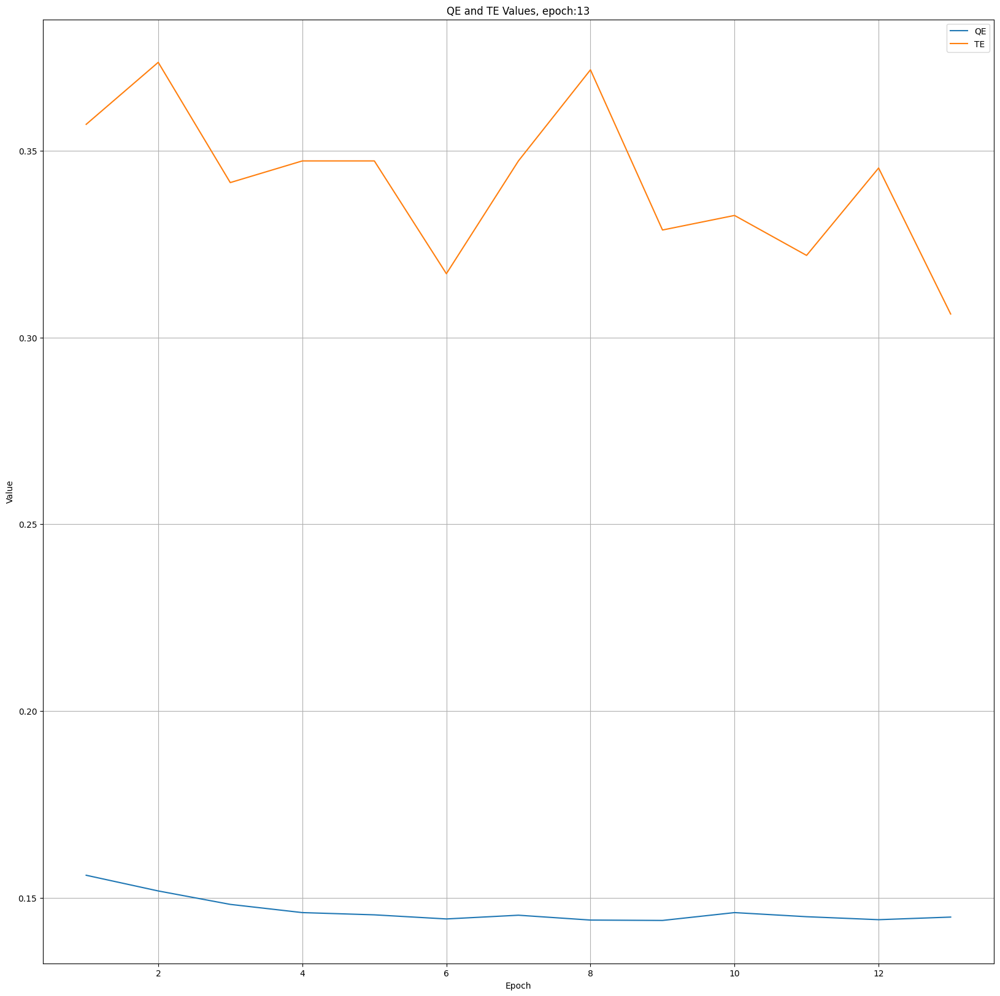

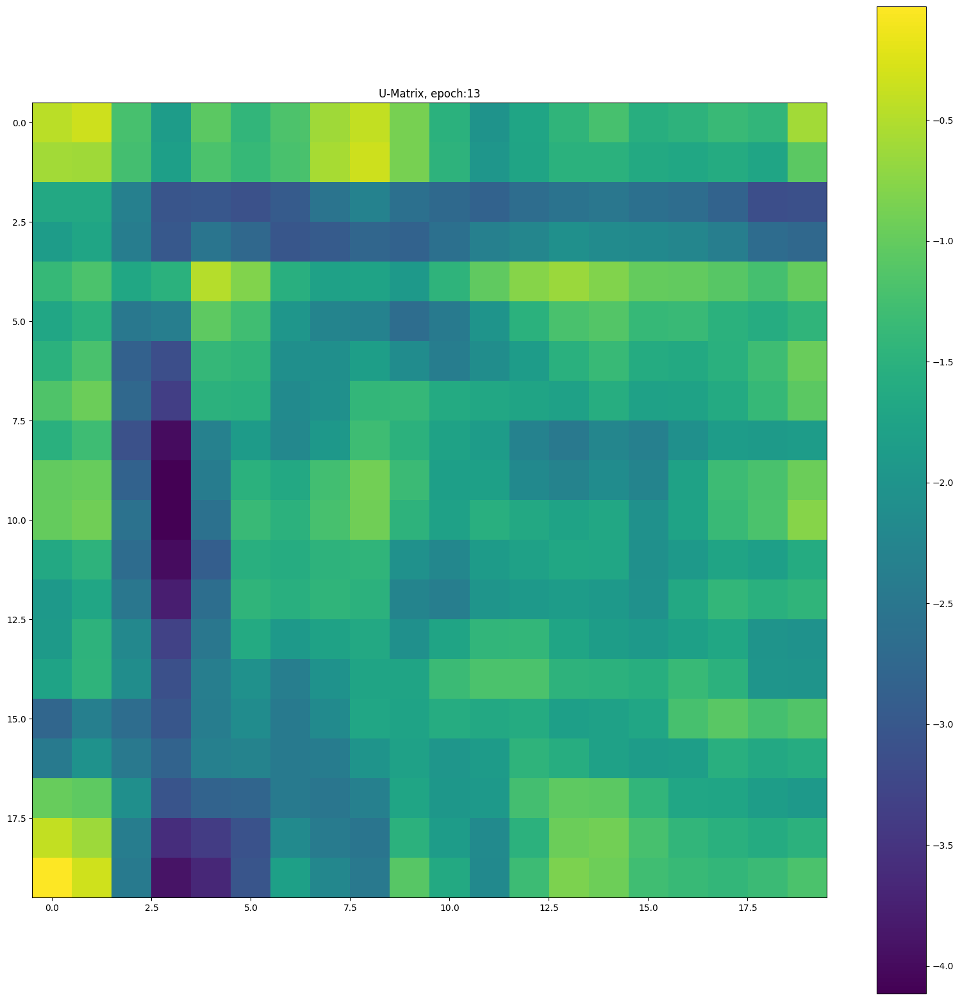

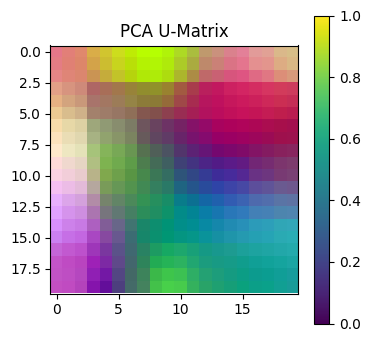

Epoch: 14, QE: 0.1432, TE: 0.3356


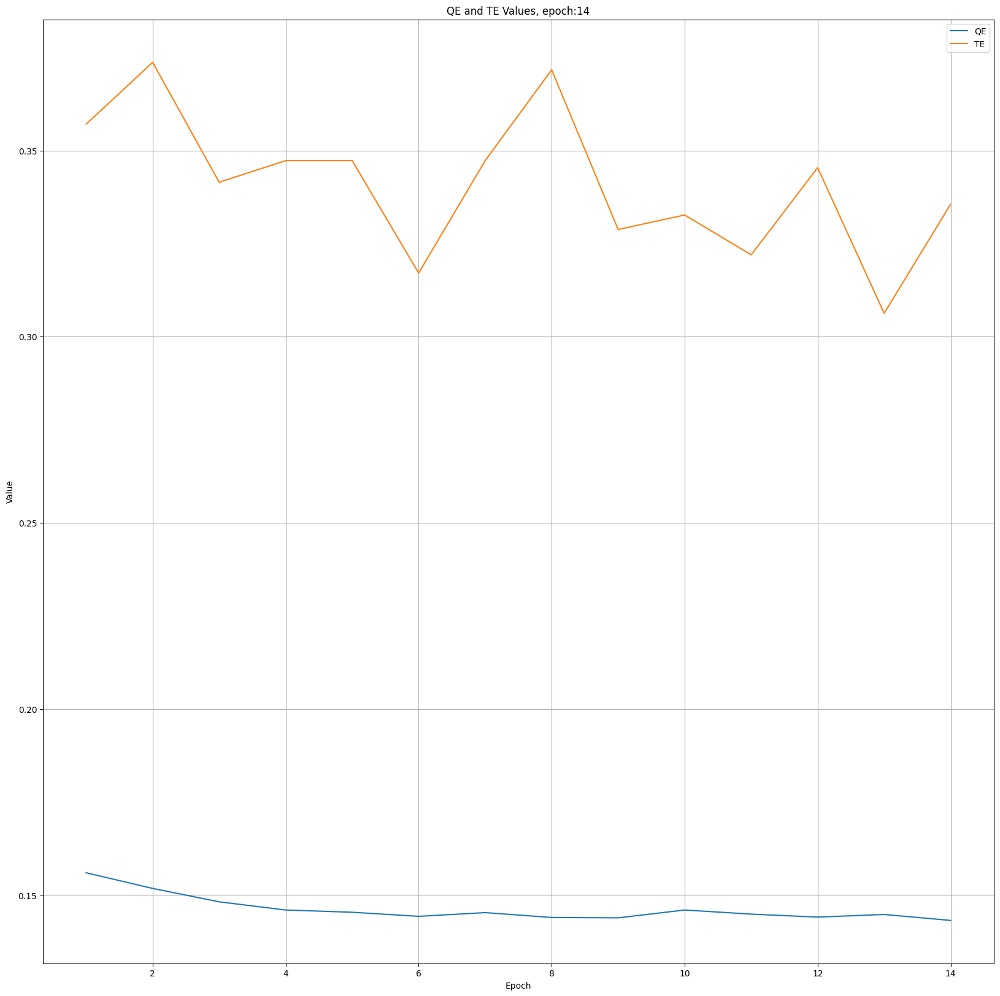

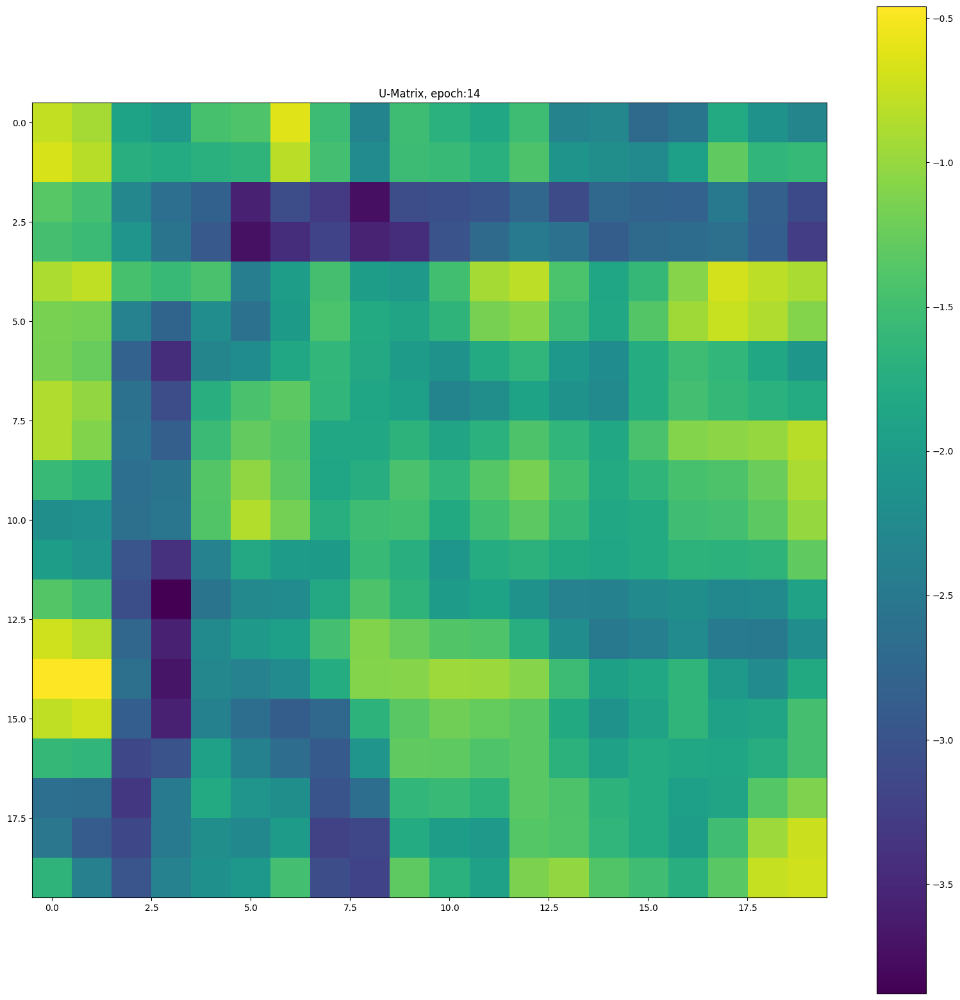

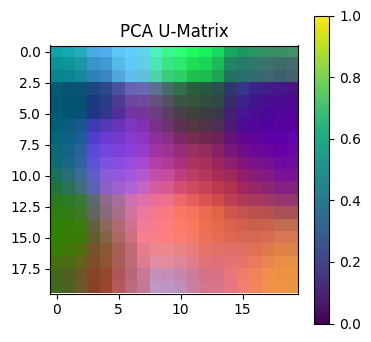

Epoch: 15, QE: 0.1457, TE: 0.3132


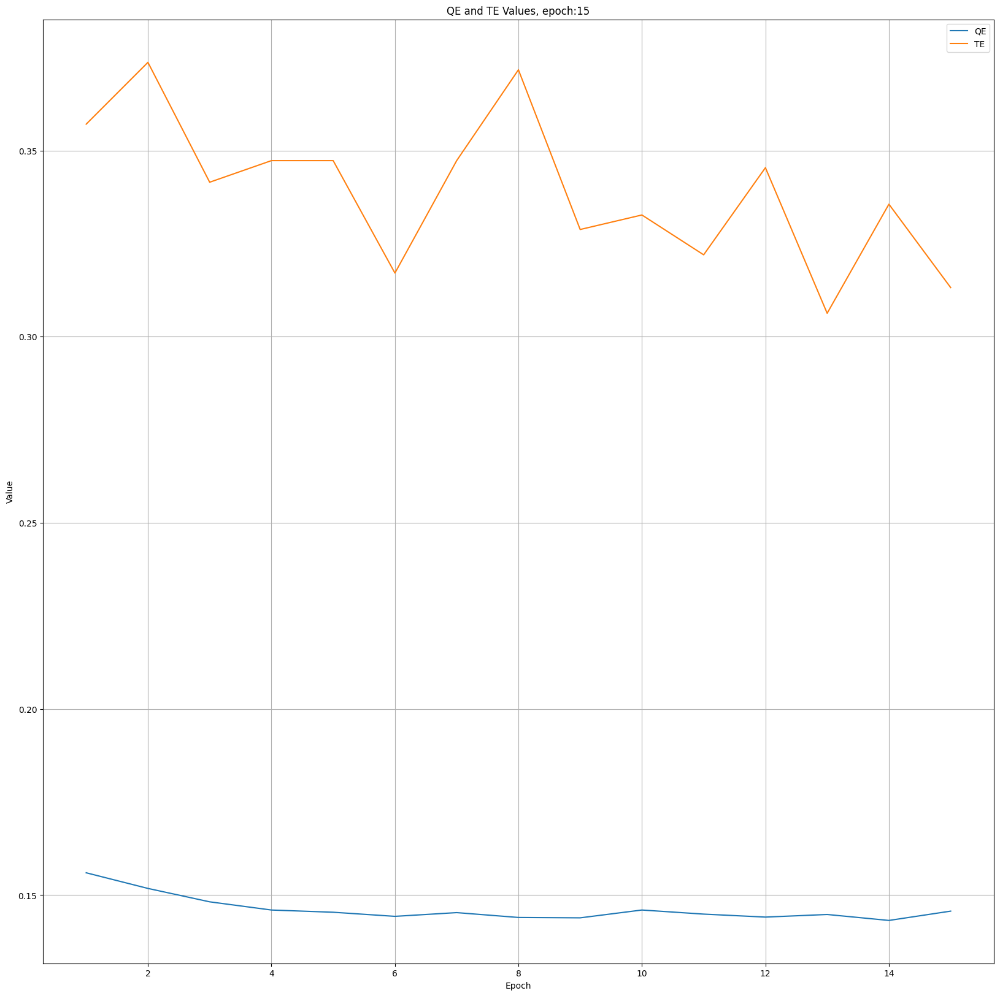

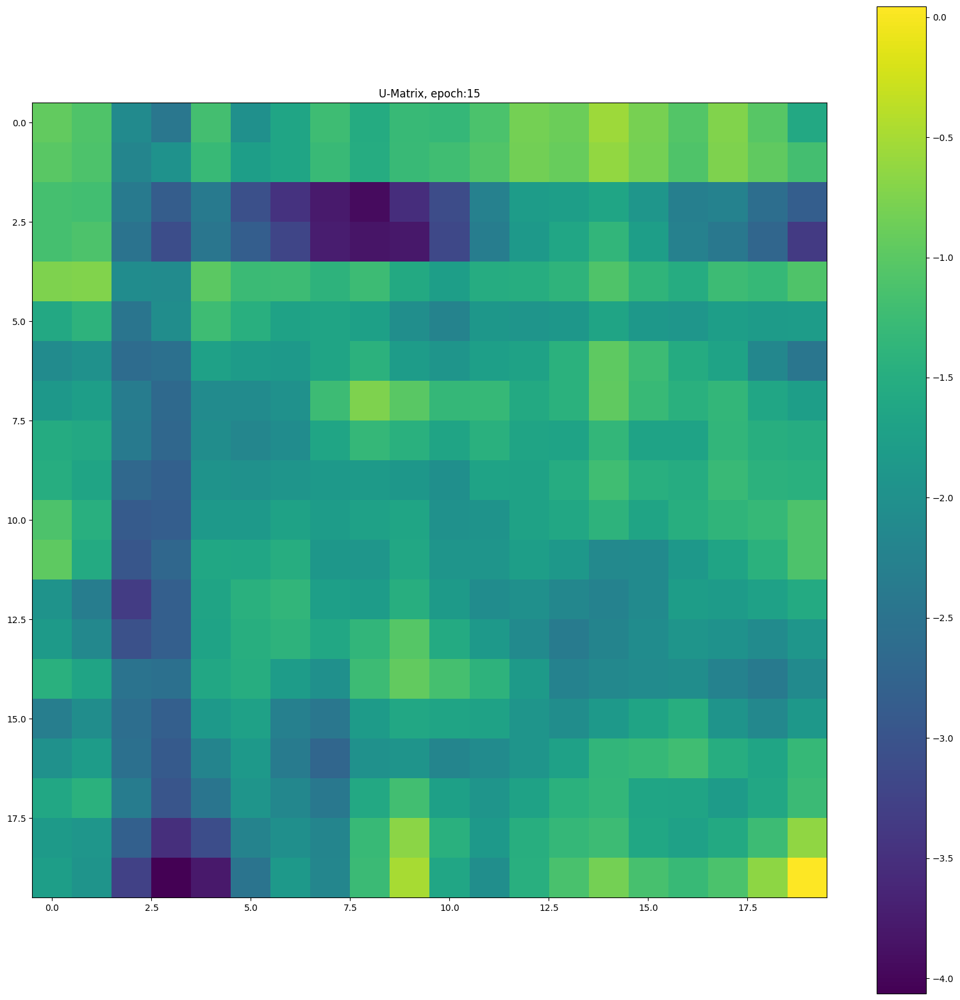

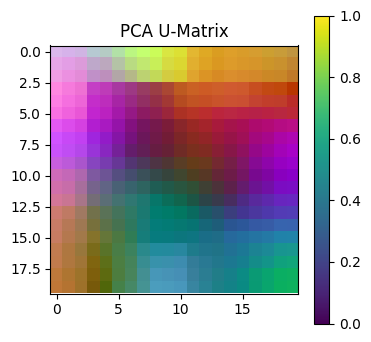

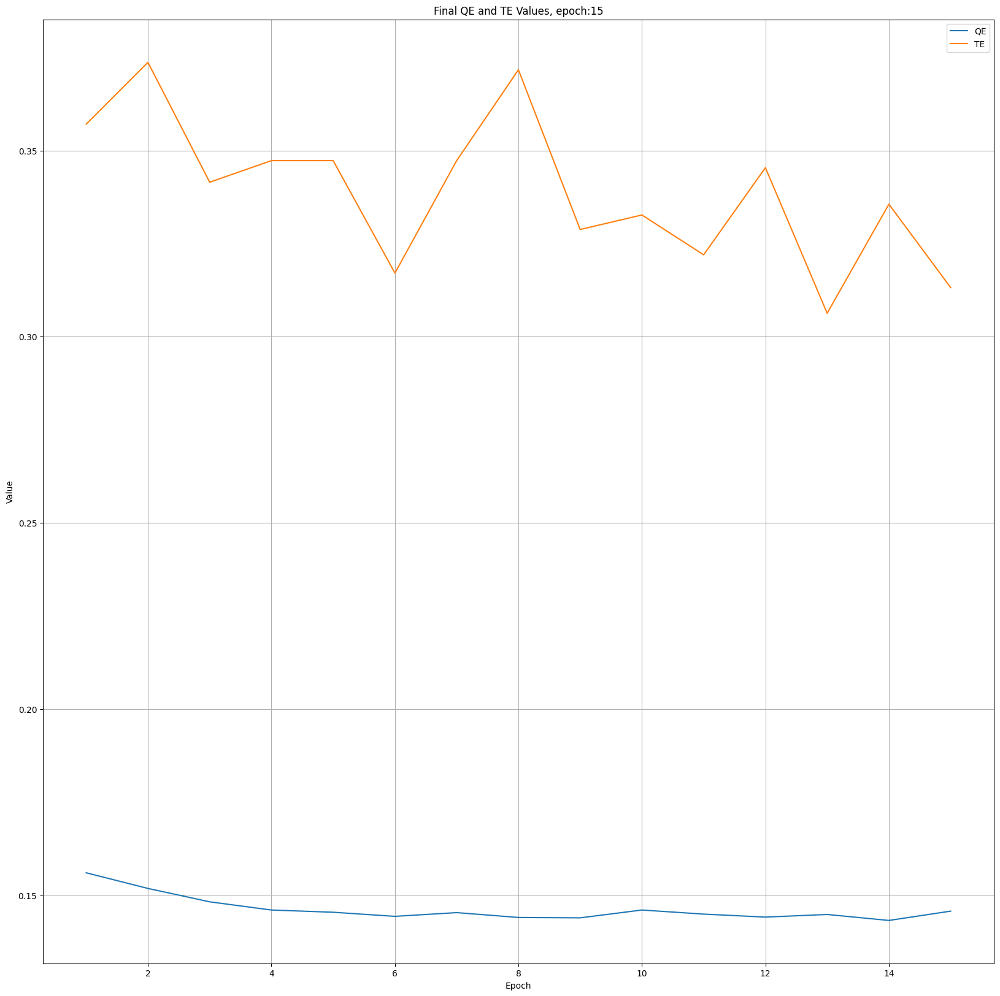

In [313]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Create a U-matrix with PCA components as RGB values
    u_matrix_pca = som_pca_norm.reshape(SOM.shape[:-1] + (3,))

    # Plot the U-matrix with PCA colors
    plt.figure(figsize=(4, 4))
    plt.imshow(u_matrix_pca)
    plt.title('PCA U-Matrix')
    plt.colorbar()
    plt.show()

# Initialize SOM grid dimensions
m = 20
n = 20

# Initialize training data
train_data = madridfeatures

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([15], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(20, 20))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(20, 20))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix, epoch:'+str(epoch))
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(20, 20))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Final QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

In [314]:
SOM= SOMS[11]

In [315]:
QE = QE_values[11]
TE = TE_values[11]

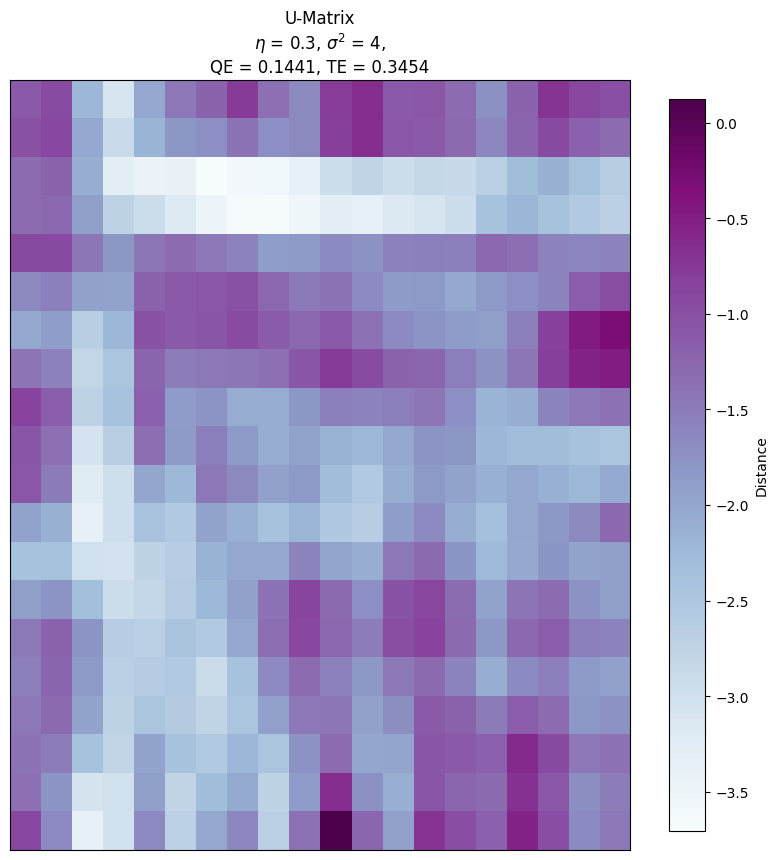

In [316]:
u_matrix_values = u_matrix(SOM)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [317]:
madrid_som_model = SOMS[11]

In [318]:
with open('madrid_som_model.pkl', 'wb') as f:
    pickle.dump(madrid_som_model, f)

In [319]:
with open('madrid_som_model.pkl', 'rb') as f:
    loaded_madrid_som_model = pickle.load(f)

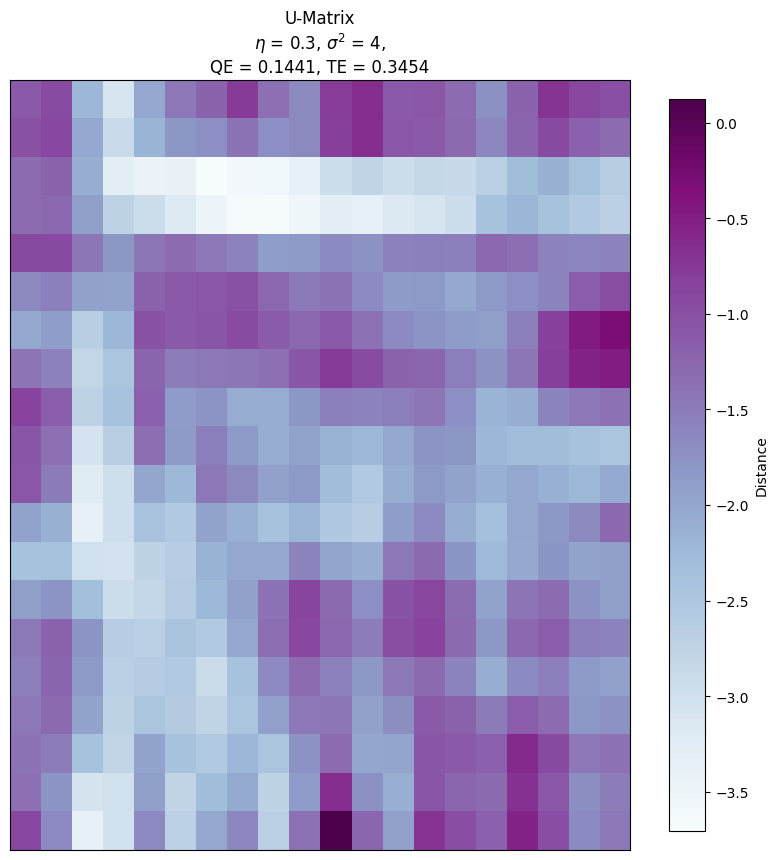

In [320]:
u_matrix_values = u_matrix(loaded_madrid_som_model)
QE = round(calculateQE(loaded_madrid_som_model, madridfeatures), 4)
TE = round(calculateTE(loaded_madrid_som_model, madridfeatures), 4)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [366]:
madrid_dict = []
for i in range(len(loaded_madrid_som_model)):
    row = []
    for j in range(len(loaded_madrid_som_model[0])):
        row.append([])
    madrid_dict.append(row)
for i in madridfeatureImagePairs:
    query=i['feature']
    g,h = find_BMU(loaded_madrid_som_model,query)
    madrid_dict [g][h].append(i)

In [367]:
with open('madrid_dict.pkl', 'wb') as f:
    pickle.dump(madrid_dict, f)

In [368]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [369]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [370]:
def get_closest_image(a,b):
  cell = loaded_madrid_som_model[a][b]
  distance = [distance_between(cell, i['feature']) for i in madrid_dict[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [371]:
def searchmadridpicturesom(query):
    result=[]
    query_features=[]
    path = query
    q_f = processImage(path, model3)
    query_features.append(q_f)
    activatedSOM = activate(madridfeatures, loaded_madrid_som_model, query_features)
    fig = plt.figure()
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    g,h=find_BMU(loaded_madrid_som_model,query_features)
    closest_image_index=get_closest_image(g,h)
    result.append(madrid_dict[g][h][closest_image_index]['image'])
    return result

# Indiefilm Frames

In [164]:
model4 = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3),
  include_top=False,
  pooling='avg'
)

In [165]:
indiefilmFiles = os.listdir('D:\\FinalAssignment\\MoviesKeyframes')

In [166]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [167]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file,
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

In [168]:
indiefilmfeatures = []
for m in indiefilmFiles:
    if m != '.DS_Store':
        path = os.path.join('D:\\FinalAssignment\\MoviesKeyframes', m)
        f = processImage(path, model4)
        indiefilmfeatures.append(f)

1/1 [==============================] - 0s 88ms/step


In [169]:
with open('indiefilmfeatures.pkl', 'wb') as f:
    pickle.dump(indiefilmfeatures, f)

In [170]:
with open('indiefilmfeatures.pkl', 'rb') as f:
    indiefilmfeatures = pickle.load(f)

In [171]:
indiefilmfeatureImagePairs = []
for i in range(len(indiefilmfeatures)):
    featureImage = {}
    featureImage['image'] = indiefilmFiles[i]
    featureImage['feature'] = indiefilmfeatures[i]
    indiefilmfeatureImagePairs.append(featureImage)

In [172]:
def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p
def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

In [173]:
def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):
    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values

In [174]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq,
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])
    return SOM

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1,
             lr_decay = .1, radius_decay = .1, epochs = 10):
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        np.random.shuffle(train_data)
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex,
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)
    return SOM
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'cosine')[0][0]
    QE = sumSqDist/len(data)
    return QE
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)
def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

Epoch: 1, QE: 0.2708, TE: 0.3036


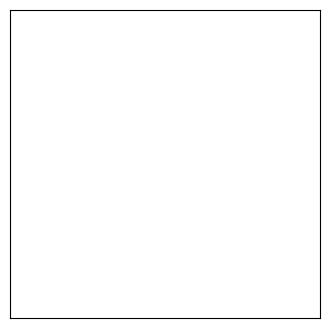

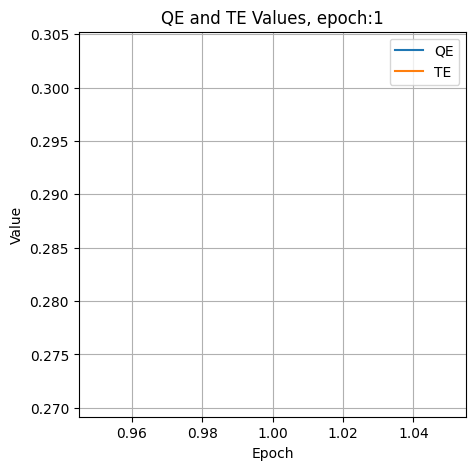

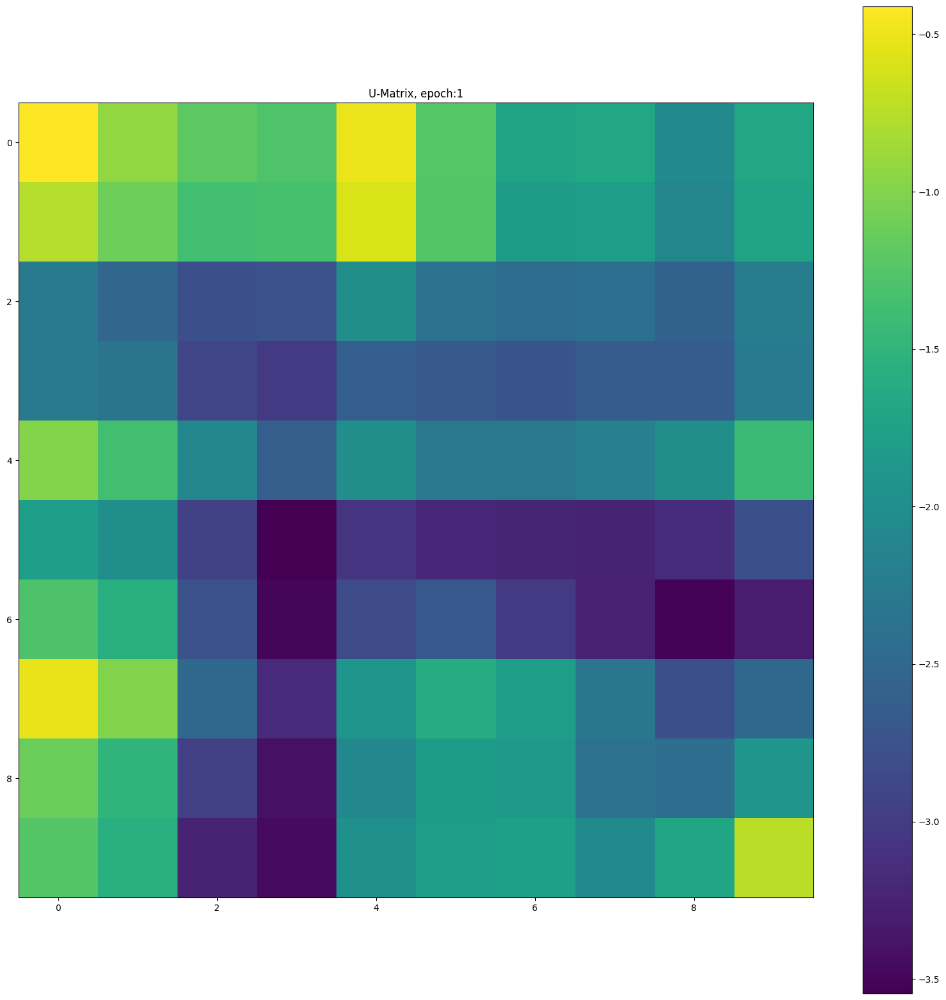

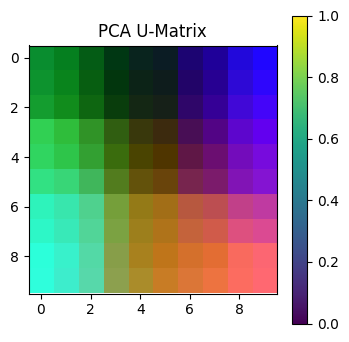

Epoch: 2, QE: 0.2697, TE: 0.3223


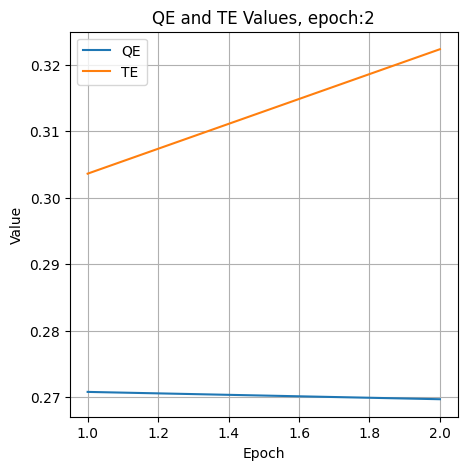

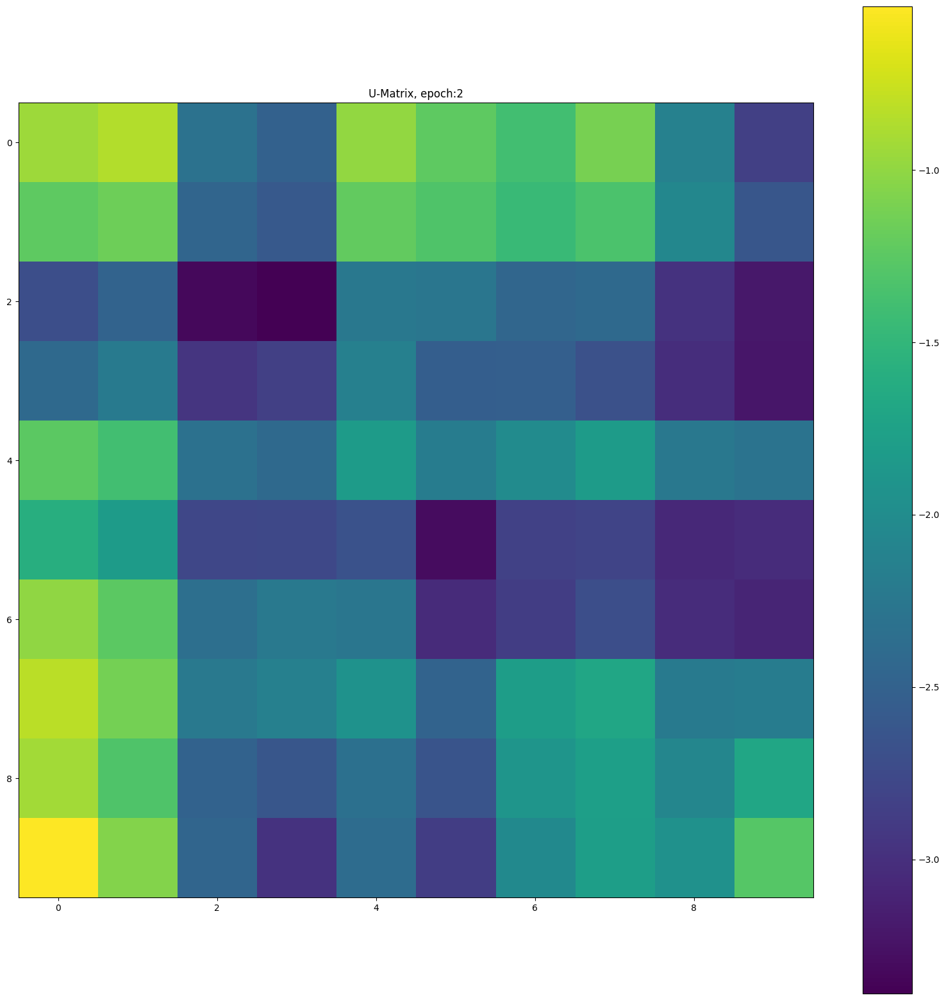

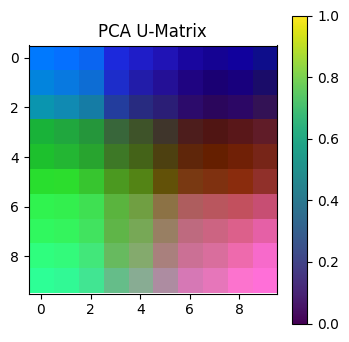

Epoch: 3, QE: 0.2685, TE: 0.3196


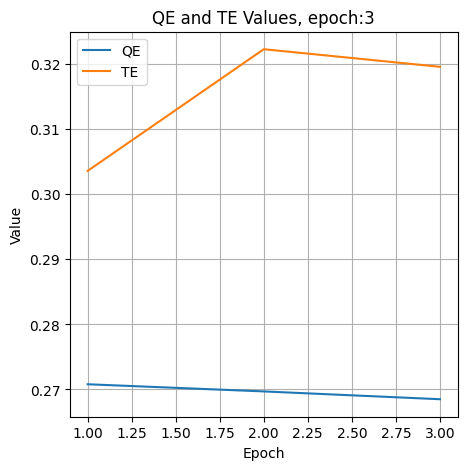

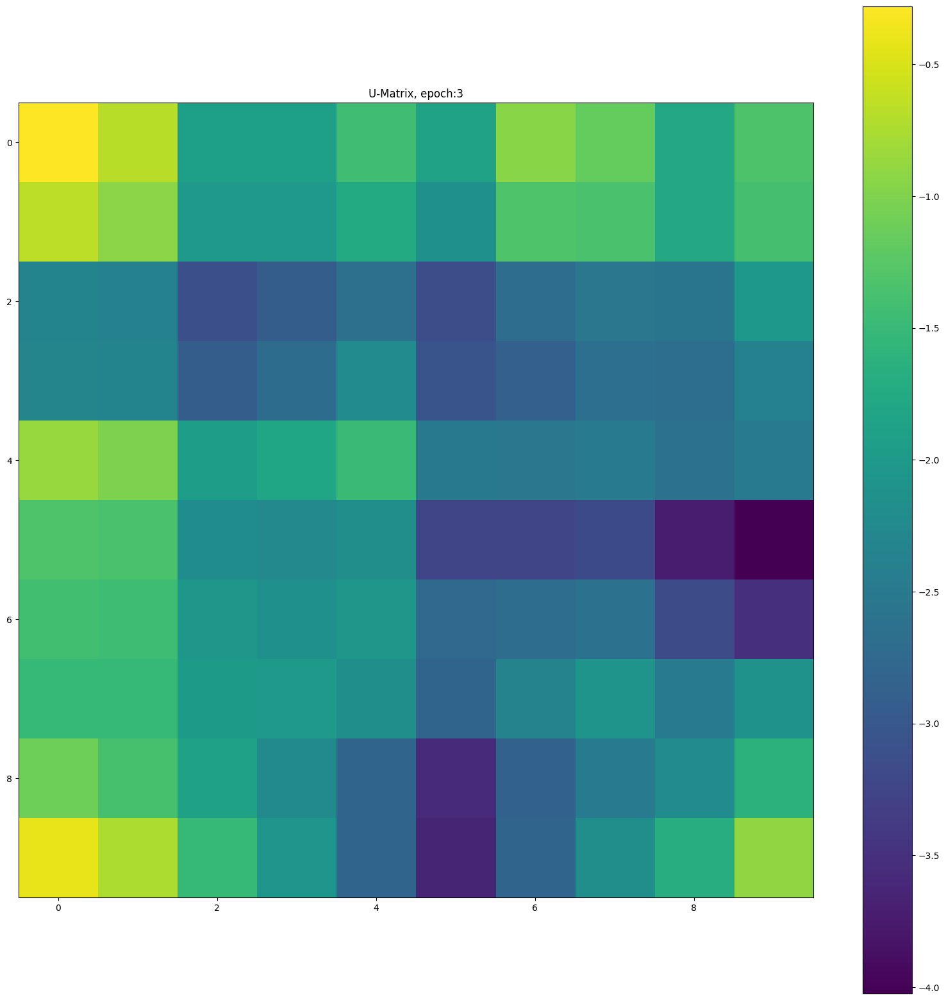

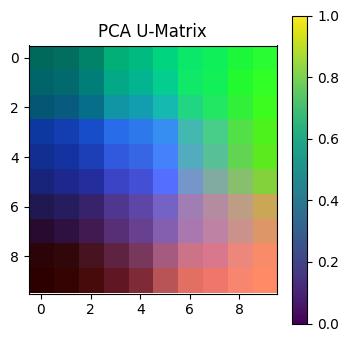

Epoch: 4, QE: 0.2718, TE: 0.2946


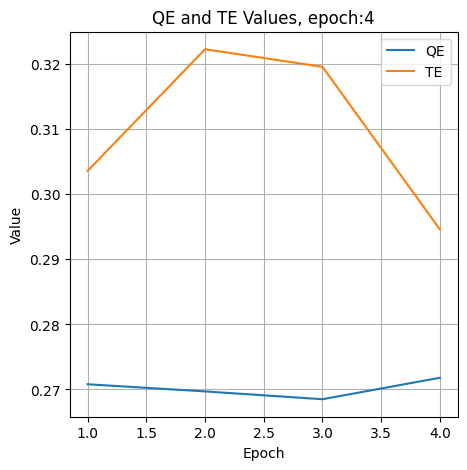

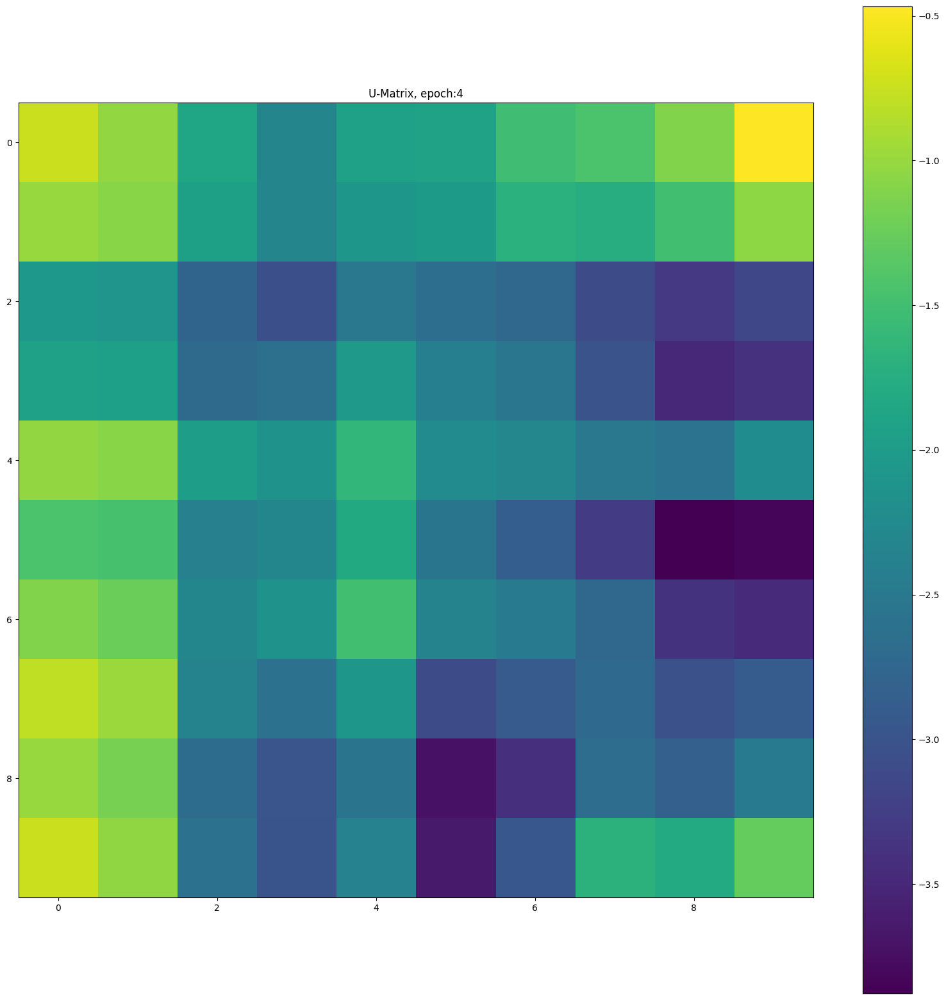

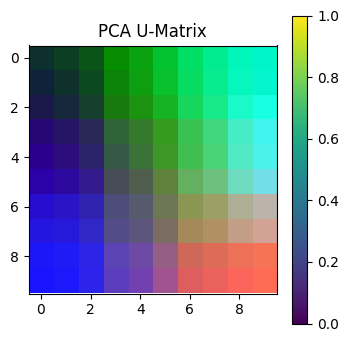

Epoch: 5, QE: 0.2723, TE: 0.3366


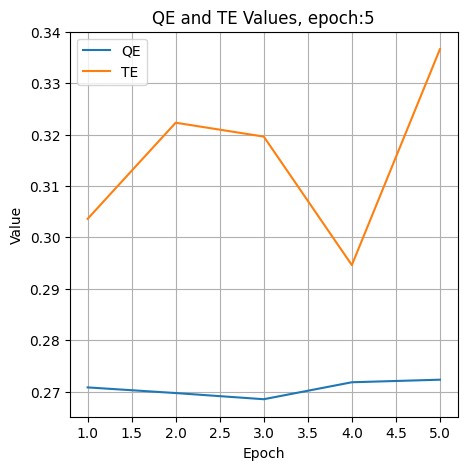

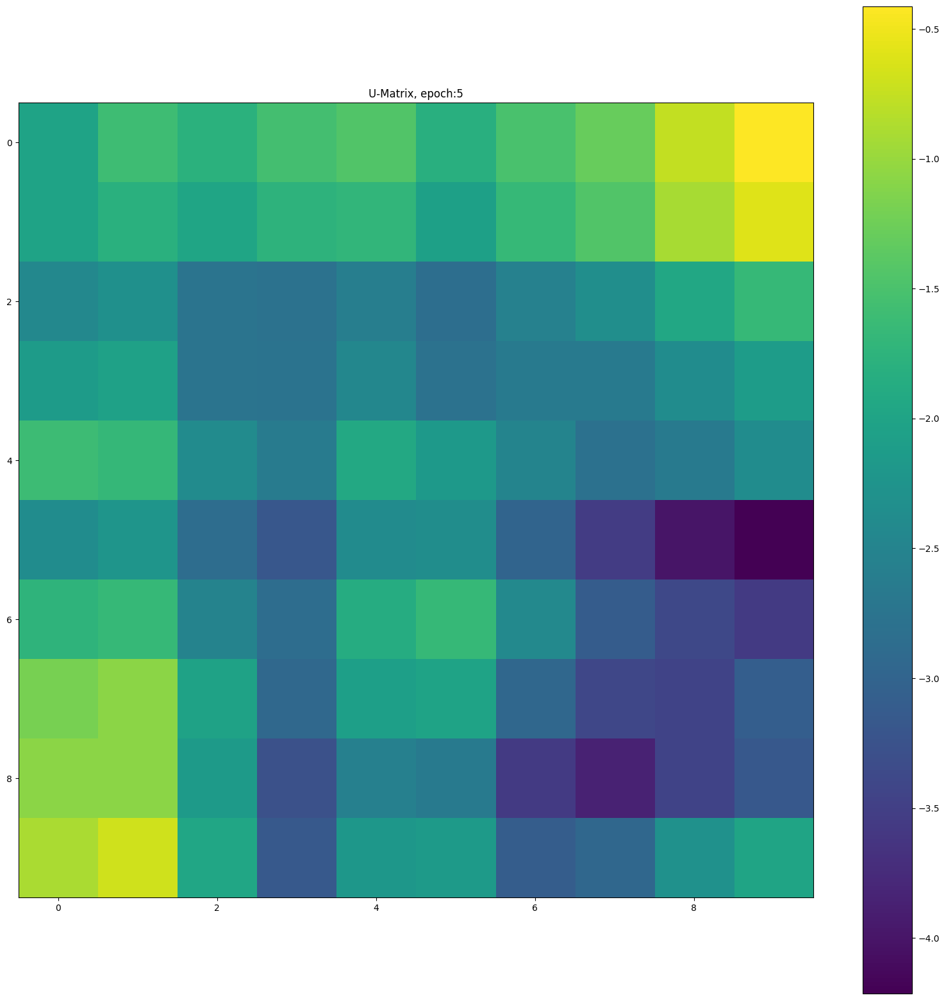

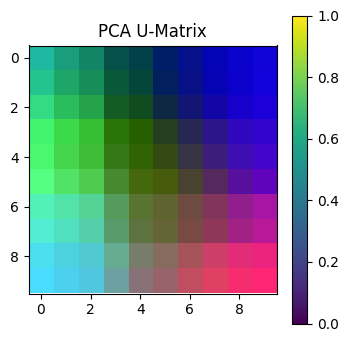

Epoch: 6, QE: 0.2717, TE: 0.392


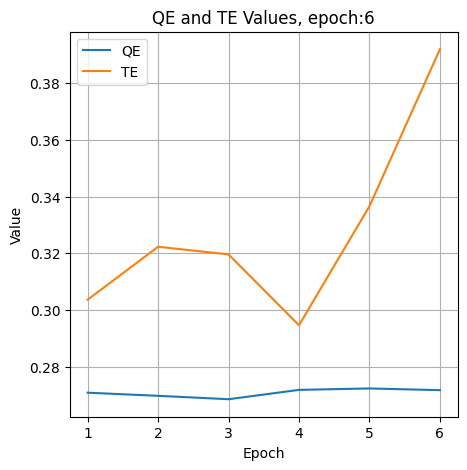

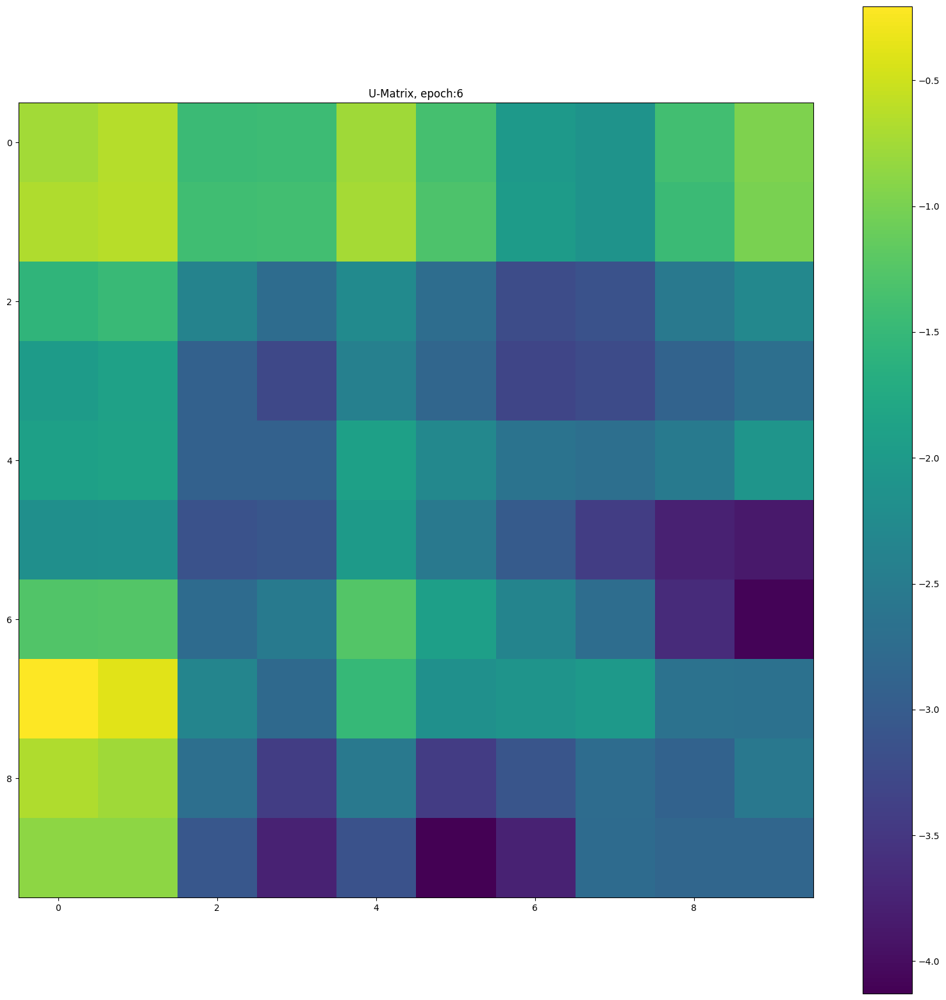

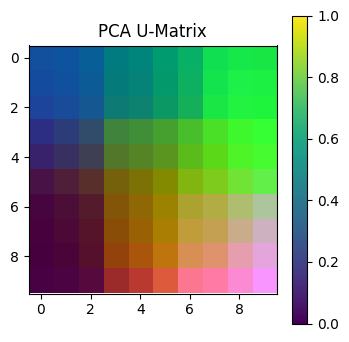

Epoch: 7, QE: 0.2699, TE: 0.3384


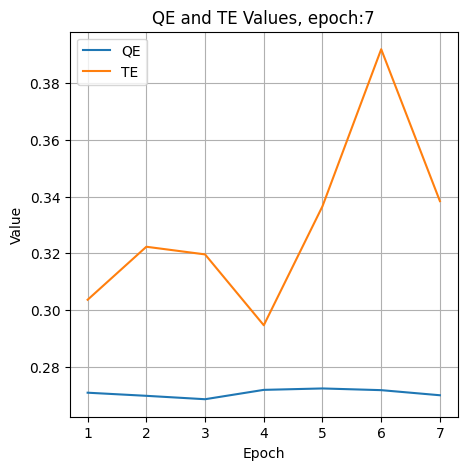

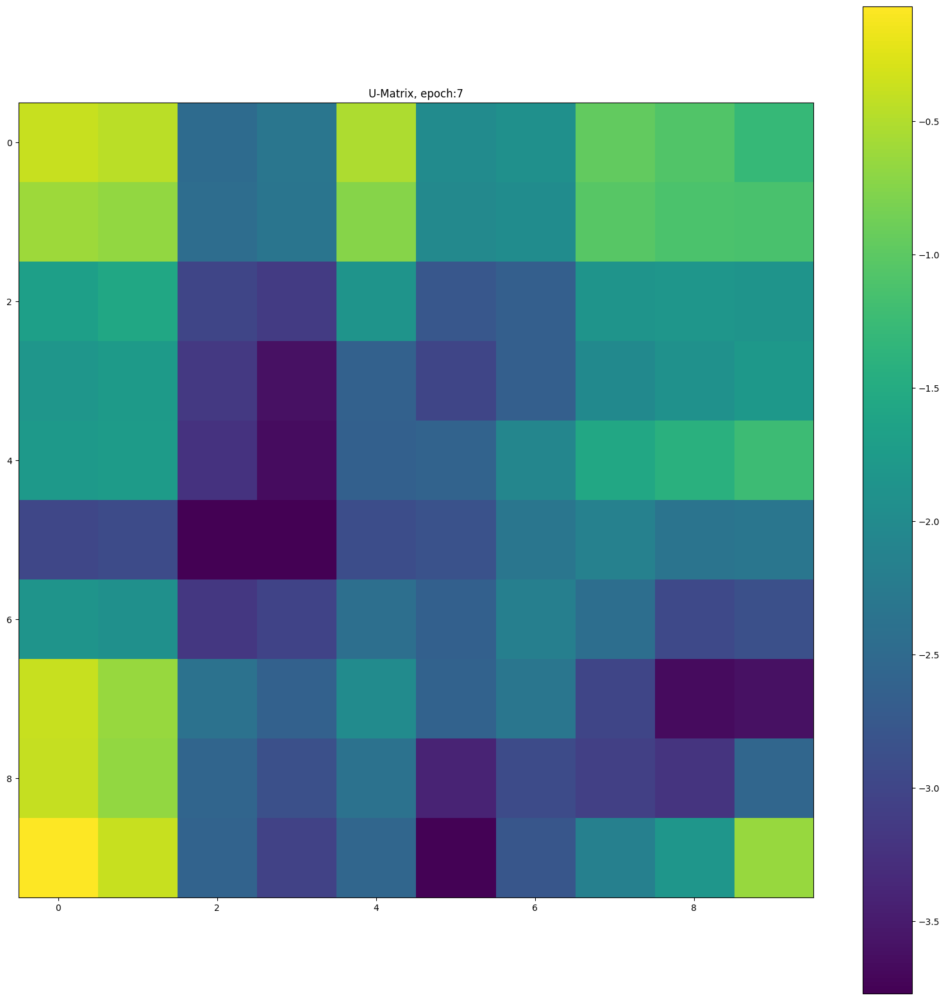

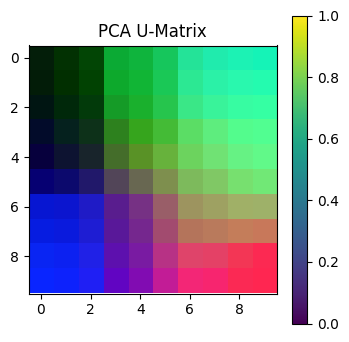

Epoch: 8, QE: 0.2699, TE: 0.3857


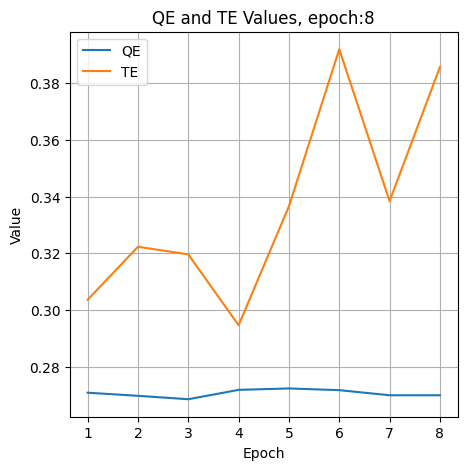

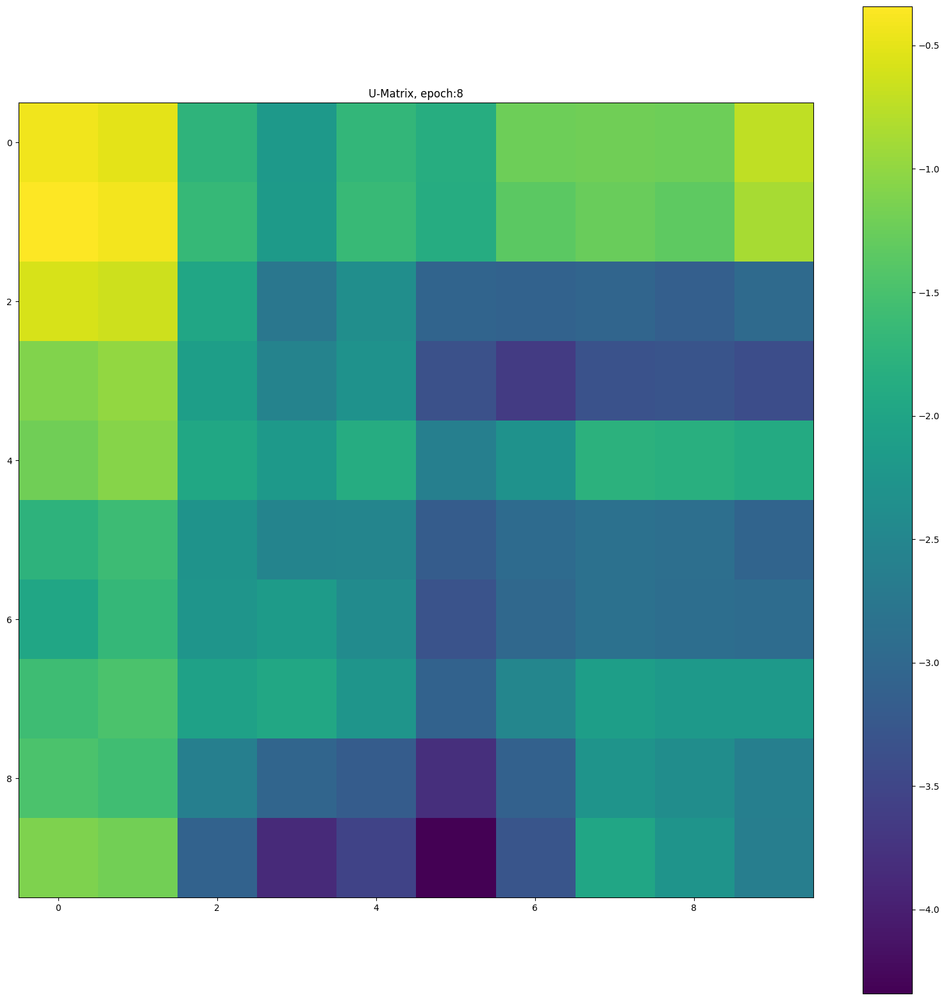

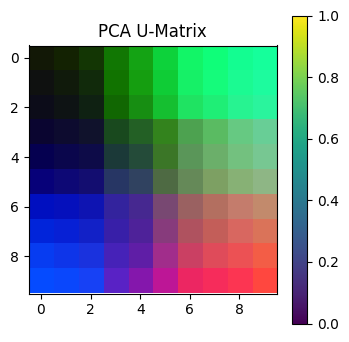

Epoch: 9, QE: 0.271, TE: 0.3446


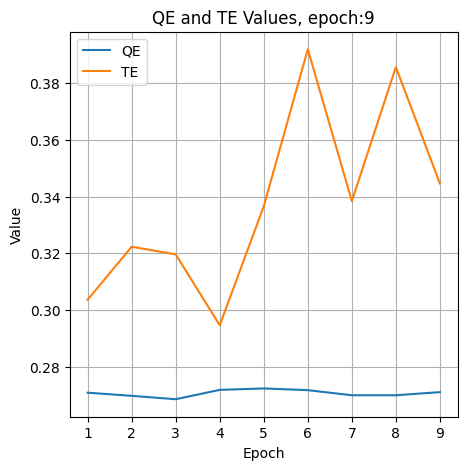

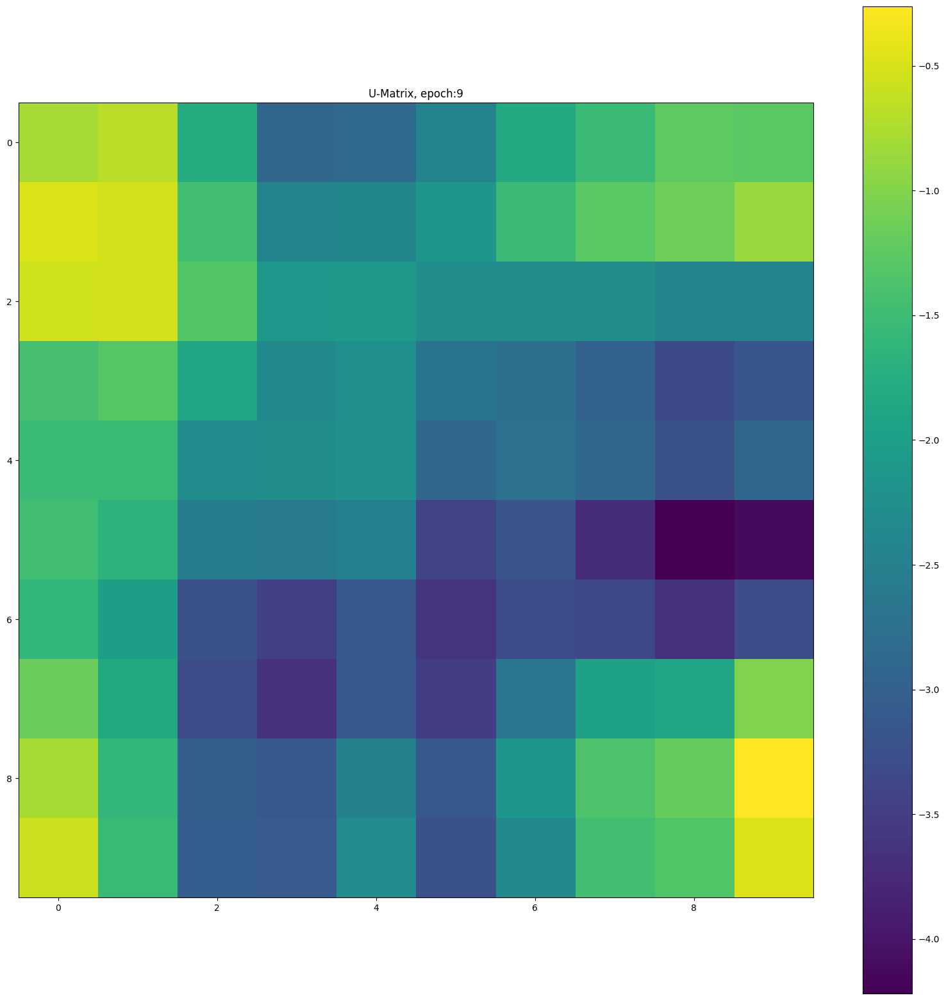

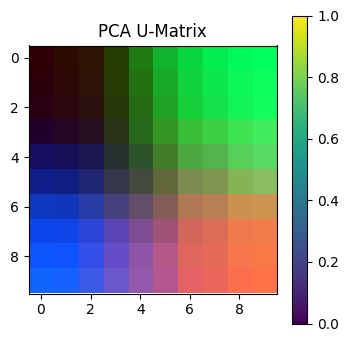

Epoch: 10, QE: 0.2697, TE: 0.3929


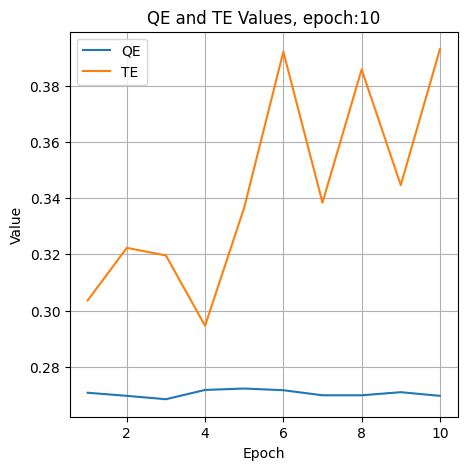

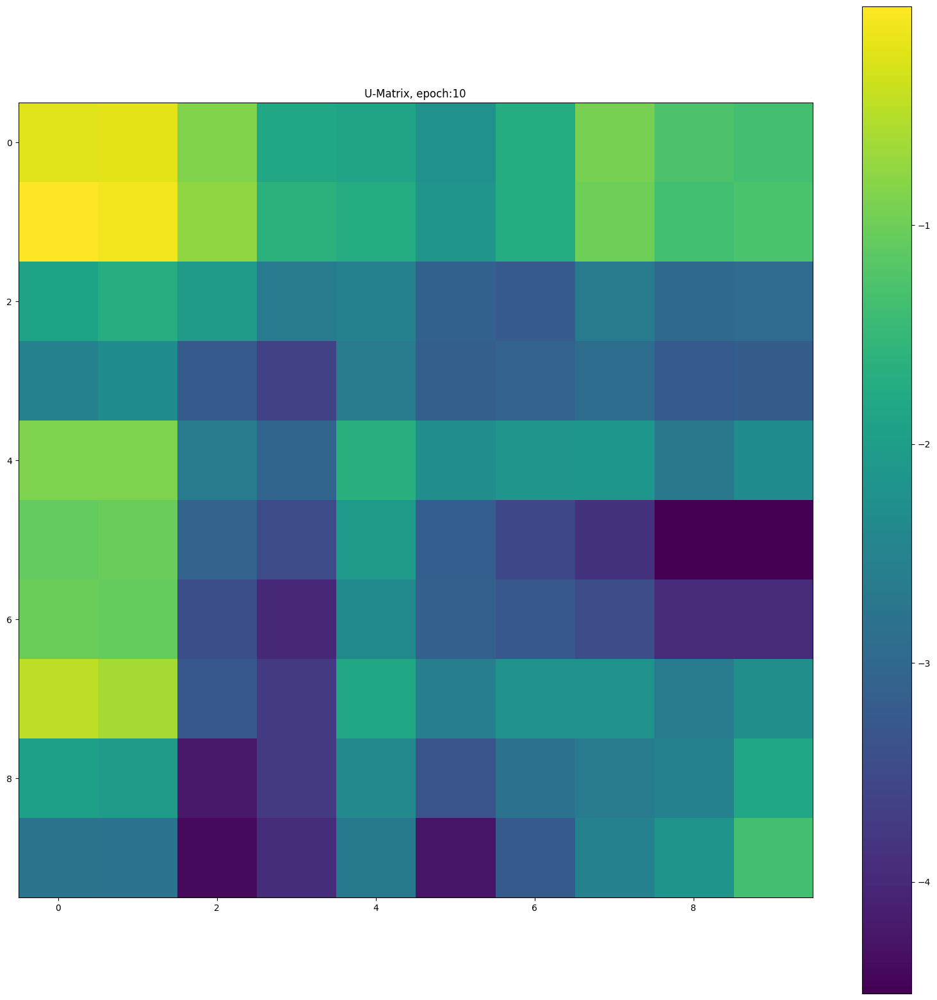

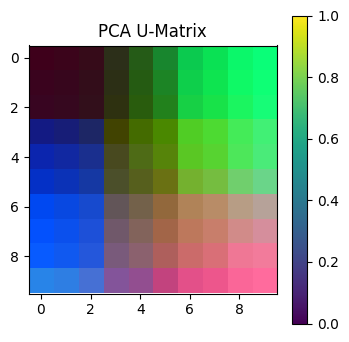

Epoch: 11, QE: 0.2736, TE: 0.3098


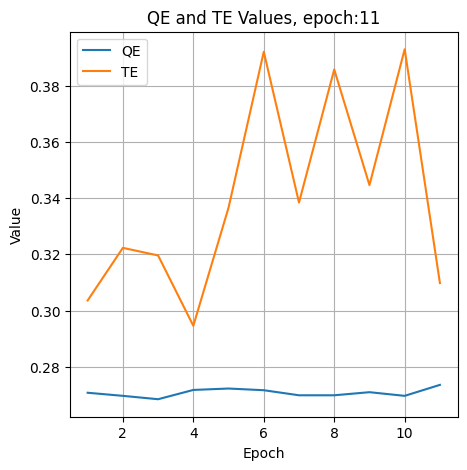

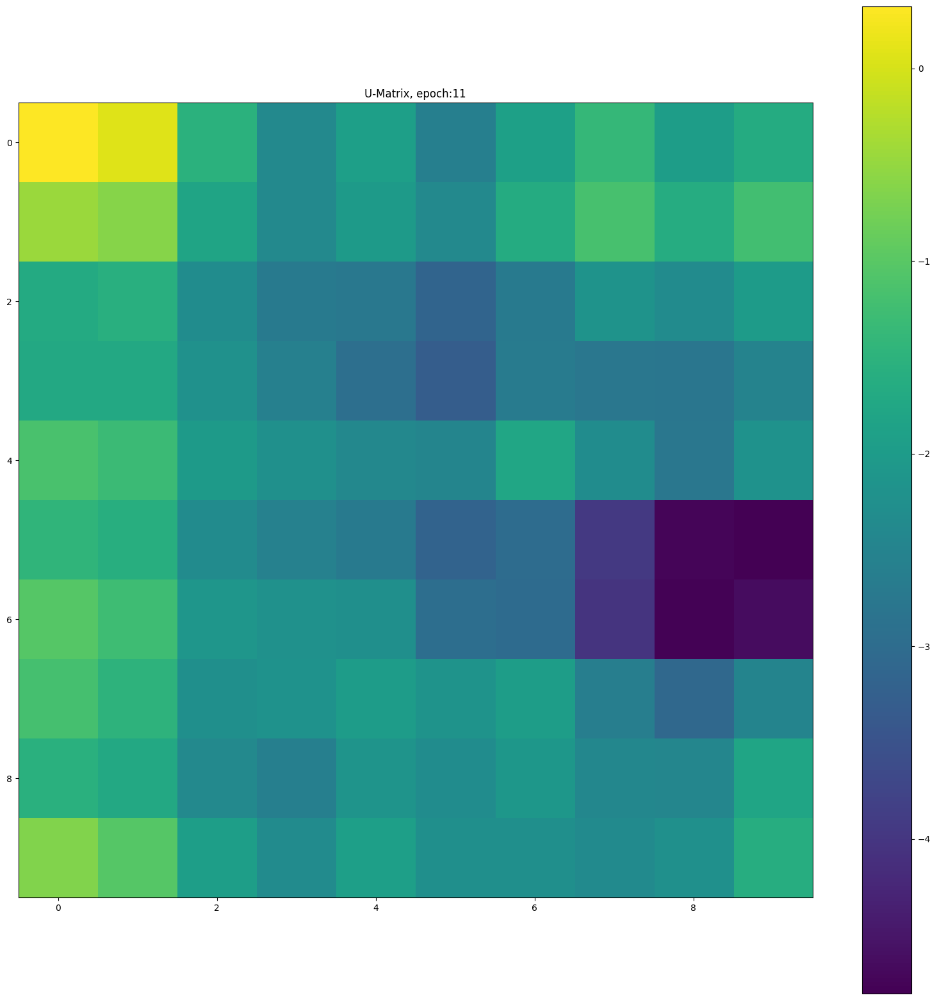

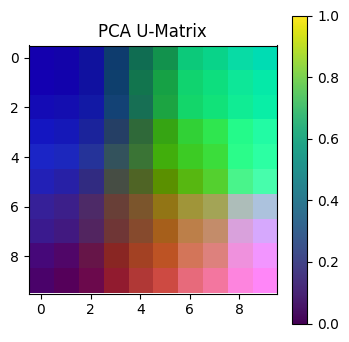

Epoch: 12, QE: 0.2715, TE: 0.35


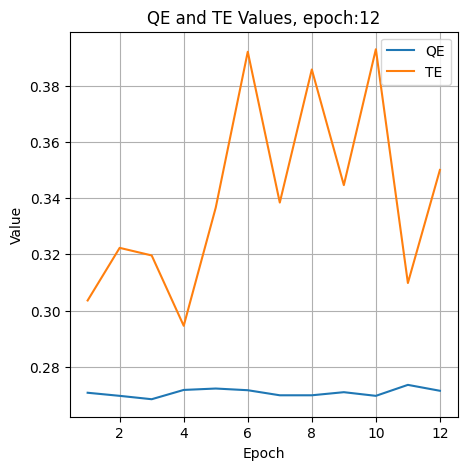

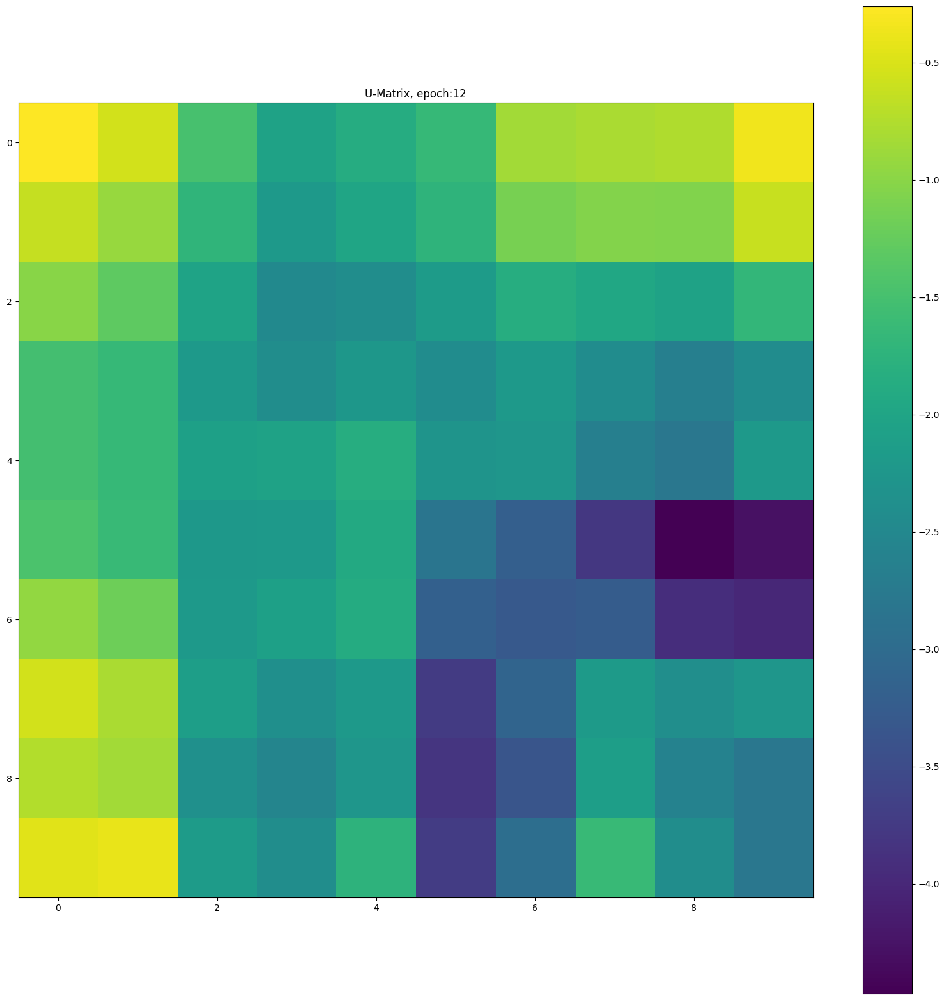

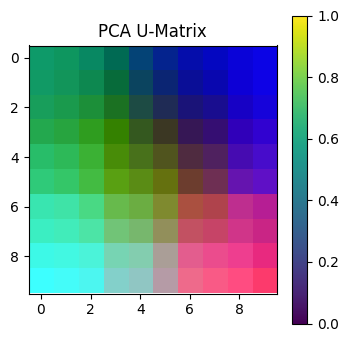

Epoch: 13, QE: 0.2687, TE: 0.3607


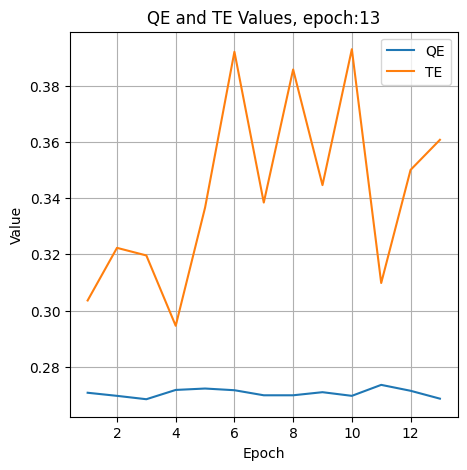

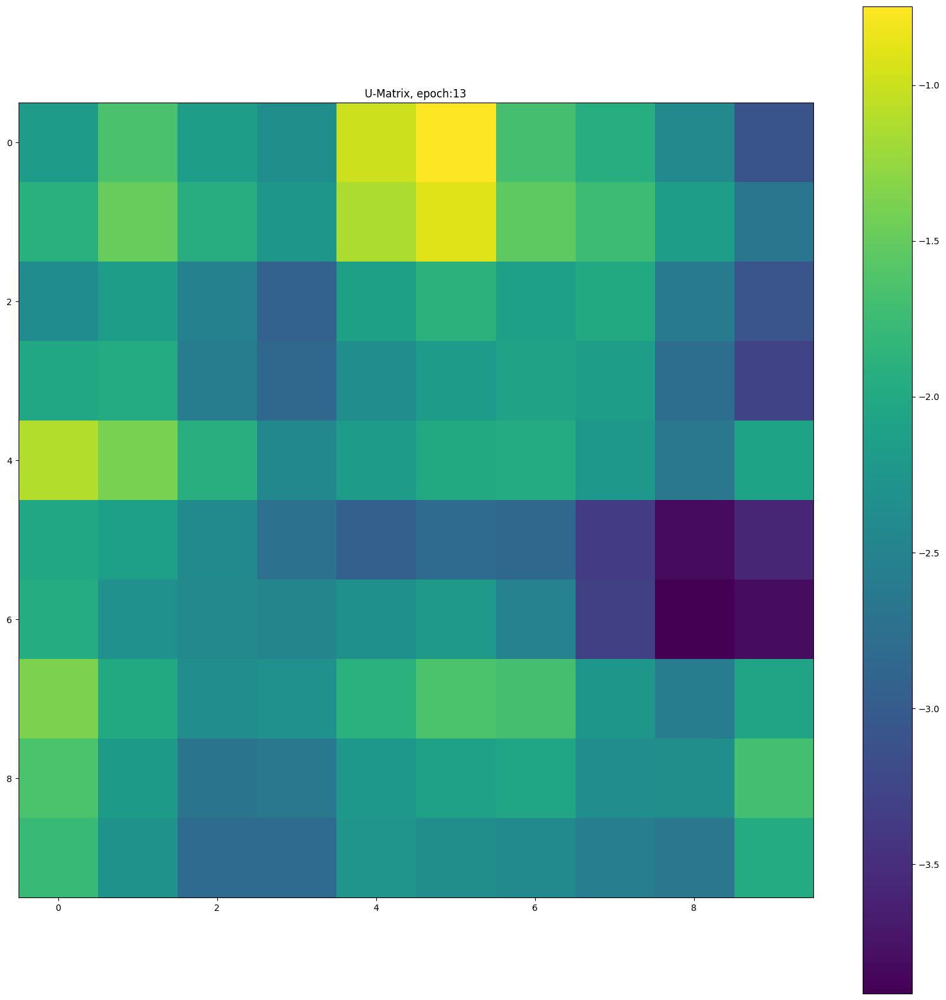

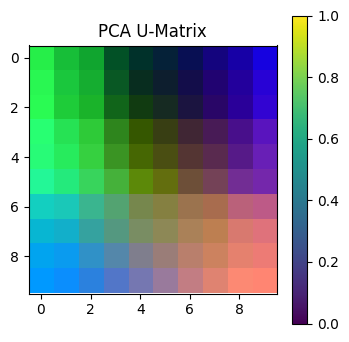

Epoch: 14, QE: 0.2705, TE: 0.3473


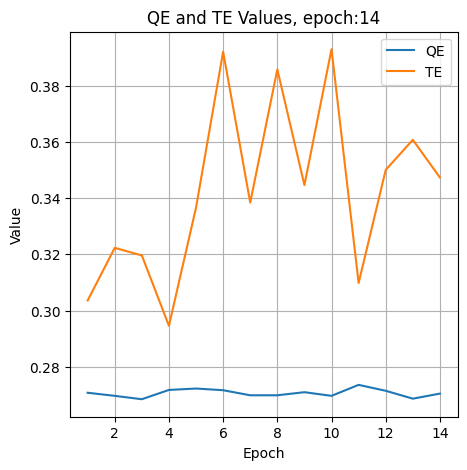

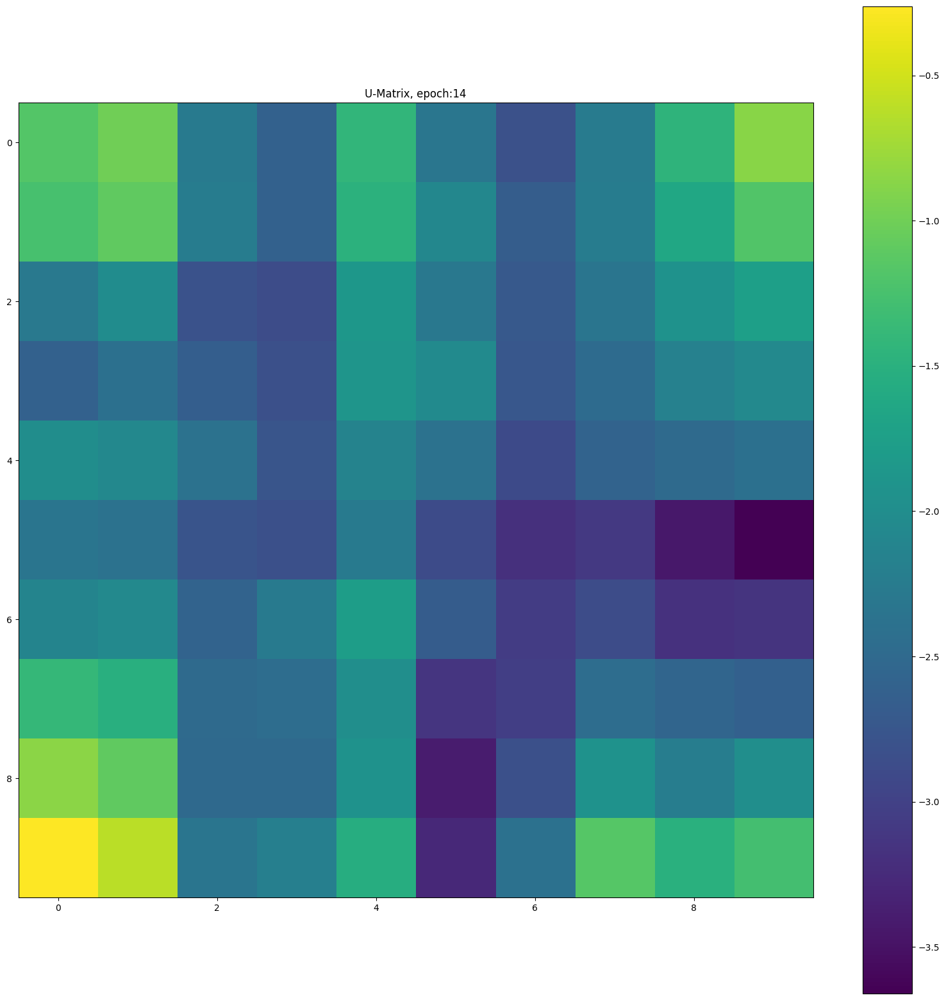

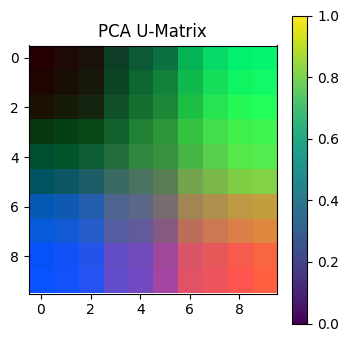

Epoch: 15, QE: 0.2714, TE: 0.3545


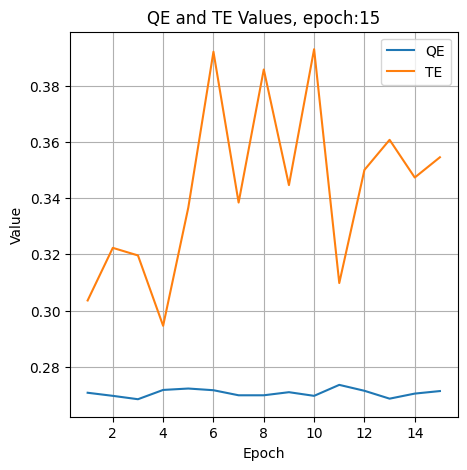

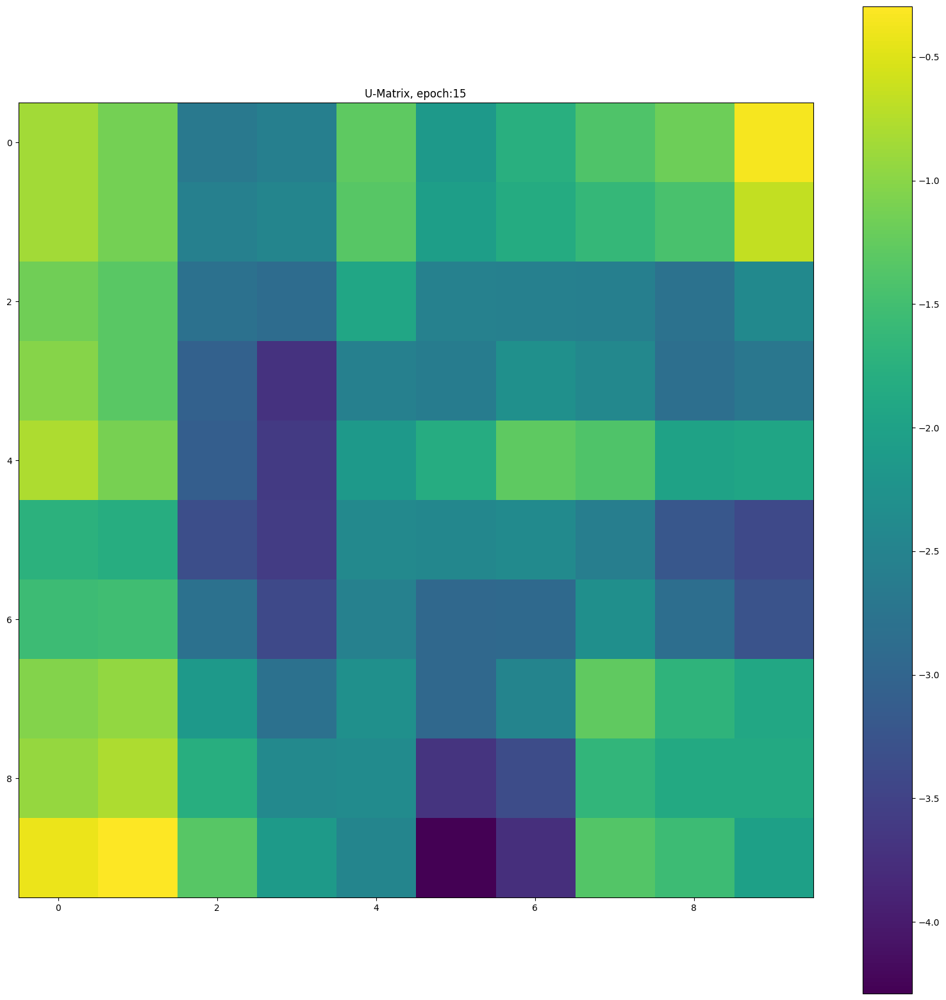

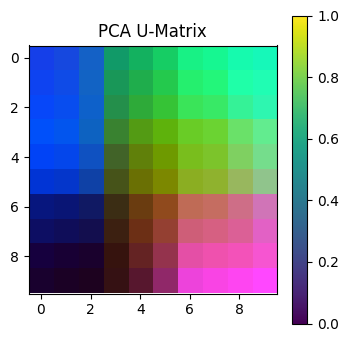

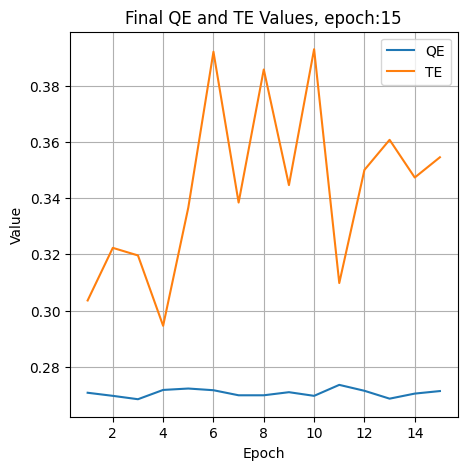

In [383]:
def plot_som_pca(SOM):
    # Reshape the SOM grid into a 2D array
    som_flat = SOM.reshape(-1, SOM.shape[-1])

    # Perform PCA with 3 components
    pca = PCA(n_components=3)
    som_pca = pca.fit_transform(som_flat)

    # Normalize PCA components to [0, 1]
    som_pca_norm = (som_pca - som_pca.min(axis=0)) / (som_pca.max(axis=0) - som_pca.min(axis=0))

    # Create a U-matrix with PCA components as RGB values
    u_matrix_pca = som_pca_norm.reshape(SOM.shape[:-1] + (3,))

    # Plot the U-matrix with PCA colors
    plt.figure(figsize=(4, 4))
    plt.imshow(u_matrix_pca)
    plt.title('PCA U-Matrix')
    plt.colorbar()
    plt.show()

# Initialize SOM grid dimensions
m = 10
n = 10

# Initialize training data
train_data = indiefilmfeatures

# Initialize SOM grid with random weights
SOM = np.random.rand(m, n, train_data[0].shape[0])

epochs = 100
fig, ax = plt.subplots(
    nrows=1, ncols=1, figsize=(4, 4),
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
QE_values = []
TE_values = []
epoch_numbers = []

# Convert train_data to numpy array
train_data_array = np.array(train_data)

# Training loop
for epochs_per_iter, i in zip([15], range(1)):
    total_epochs += epochs_per_iter

    # Train the SOM for the specified number of epochs_per_iter
    for epoch in range(1, epochs_per_iter + 1):
        SOM = train_SOM(SOM, train_data_array, learn_rate=0.1, radius_sq=12, epochs=1)  # Train for 1 epoch

        # Calculate QE and TE
        QE = round(calculateQE(SOM, train_data_array), 4)
        TE = round(calculateTE(SOM, train_data_array), 4)

        # Print epoch number and QE, TE values
        print(f"Epoch: {total_epochs - epochs_per_iter + epoch}, QE: {QE}, TE: {TE}")

        # Save QE and TE values
        QE_values.append(QE)
        TE_values.append(TE)
        epoch_numbers.append(total_epochs - epochs_per_iter + epoch)

        # Save a copy of SOM at this epoch
        SOMS.append(SOM.copy())

        # Plot QE and TE values after each epoch
        plt.figure(figsize=(5, 5))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot the u_matrix after each epoch
        plt.figure(figsize=(20, 20))
        plt.imshow(u_matrix(SOM))
        plt.title('U-Matrix, epoch:'+str(epoch))
        plt.colorbar()
        plt.show()

        # Plot the SOM based on PCA
        plot_som_pca(SOM)

    # Plot the final state of the SOM grid after the last epoch
    if epoch == epochs_per_iter:
        plt.figure(figsize=(5, 5))
        plt.plot(epoch_numbers, QE_values, label='QE')
        plt.plot(epoch_numbers, TE_values, label='TE')
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Final QE and TE Values, epoch:'+str(epoch))
        plt.legend()
        plt.grid(True)
        plt.show()

    ax.imshow(u_matrix(SOM))
    ax.title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

# Show the final plot
plt.show()

In [384]:
SOM= SOMS[12]

In [385]:
QE = QE_values[12]
TE = TE_values[12]

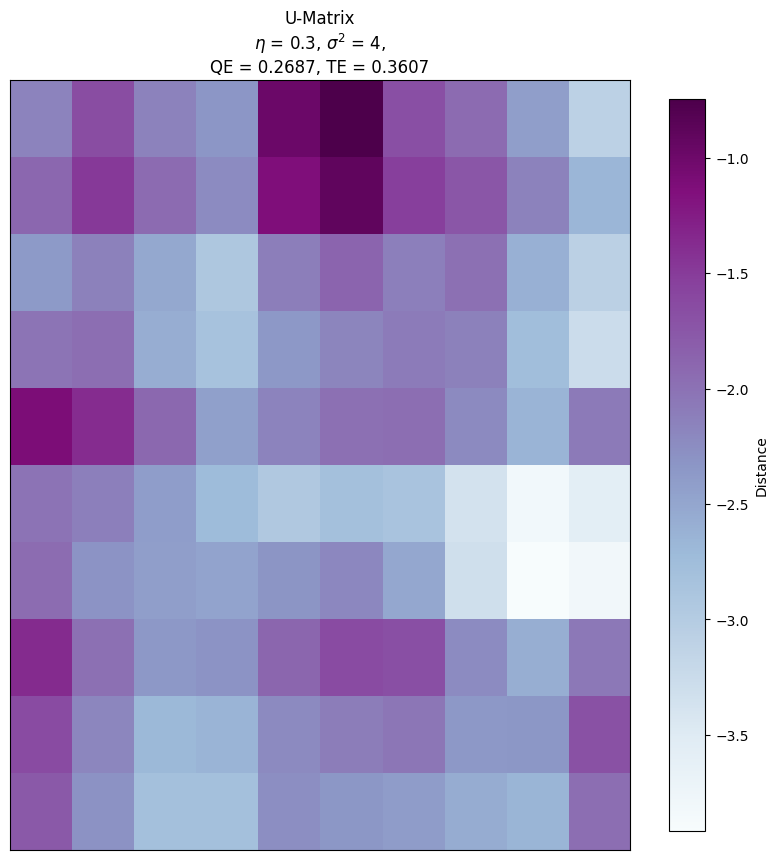

In [386]:
u_matrix_values = u_matrix(SOM)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [387]:
indiefilm_som_model = SOMS[12]

In [388]:
with open('indiefilm_som_model.pkl', 'wb') as f:
    pickle.dump(indiefilm_som_model, f)

In [389]:
with open('indiefilm_som_model.pkl', 'rb') as f:
    loaded_indiefilm_som_model = pickle.load(f)

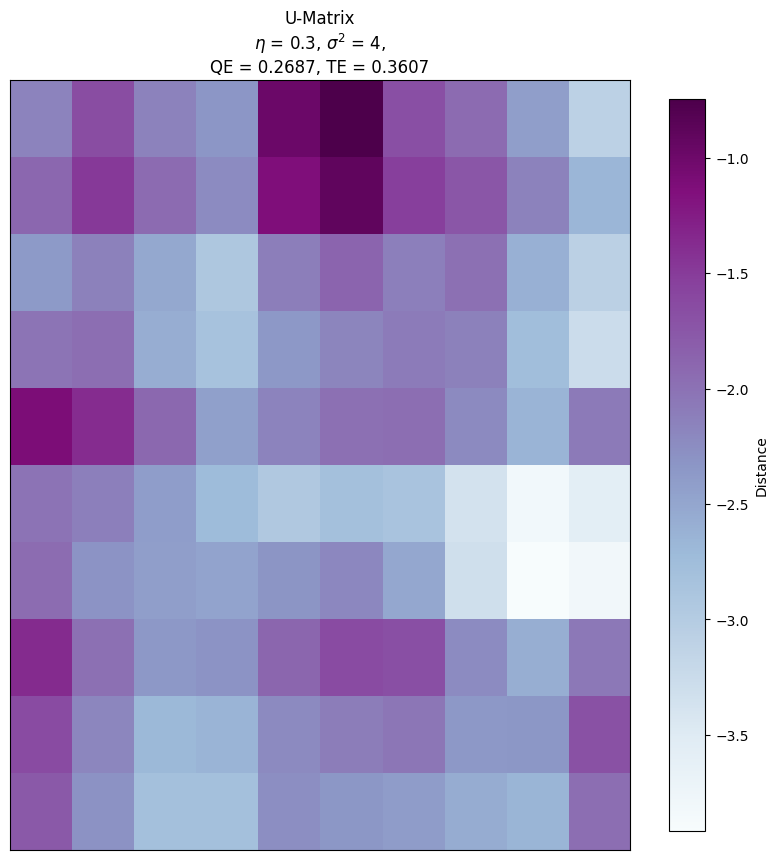

In [390]:
indiefilm_u_matrix = u_matrix(loaded_indiefilm_som_model)
QE = round(calculateQE(loaded_indiefilm_som_model, indiefilmfeatures), 4)
TE = round(calculateTE(loaded_indiefilm_som_model, indiefilmfeatures), 4)

plt.figure(figsize=(10, 10))
im = plt.imshow(u_matrix_values, cmap=cm.BuPu, aspect='auto')
plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
plt.colorbar(im, shrink=0.95, label='Distance')
plt.xticks([])
plt.yticks([])
plt.show()

In [391]:
indiefilm_dict = []
for i in range(len(loaded_indiefilm_som_model)):
    row = []
    for j in range(len(loaded_indiefilm_som_model[0])):
        row.append([])
    indiefilm_dict.append(row)
for i in indiefilmfeatureImagePairs:
    query=i['feature']
    g,h = find_BMU(loaded_indiefilm_som_model,query)
    indiefilm_dict [g][h].append(i)

In [392]:
with open('indiefilm_dict.pkl', 'wb') as f:
    pickle.dump(indiefilm_dict, f)

In [393]:
def distance_between(a, b):
    a = np.asarray(a, dtype=np.float64)
    b = np.asarray(b, dtype=np.float64)
    return np.linalg.norm(a - b)

In [394]:
def find_closest_image_index(distance):
    closest_index = 0
    distance_closest = distance[0]

    for index in range(1, len(distance)):
        if distance[index] < distance_closest:
            distance_closest = distance[index]
            closest_index = index

    return closest_index

In [395]:
def get_closest_image(a,b):
  cell = loaded_indiefilm_som_model[a][b]
  distance = [distance_between(cell, i['feature']) for i in indiefilm_dict[a][b]]
  closest_image_index=find_closest_image_index(distance)
  return closest_image_index

In [396]:
def searchindiefilmframessom(query):
    result=[]
    query_features=[]
    path = query
    q_f = processImage(path, model4)
    query_features.append(q_f)
    activatedSOM = activate(indiefilmfeatures, loaded_indiefilm_som_model, query_features)
    fig = plt.figure()
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    g,h=find_BMU(loaded_indiefilm_som_model,query_features)
    closest_image_index=get_closest_image(g,h)
    result.append(indiefilm_dict[g][h][closest_image_index]['image'])
    return result

In [381]:
def get_closest_image(a, b):
    cell = loaded_indiefilm_som_model[a][b]
    distances = [distance_between(cell, i['feature']) for i in indiefilm_dict[a][b]]
    closest_image_index = find_closest_image_index(distances)
    return closest_image_index

def find_closest_image_index(distances):
    if distances:
        closest_index = 0
        distance_closest = distances[0]
        for index in range(1, len(distances)):
            if distances[index] < distance_closest:
                closest_index = index
                distance_closest = distances[index]
        return closest_index
    else:
        return None

def searchindiefilmframessom(query):
    result = []
    query_features = processImage(query, model3)
    activatedSOM = activate1(indiefilm_u_matrix, loaded_indiefilm_som_model, query_features)
    plt.figure(figsize=(10, 10))
    im = plt.imshow(activatedSOM, cmap=cm.BuPu, aspect='auto')
    plt.title(f'U-Matrix\n$\eta$ = {0.3}, $\sigma^2$ = {4},\nQE = {QE}, TE = {TE}')
    plt.colorbar(im, shrink=0.95, label='Distance')
    plt.xticks([])
    plt.yticks([])
    plt.show()
    g, h = find_BMU(loaded_indiefilm_som_model, query_features)
    closest_image_index = get_closest_image(g, h)
    if closest_image_index is not None:
        result.append(indiefilm_dict[g][h][closest_image_index]['image'])
    return result

# Global Search examples


### Text Domain - Image Domain - Film Domain
### Text Domain - Film Domain - Image Domain
### Image Domain - Text Domain - Film Domain
### Image Domain - Film Domain - Text Domain
### Film Domain - Text Domain - Image Domain
### Film Domain - Image Domain - Text Domain
### ... ...

## Dynamic System

### By matching and transforming the data, it is possible to achieve functions such as selecting a site based on the behaviour of a text or an non-mainstream film, finding a corresponding urban environments and human behaviour in pictures based on the reality counterparts, and re-contextualising an existing text.

### 1
#### Madrid places and their IndieFilm scenes metaphors. Madrid places within xtopian context.

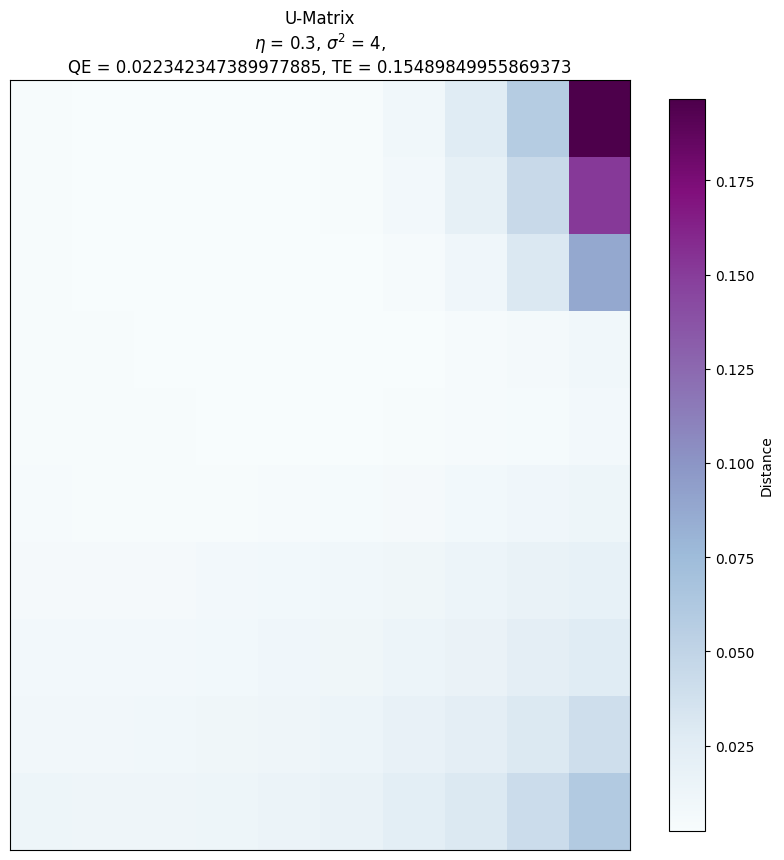

(2, 3)


' "…so frightfully clever," the soft, insinuating, indefatigable voice was saying, "Im really awfully glad Im a Beta, because…" Not so much like drops of water, though water, it is true, can wear holes in the hardest granite; rather, drops of liquid sealing–wax, drops that adhere, incrust, incorporate themselves with what they fall on, till finally the rock is all one scarlet blob.'

In [159]:
searchtextsom('A parliament of counter-culture.')

<Figure size 640x480 with 0 Axes>

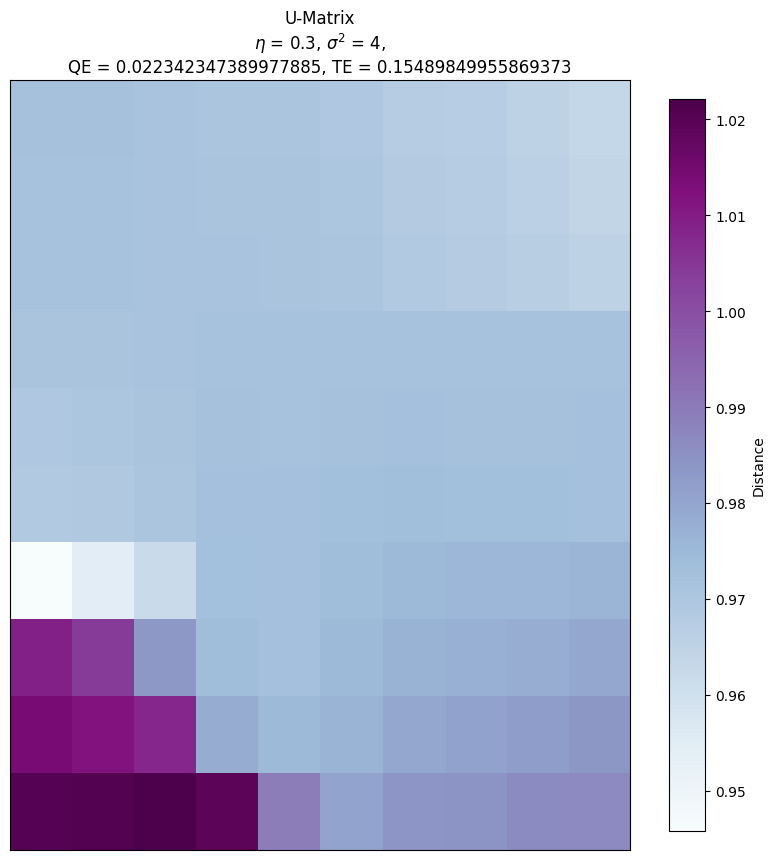

['In the image, there are various objects on the street, including cars, a motorcycle, a scooter, and pedestrians. A motorcycle is parked on the street, while another motorcycle is visible further down the street. A scooter is parked nearby.\n\nThere are multiple cars on the street, with one car being closer to the left side of the image']

In [160]:
searchmadridfuyusom('Its merely a question of self–discipline, reality–control. But in the end there wont be any need even for that. The Revolution will be complete when the language is perfect. Newspeak is Ingsoc and Ingsoc is Newspeak, he added with a sort of mystical satisfaction.')

Correspondant keyframe： ['keyframe_764.jpg']


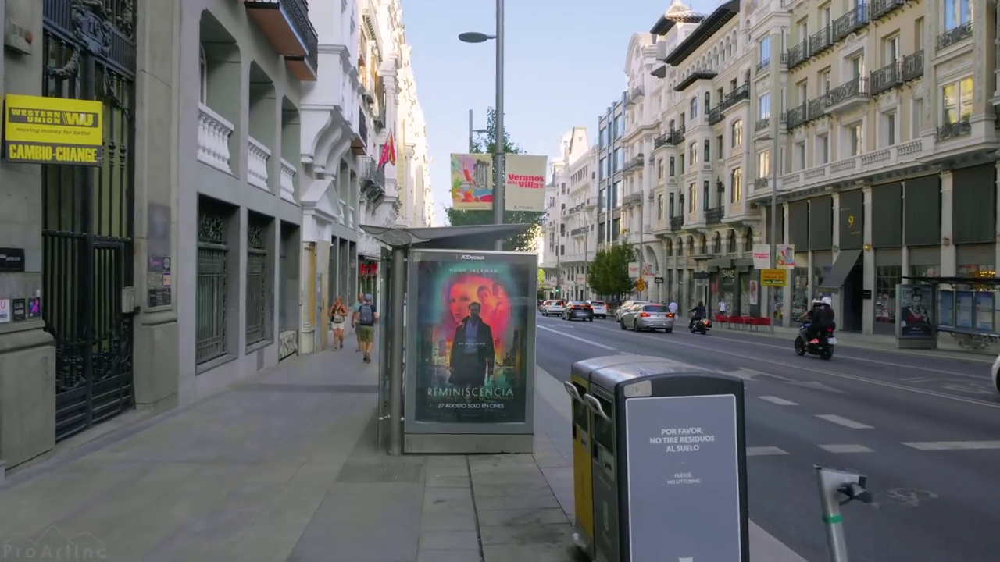

In [162]:
import csv

example_content = "In the image, there are various objects on the street, including cars, a motorcycle, a scooter, and pedestrians. A motorcycle is parked on the street, while another motorcycle is visible further down the street. A scooter is parked nearby.\n\nThere are multiple cars on the street, with one car being closer to the left side of the image"

corresponding_first_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\Images\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 70ms/step


<Figure size 640x480 with 0 Axes>

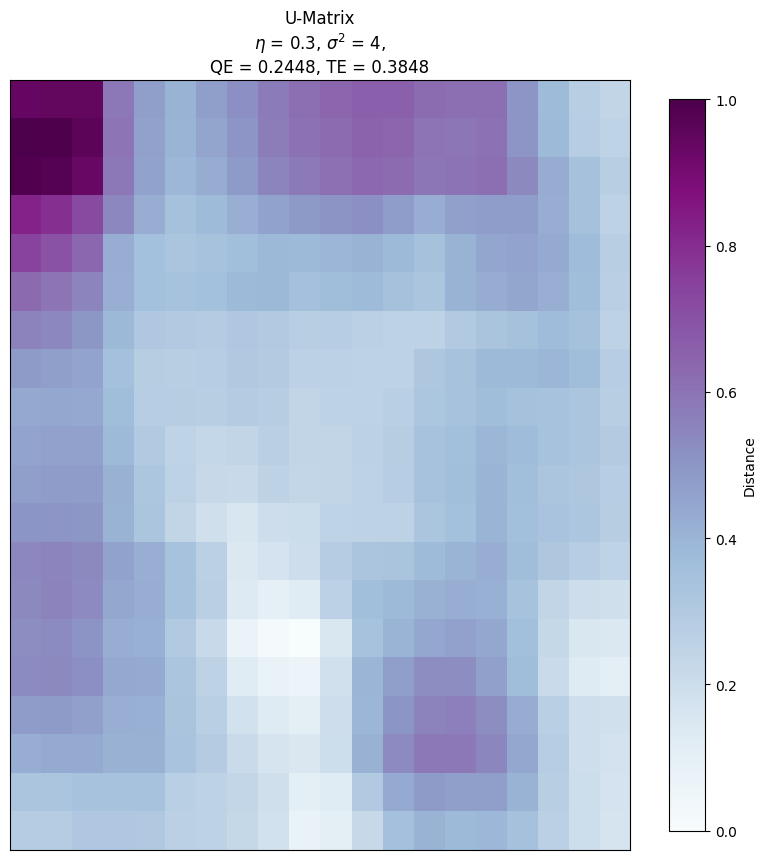

['FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine_frame_3310.jpg']

In [190]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_764.jpg')

In [415]:
input_content = "FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine_frame_3310"

file_name = os.path.basename(input_content)

match = re.search(r'_frame_\d+', file_name)

if match:
    frame_string = match.group()

    new_file_name = file_name.replace(frame_string, ".mp4")

    video_path = os.path.join("D:\\FinalAssignment\\Movies\\", new_file_name)

print(video_path)

D:\FinalAssignment\Movies\FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine.mp4


### 2
#### Madrid places and their IndieFilm scenes metaphors. Madrid places within xtopian context.

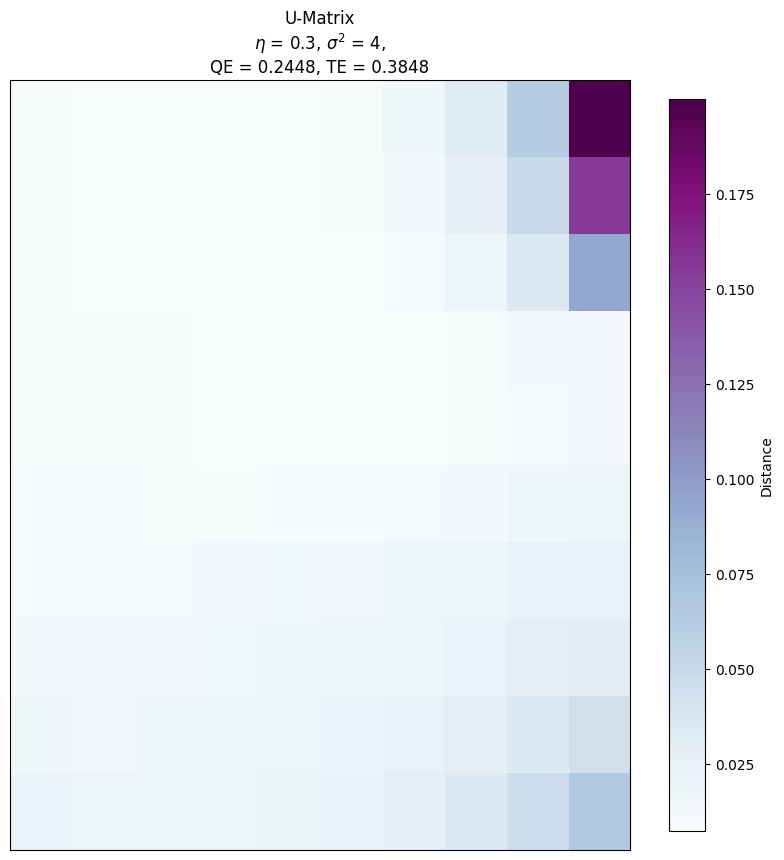

(2, 4)


' A look of astonished incredulity appeared on the faces of his listeners. Poor little kids not allowed to amuse themselves? They could not believe it. "Even adolescents," the D.H.C. was saying, "even adolescents like yourselves…" "Not possible!" "Barring a little surreptitious auto–erotism and homosexuality–absolutely nothing.'

In [192]:
searchtextsom('Who else decodes you.')

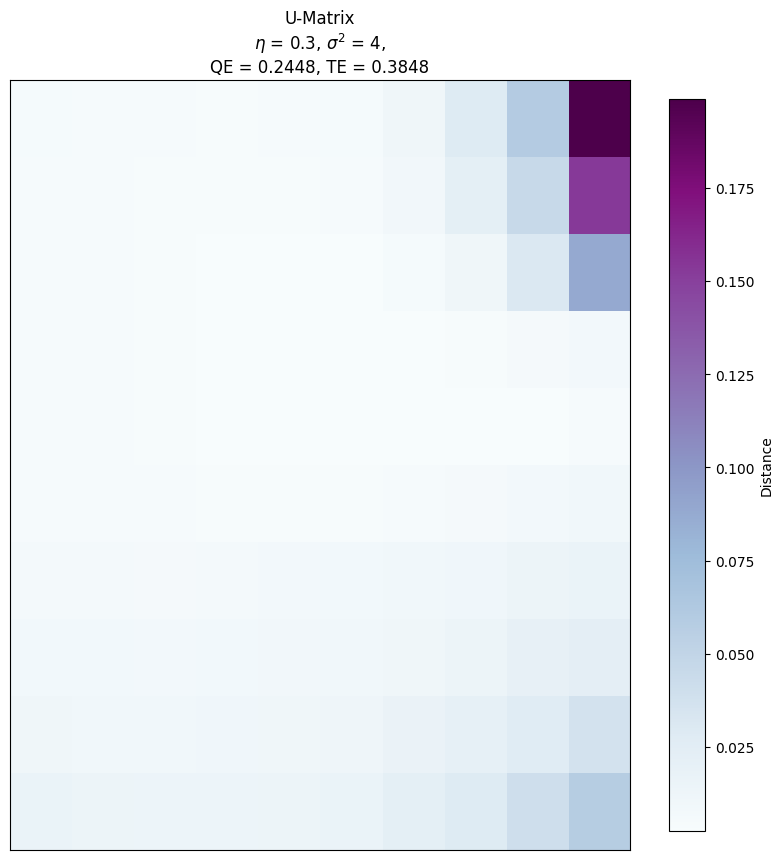

['In the image, there is a large monument with statues, a fountain, and many people walking around it. Among the people, there are at least 14 individuals visible. Some of them are carrying handbags, indicating that they might be tourists.\n']

In [199]:
searchmadridfuyusom('A look of astonished incredulity appeared on the faces of his listeners. Poor little kids not allowed to amuse themselves? They adolescents like yourselves nothing.')

Correspondant keyframe： ['keyframe_49.jpg']


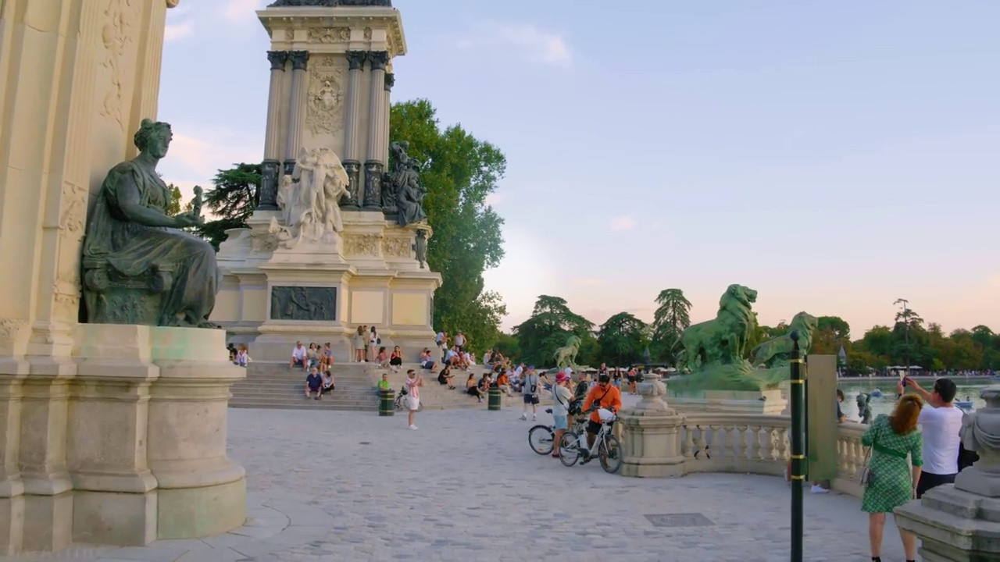

In [209]:
example_content = "In the image, there is a large monument with statues, a fountain, and many people walking around it. Among the people, there are at least 14 individuals visible. Some of them are carrying handbags, indicating that they might be tourists.\n"

corresponding_first_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\Images\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 54ms/step


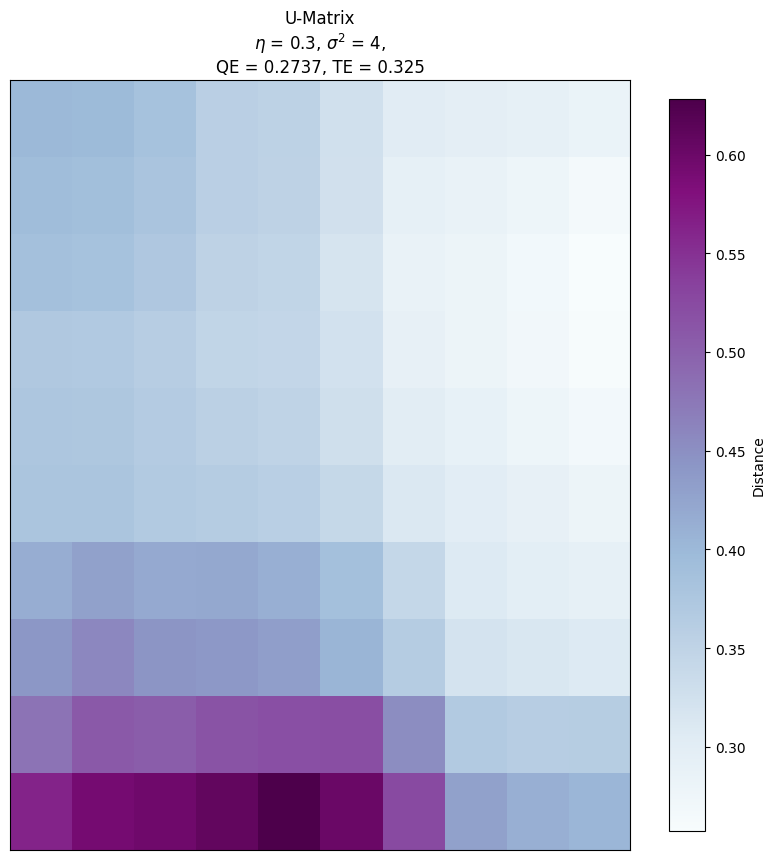

['Dance Roller Skating Unifies a Community in Los Angeles  LA ROLL_frame_21612.jpg']

In [224]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_49.jpg')

In [225]:
input_content = "Dance Roller Skating Unifies a Community in Los Angeles  LA ROLL_frame_21612"

file_name = os.path.basename(input_content)

match = re.search(r'_frame_\d+', file_name)

if match:
    frame_string = match.group()

    new_file_name = file_name.replace(frame_string, ".mp4")

    video_path = os.path.join("D:\\FinalAssignment\\Movies\\", new_file_name)

print(video_path)

D:\FinalAssignment\Movies\Dance Roller Skating Unifies a Community in Los Angeles  LA ROLL.mp4


### 3
#### Madrid urban environment within xtopian or IndieFilm context

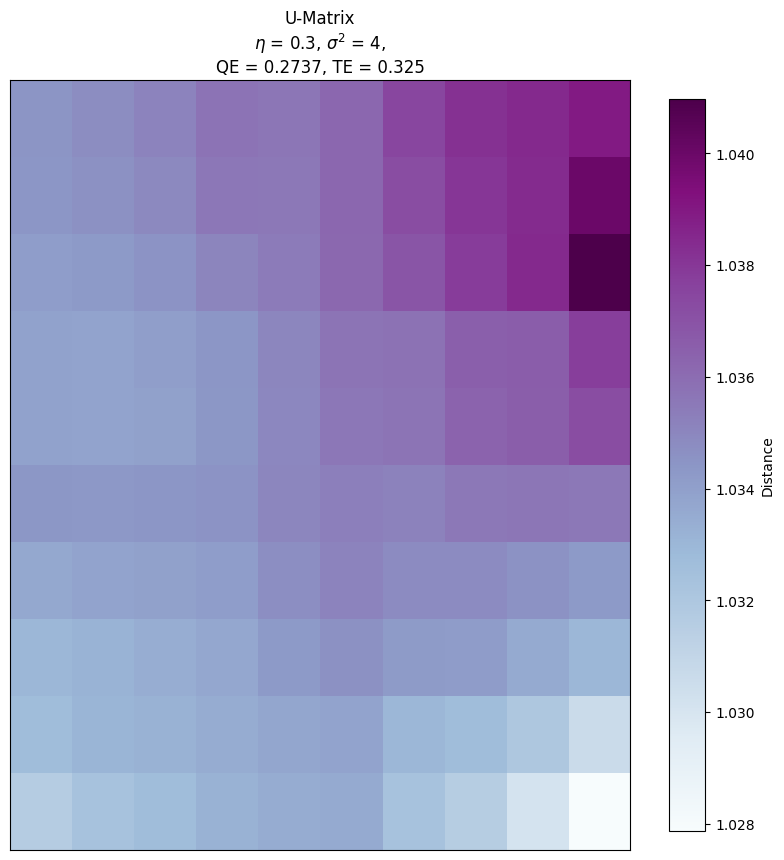

['In the image, there is a cityscape with buildings, trees, and a city skyline. The skyline is surrounded by trees, and the cityscape is surrounded by greenery.\n']

In [228]:
searchmadridfuyusom('Plaza')

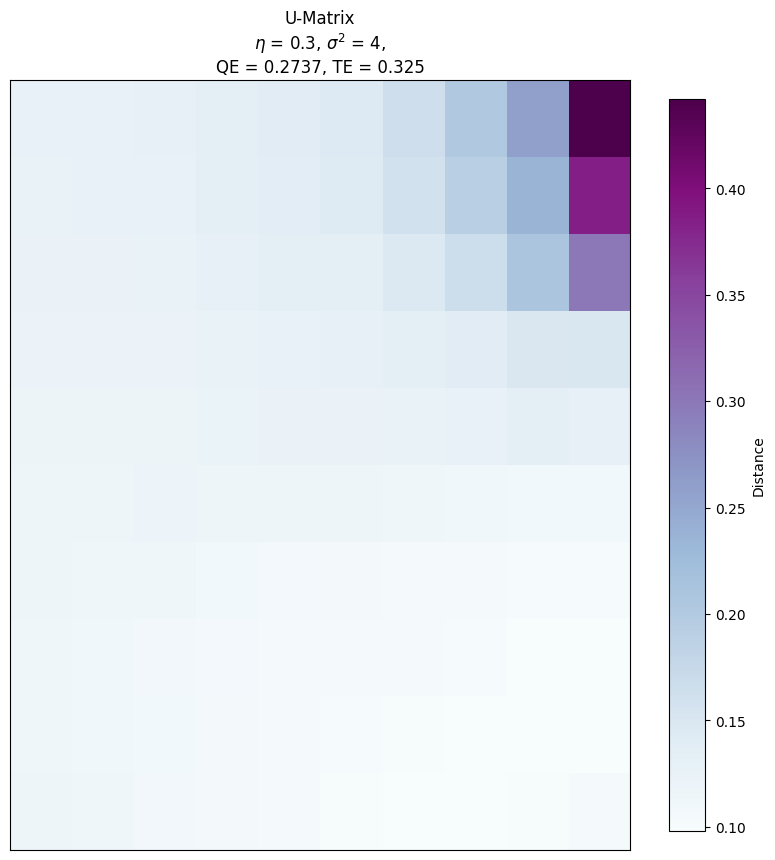

(8, 8)


' Hideously masked or painted out of all semblance of humanity, they had tramped out a strange limping dance round the square; round and again round, singing as they went, round and round–each time a little faster; and the drums had changed and quickened their rhythm, so that it became like the pulsing of fever in the ears; and the crowd had begun to sing with the dancers, louder and louder; and first one woman had shrieked, and then another and another, as though they were being killed; and then suddenly the leader of the dancers broke out of the line, ran to a big wooden chest which was standing at one end of the square, raised the lid and pulled out a pair of black snakes.'

In [229]:
searchtextsom('In the image, there is a cityscape with buildings, trees, and a city skyline. The skyline is surrounded by trees, and the cityscape is surrounded by greenery.\n')

Correspondant keyframe： ['keyframe_513.jpg']


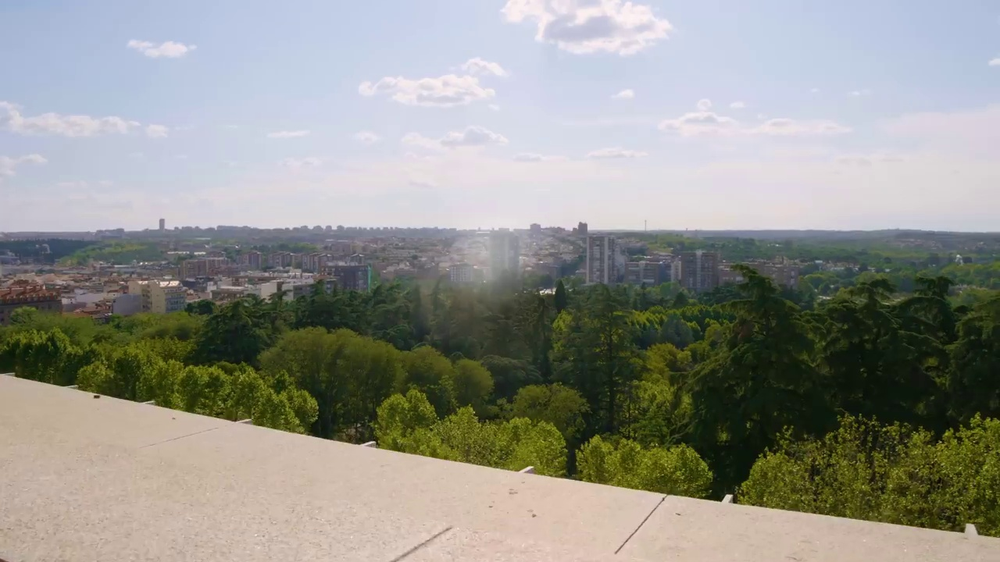

In [230]:
example_content = "In the image, there is a cityscape with buildings, trees, and a city skyline. The skyline is surrounded by trees, and the cityscape is surrounded by greenery.\n"

corresponding_first_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\Images\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 74ms/step


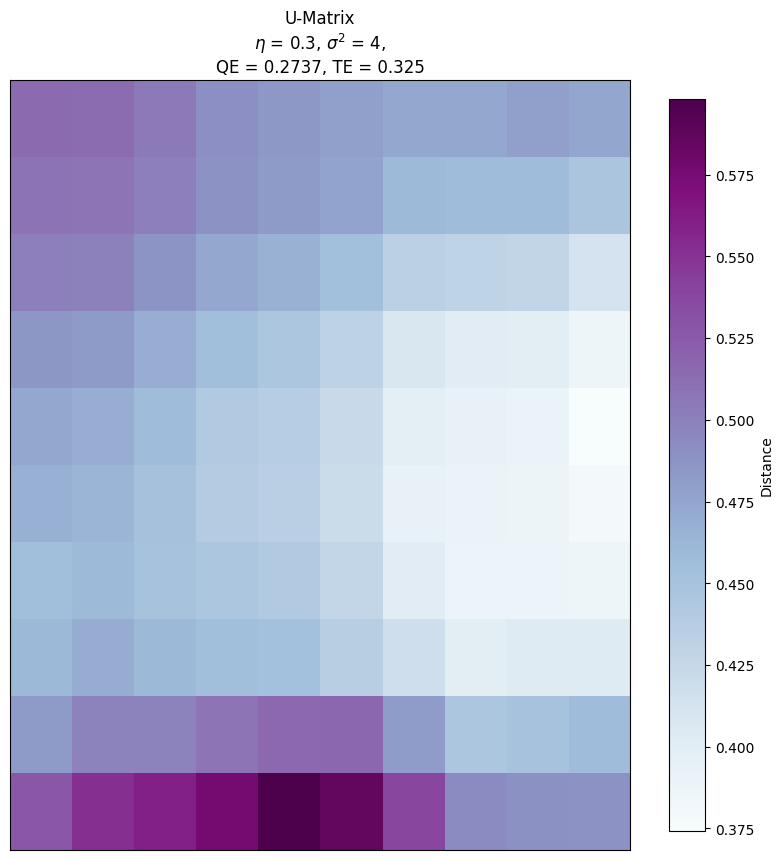

['Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week_frame_7041.jpg']

In [231]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_513.jpg')

In [232]:
input_content = "Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week_frame_7041"

file_name = os.path.basename(input_content)

match = re.search(r'_frame_\d+', file_name)

if match:
    frame_string = match.group()

    new_file_name = file_name.replace(frame_string, ".mp4")

    video_path = os.path.join("D:\\FinalAssignment\\Movies\\", new_file_name)

print(video_path)

D:\FinalAssignment\Movies\Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week.mp4


### 4
#### Madrid urban environment within xtopian or IndieFilm context

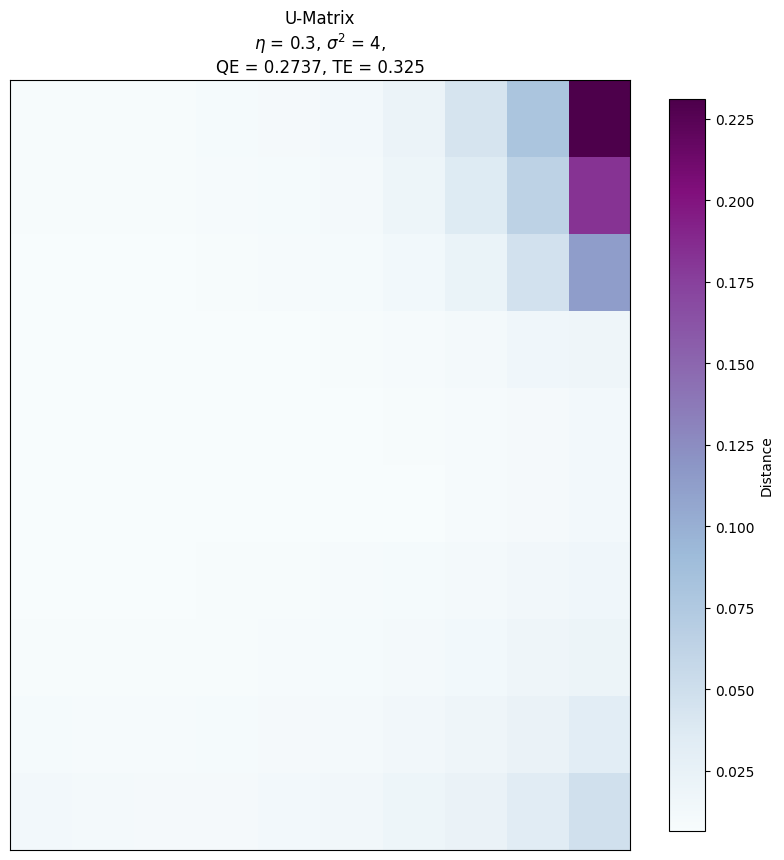

['In the image, there is a large crowd of people walking down a street, with some of them carrying handbags. Among them, there is a man with a backpack standing next to a woman wearing a pink dress.\n']

In [234]:
searchmadridfuyusom('Square')

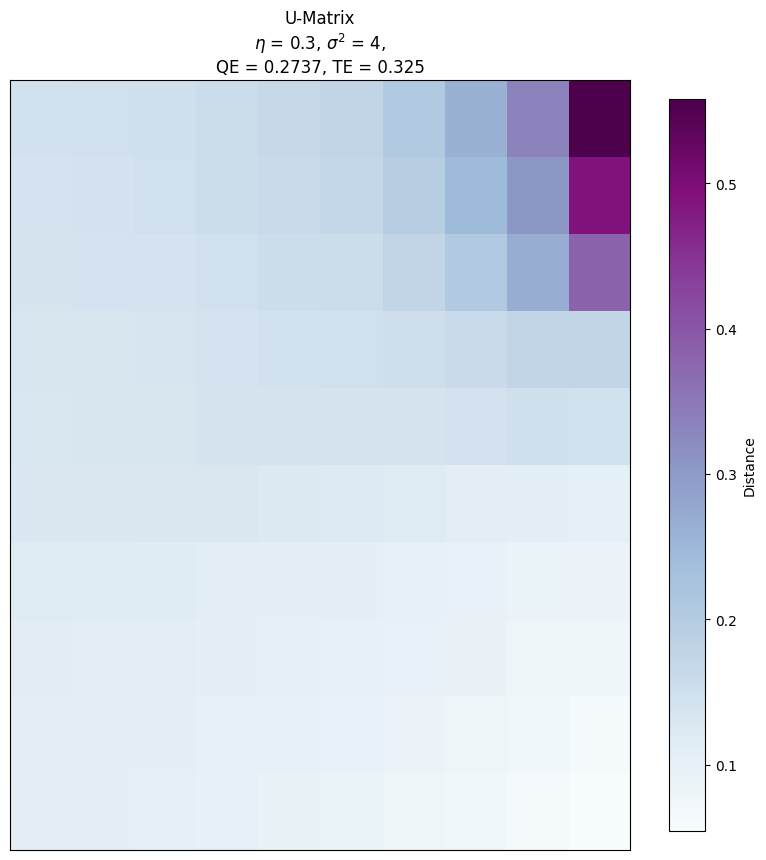

(9, 9)


' The boy walked. Twice, thrice, four times round he went. The blood was streaming. Five times round, six times round. Suddenly Lenina covered her face shish her hands and began to sob. "Oh, stop them, stop them!" she implored.'

In [235]:
searchtextsom('In the image, there is a large crowd of people walking down a street, with some of them carrying handbags. Among them, there is a man with a backpack standing next to a woman wearing a pink dress.\n')

Correspondant keyframe： ['keyframe_111.jpg']


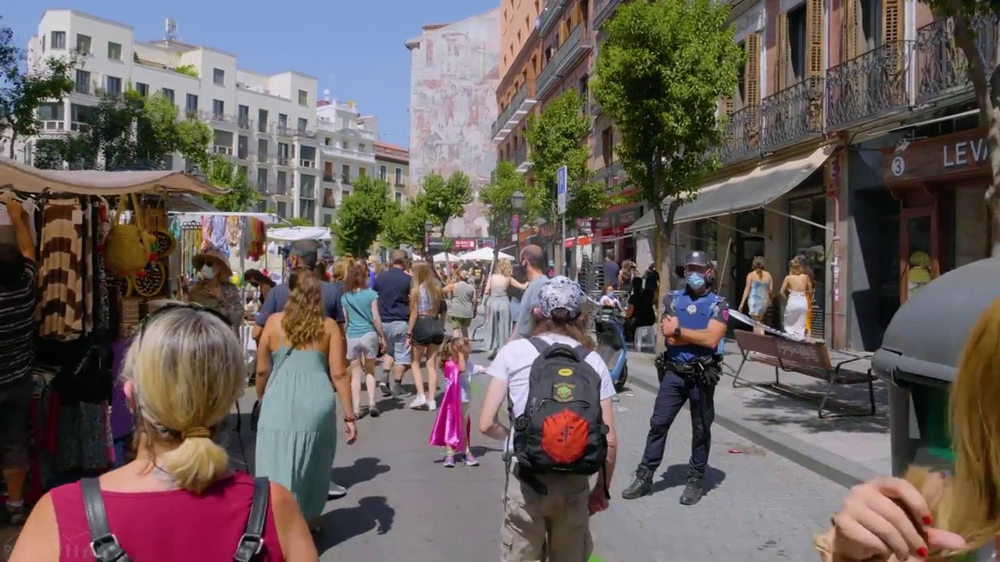

In [255]:
example_content = "In the image, there is a large crowd of people walking down a street, with some of them carrying handbags. Among them, there is a man with a backpack standing next to a woman wearing a pink dress.\n"

corresponding_first_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\Images\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 76ms/step


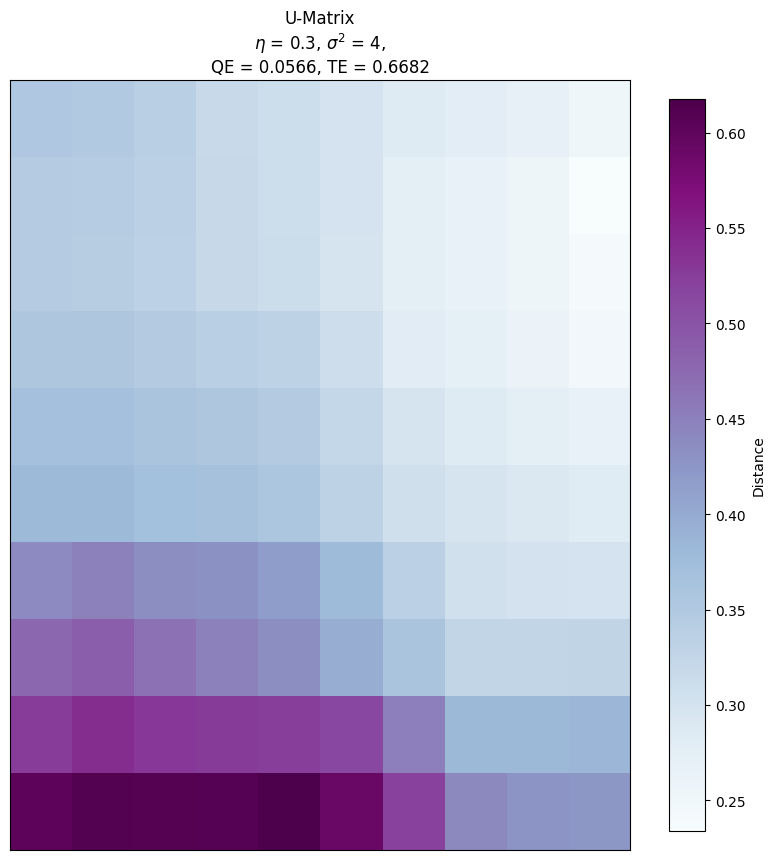

['FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine_frame_3310.jpg']

In [256]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_111.jpg')

In [257]:
input_content = "FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine_frame_3310.jpg"

file_name = os.path.basename(input_content)

match = re.search(r'_frame_\d+', file_name)

if match:
    frame_string = match.group()

    new_file_name = file_name.replace(frame_string, ".mp4")

    video_path = os.path.join("D:\\FinalAssignment\\Movies\\", new_file_name)

print(video_path)

D:\FinalAssignment\Movies\FLITE  Hyper Realistic CG Sci-Fi Short Using Unreal Engine.mp4.jpg


### 5
#### Finding Madrid urban space and behaviour matching Indie Films, and its interpretation under xtopian fictions

<Figure size 640x480 with 0 Axes>

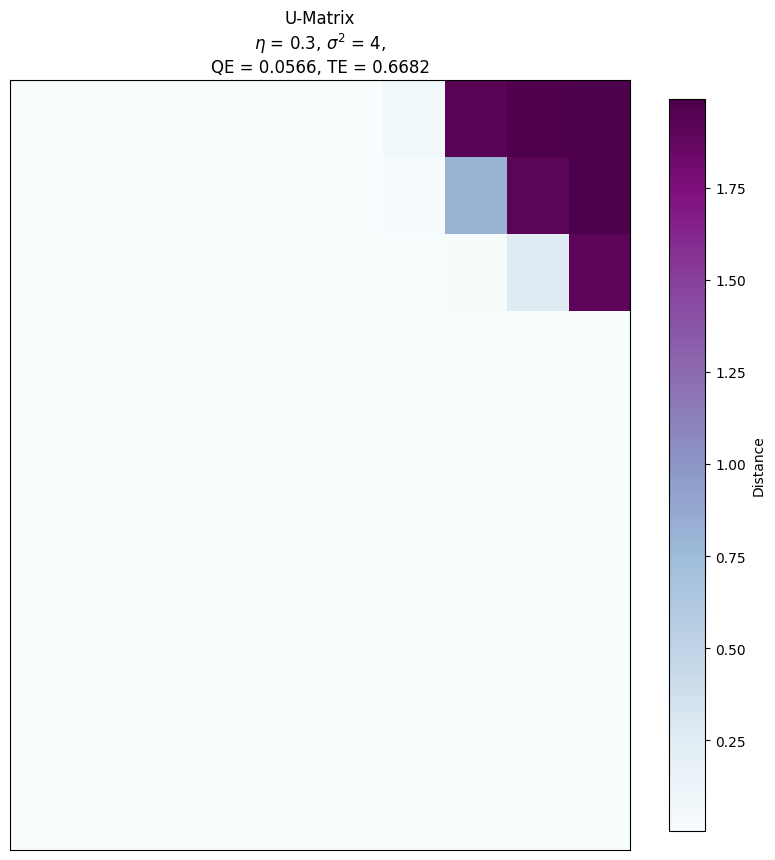

['In the image, there is a truck parked next to a group of people standing next to it. Among them, a man is wearing a vest and jeans. Another person can be seen wearing a jacket and jeans. There are also two more people standing nearby.\n\nIn the background, there are multiple people standing and walking around. Some of them are standing close to the truck, while others are']

In [258]:
searchindiefilmsfuyusom('She is not a doll')

Correspondant keyframe： ['Nursery Rhymes  Award-Winning Single-Take Short Film  Short of the Week_frame_4455.jpg']


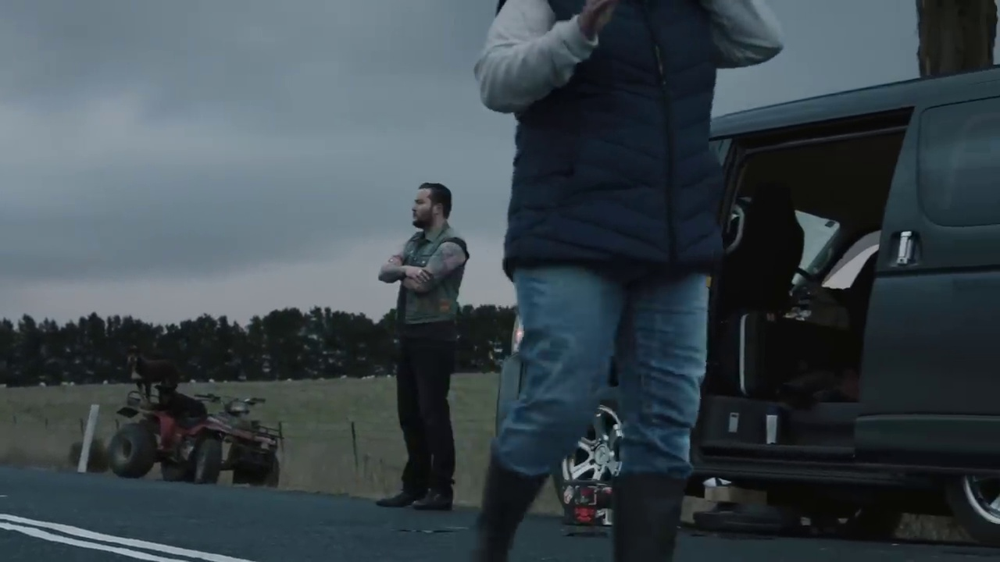

In [259]:
example_content = "In the image, there is a truck parked next to a group of people standing next to it. Among them, a man is wearing a vest and jeans. Another person can be seen wearing a jacket and jeans. There are also two more people standing nearby.\n\nIn the background, there are multiple people standing and walking around. Some of them are standing close to the truck, while others are"

corresponding_first_column_values = []

with open("Frame_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\MoviesKeyframes\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 65ms/step


<Figure size 640x480 with 0 Axes>

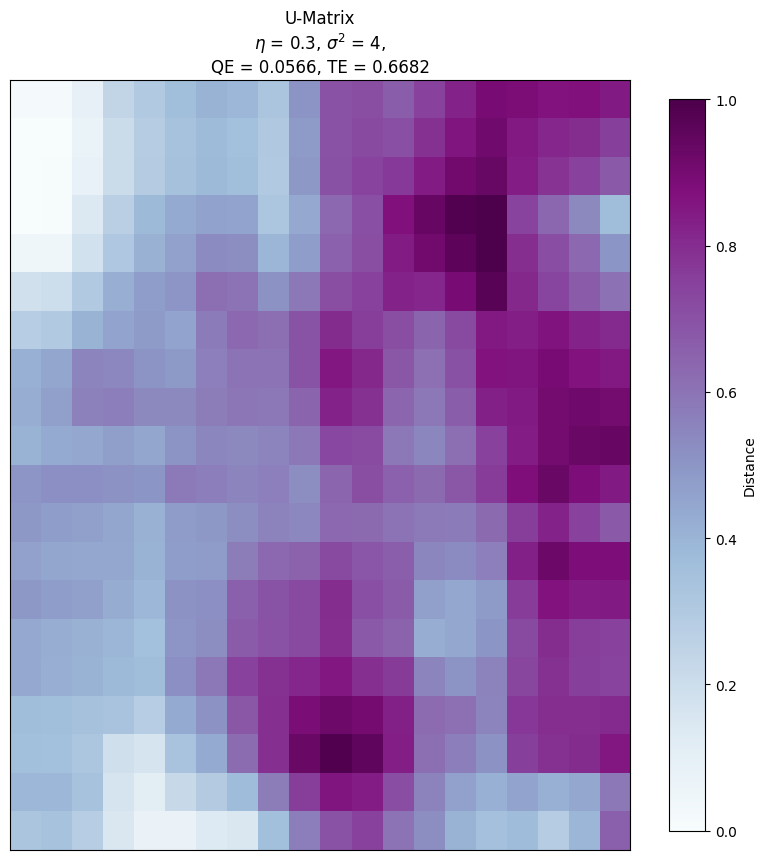

['keyframe_1018.jpg']

In [270]:
searchmadridpicturesom('D:\\FinalAssignment\\MoviesKeyframes\\Nursery Rhymes  Award-Winning Single-Take Short Film  Short of the Week_frame_4455.jpg')

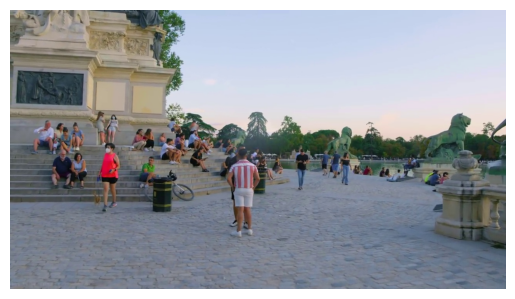

In [272]:
from PIL import Image
import matplotlib.pyplot as plt

image_path = r'D:\FinalAssignment\Images\keyframe_1018.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

In [275]:
example_content = "keyframe_1018.jpg"

corresponding_second_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_second_column_values.append(row[1])

print("Correspondant description：", corresponding_second_column_values)

Correspondant description： ['In the image, there is a large group of people sitting on a stone staircase, some standing and others sitting. Among them, there are at least 14 people visible. Some of them are wearing shorts, while others are wearing pants. The scene is bustling with people engaged in various activities.\n\nSome of the people can be seen sitting on benches, while others']


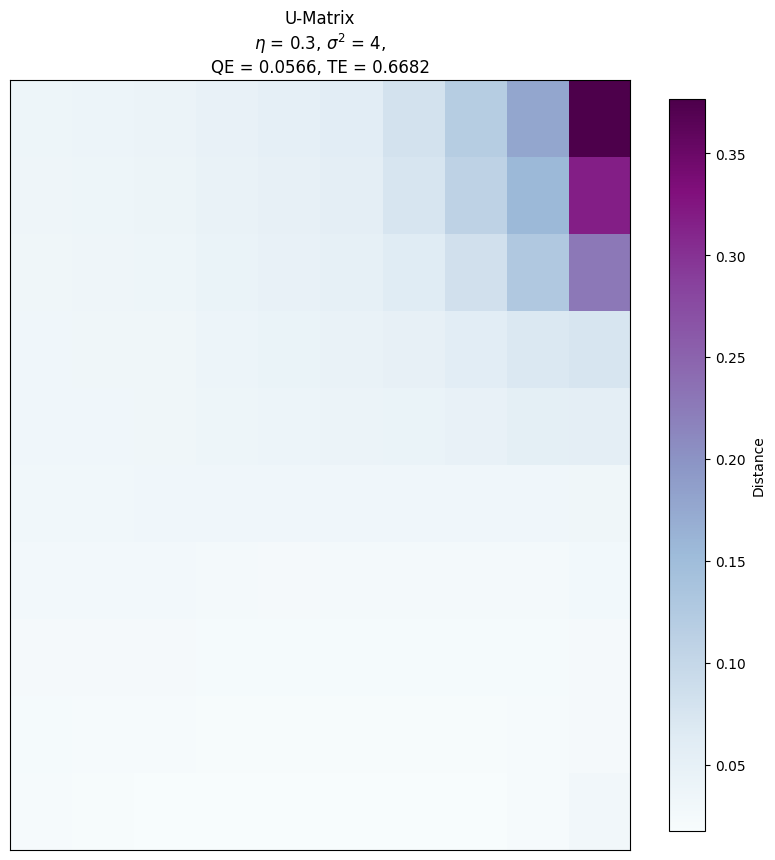

(9, 5)


' Then came the Bureaux of Propaganda by Television, by Feeling Picture, and by Synthetic Voice and Music respectively–twenty–two floors of them. Above were the search laboratories and the padded rooms in which Sound–Track Writers and Synthetic Composers did the delicate work.'

In [276]:
searchtextsom('In the image, there is a large group of people sitting on a stone staircase, some standing and others sitting. Among them, there are at least 14 people visible. Some of them are wearing shorts, while others are wearing pants. The scene is bustling with people engaged in various activities.\n\nSome of the people can be seen sitting on benches, while others')

### 6
#### Finding Madrid urban space and behaviour matching Indie Films, and its interpretation under xtopian fictions

<Figure size 640x480 with 0 Axes>

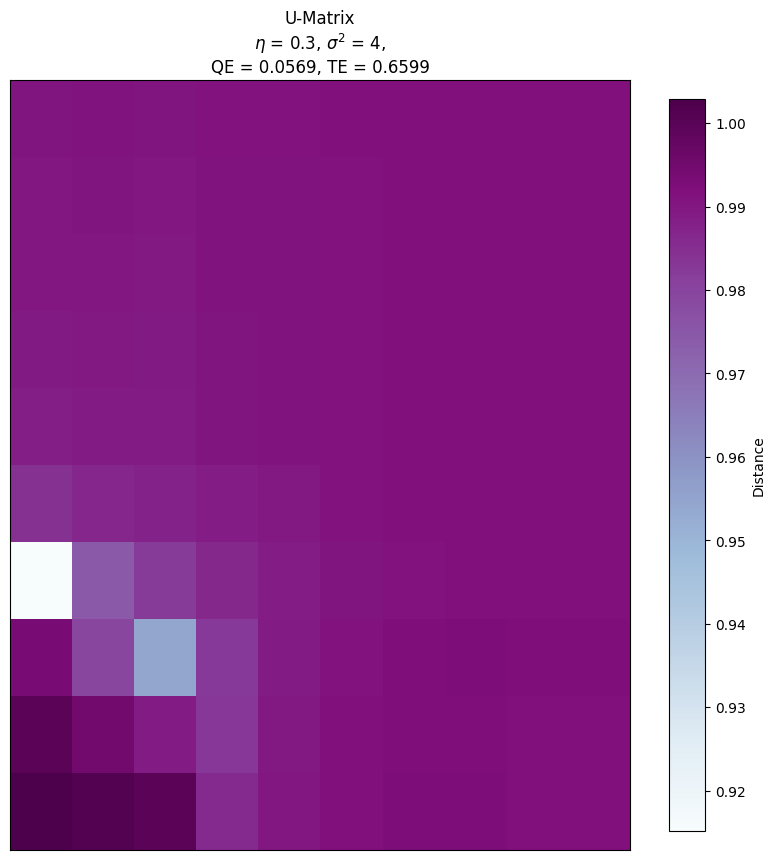

['In the image, there is a man standing next to a red car parked in front of a white building. The car is in the middle of the scene, and the man is standing next to it. Another person can be seen standing nearby, possibly watching the car.\n']

In [300]:
searchindiefilmsfuyusom('Gran Via')

Correspondant keyframe： ['Dance Roller Skating Unifies a Community in Los Angeles  LA ROLL_frame_20721.jpg']


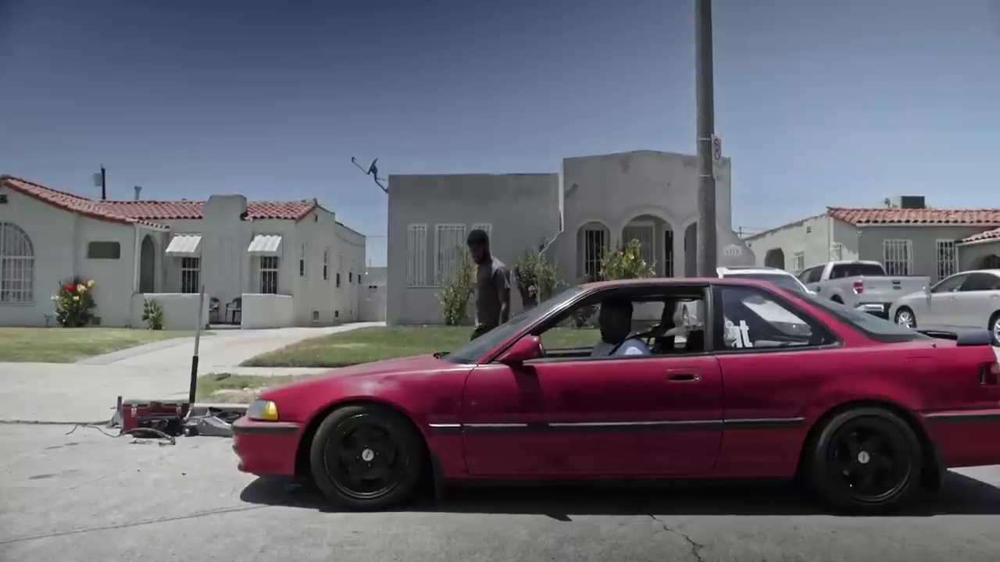

In [301]:
example_content = "In the image, there is a man standing next to a red car parked in front of a white building. The car is in the middle of the scene, and the man is standing next to it. Another person can be seen standing nearby, possibly watching the car.\n"

corresponding_first_column_values = []

with open("Frame_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[1]:
            corresponding_first_column_values.append(row[0])

print("Correspondant keyframe：", corresponding_first_column_values)

image_path_prefix = "D:\\FinalAssignment\\MoviesKeyframes\\"

for filename in corresponding_first_column_values:
    image_path = os.path.join(image_path_prefix, filename)
    try:
        img = Image.open(image_path)
        display(img)
    except FileNotFoundError:
        print(f"file {filename} does not exist")

1/1 [==============================] - 0s 79ms/step


<Figure size 640x480 with 0 Axes>

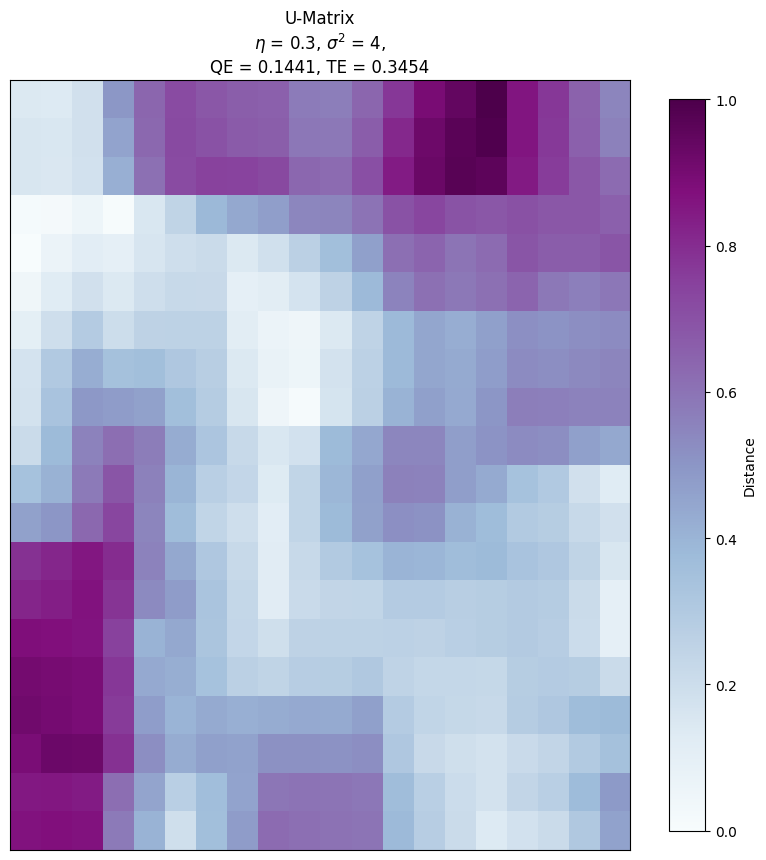

['keyframe_792.jpg']

In [327]:
searchmadridpicturesom('D:\\FinalAssignment\\MoviesKeyframes\\Dance Roller Skating Unifies a Community in Los Angeles  LA ROLL_frame_20721.jpg')

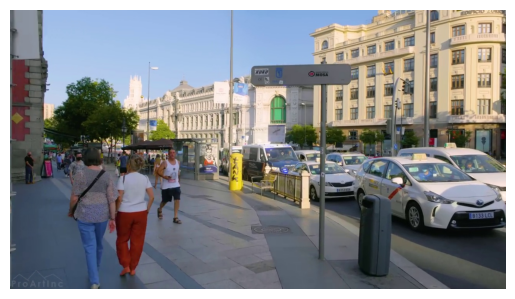

In [328]:
from PIL import Image
import matplotlib.pyplot as plt

image_path = r'D:\FinalAssignment\Images\keyframe_792.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

In [329]:
example_content = "keyframe_792.jpg"

corresponding_second_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_second_column_values.append(row[1])

print("Correspondant description：", corresponding_second_column_values)

Correspondant description： ['There are multiple people walking down a street, some carrying handbags.\n']


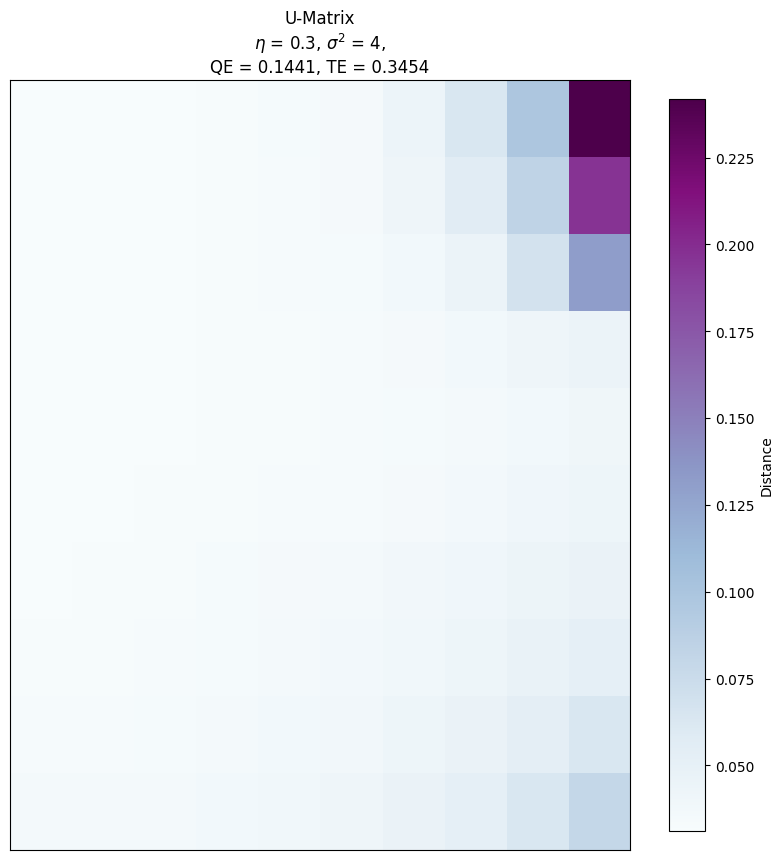

(0, 0)


' His mind slid away into the labyrinthine world of doublethink. To know and not to know, to be conscious of complete truthfulness while telling carefully constructed lies, to hold simultaneously two opinions which cancelled out, knowing them to be contradictory and believing in both of them, to use logic against logic, to repudiate morality while laying claim to it, to believe that democracy was impossible and that the Party was the guardian of democracy, to forget whatever it was necessary to forget, then to draw it back into memory again at the moment when it was needed, and then promptly to forget it again: and above all, to apply the same process to the process itself.'

In [330]:
searchtextsom('There are multiple people walking down a street, some carrying handbags.')

### 7
#### Specific picture under Madrid or Indie Film context. Then activate xtopian fictions with image.

1/1 [==============================] - 0s 72ms/step


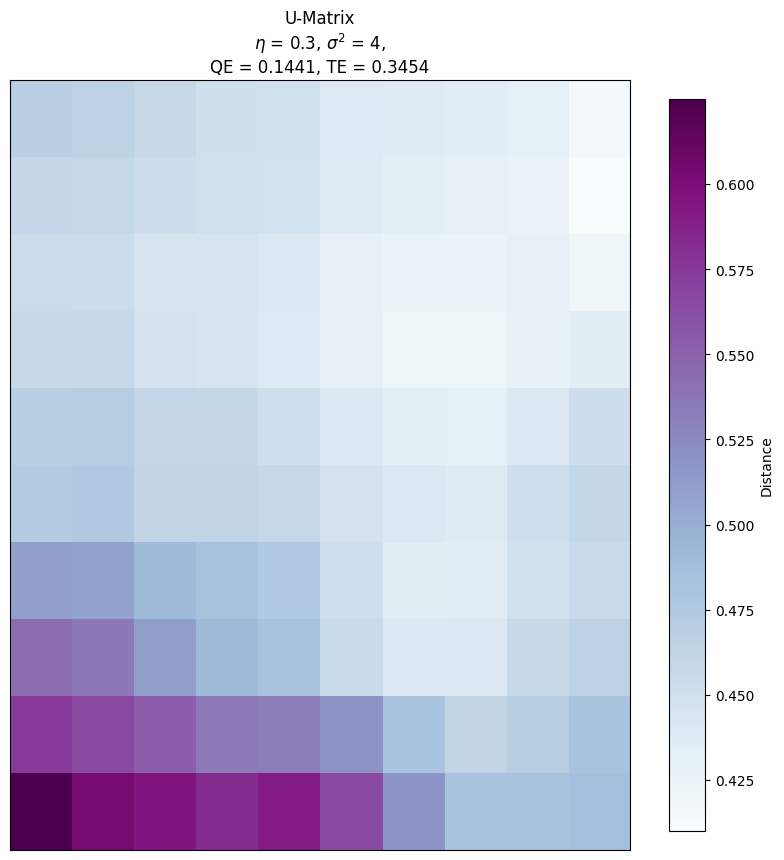

['Award-Winning Stop Motion Animated Short  Tokri (The Basket)_frame_14455.jpg']

In [333]:
searchindiefilmframessom('D:\\FinalAssignment\\Input\\image1.jpg')

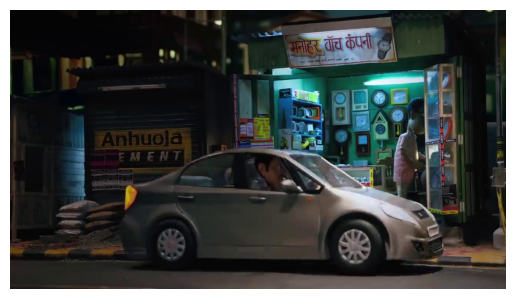

In [349]:
image_path = r'D:\FinalAssignment\MoviesKeyframes\Award-Winning Stop Motion Animated Short  Tokri (The Basket)_frame_14455.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

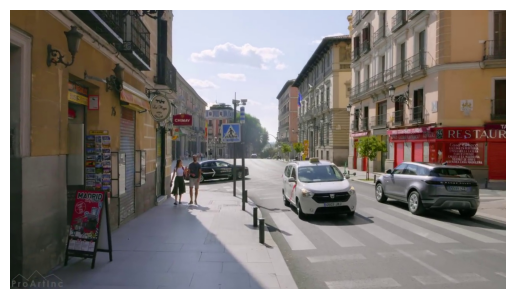

In [ ]:
image_path = r'D:\FinalAssignment\Images\keyframe_444.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 74ms/step


<Figure size 640x480 with 0 Axes>

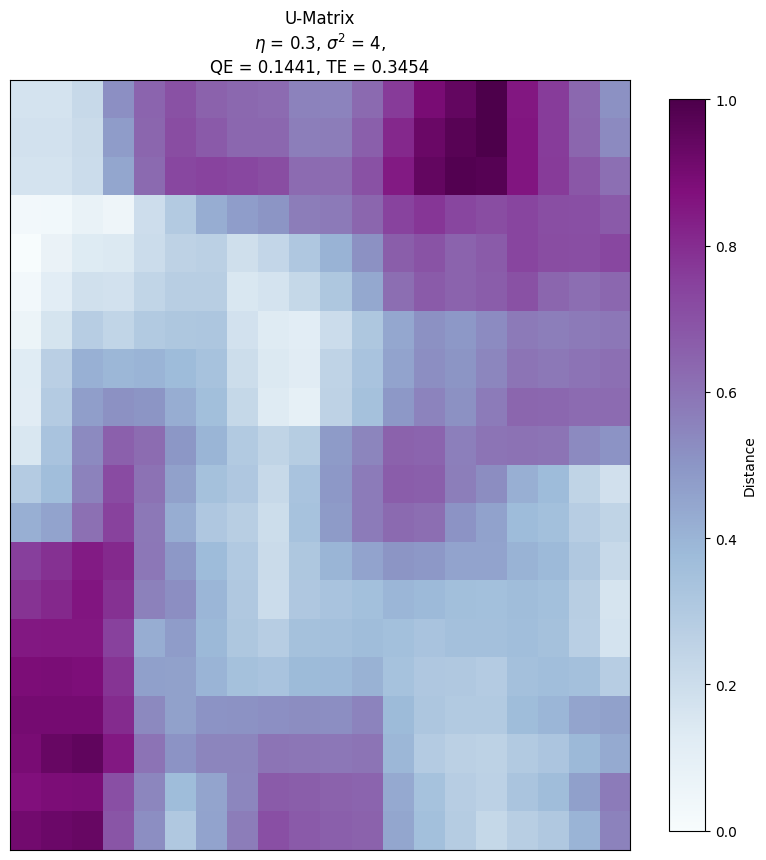

['keyframe_444.jpg']

In [ ]:
searchmadridpicturesom('D:\\FinalAssignment\\MoviesKeyframes//Award-Winning Stop Motion Animated Short  Tokri (The Basket)_frame_14455.jpg')

In [ ]:
example_content = "keyframe_444.jpg"

corresponding_second_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_second_column_values.append(row[1])

print("Correspondant description：", corresponding_second_column_values)

Correspondant description： ['In the image, there are various objects on the street, including cars, a truck, and pedestrians. A couple of pedestrians are crossing the street.\n']


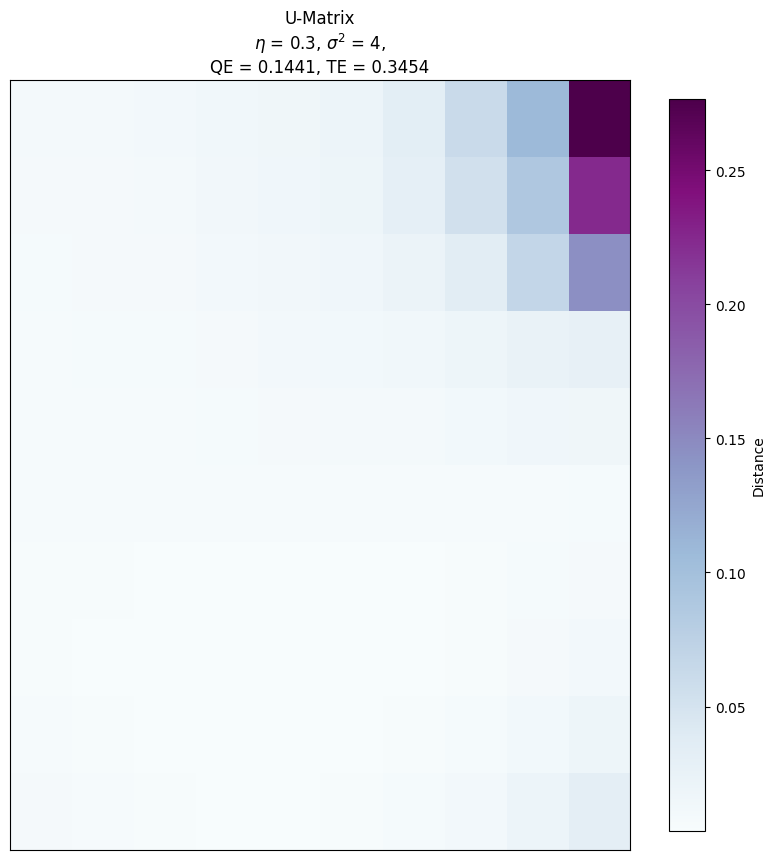

(7, 4)


' Heredity, date of fertilization, membership of Bokanovsky Group–details were transferred from test–tube to bottle. No longer anonymous, but named, identified, the procession marched slowly on; on through an opening in the wall, slowly on into the Social Predestination Room.'

In [ ]:
searchtextsom('In the image, there are various objects on the street, including cars, a truck, and pedestrians. A couple of pedestrians are crossing the street.')

### 8
#### Specific picture under Madrid or Indie Film context. Then activate xtopian fictions with image.

1/1 [==============================] - 0s 64ms/step


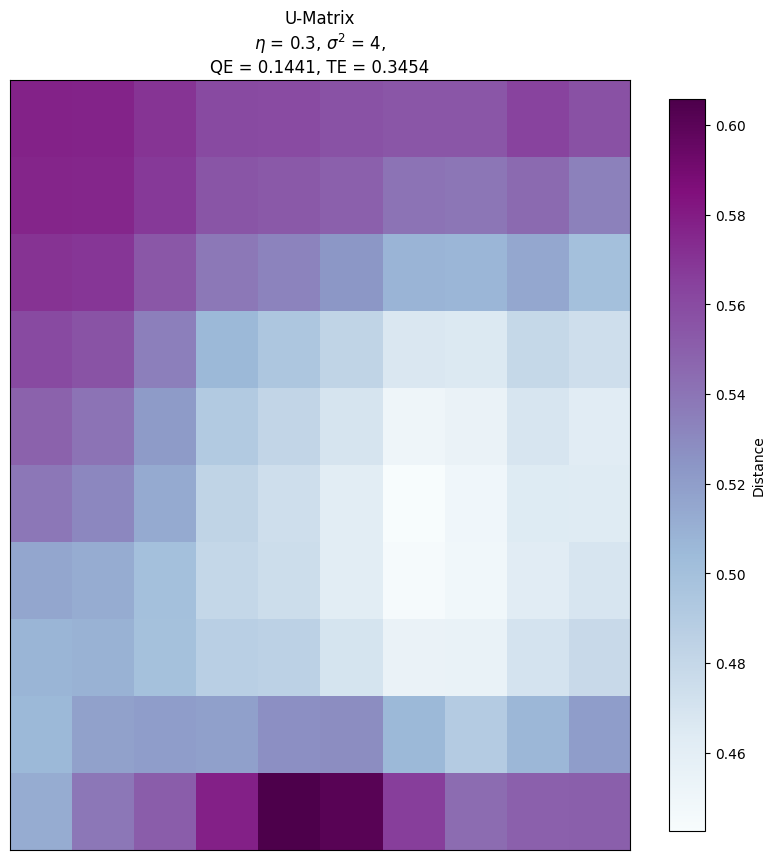

['Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week_frame_7017.jpg']

In [ ]:
searchindiefilmframessom('D:\\FinalAssignment\\Input\\image2.jpg')

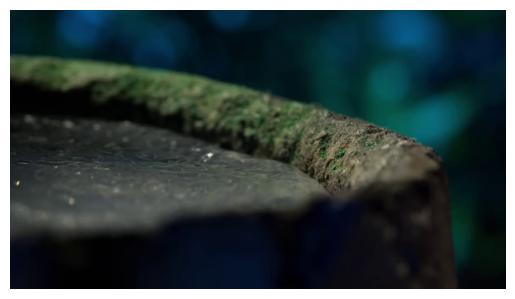

In [ ]:
image_path = r'D:\FinalAssignment\MoviesKeyframes\Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week_frame_7017.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 71ms/step


<Figure size 640x480 with 0 Axes>

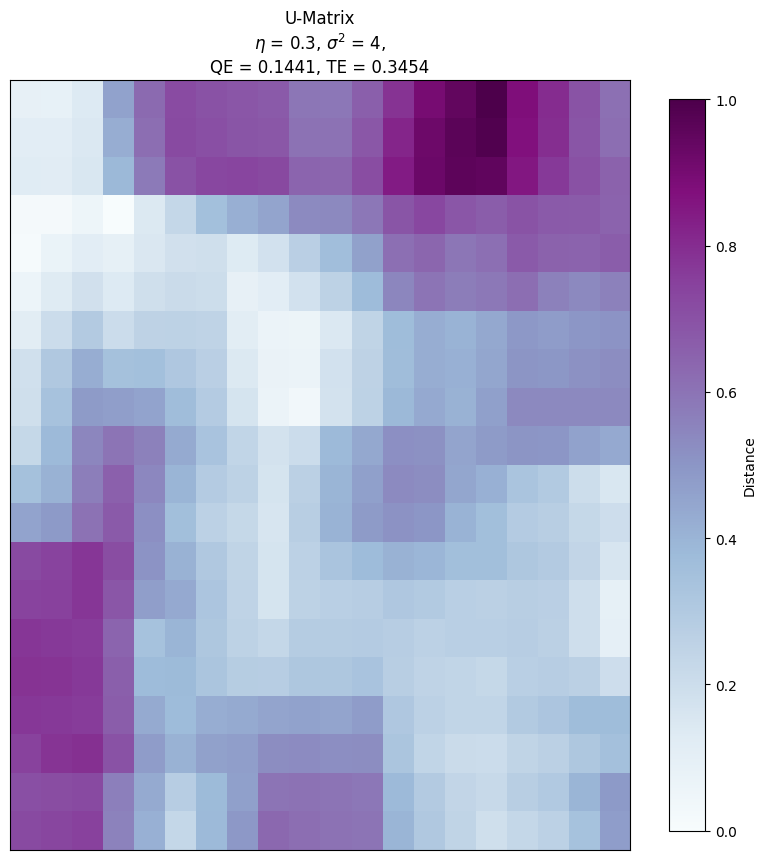

['keyframe_506.jpg']

In [ ]:
searchmadridpicturesom('D:\\FinalAssignment\\MoviesKeyframes\\Lost & Found  Oscar Shortlisted Stop-Motion Animation  Short of the Week_frame_7017.jpg')

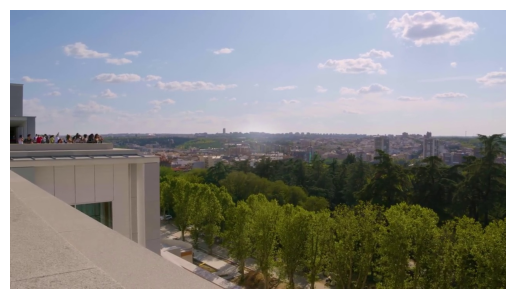

In [ ]:
image_path = r'D:\FinalAssignment\Images\keyframe_506.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
example_content = "keyframe_506.jpg"

corresponding_second_column_values = []

with open("Image_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_second_column_values.append(row[1])

print("Correspondant description：", corresponding_second_column_values)

Correspondant description： ['In the image, there is a large crowd of people standing on a rooftop, overlooking a cityscape. The crowd is spread out across the rooftop, with some standing closer to the top and others near the bottom. The rooftop is surrounded by trees, providing a picturesque view.']


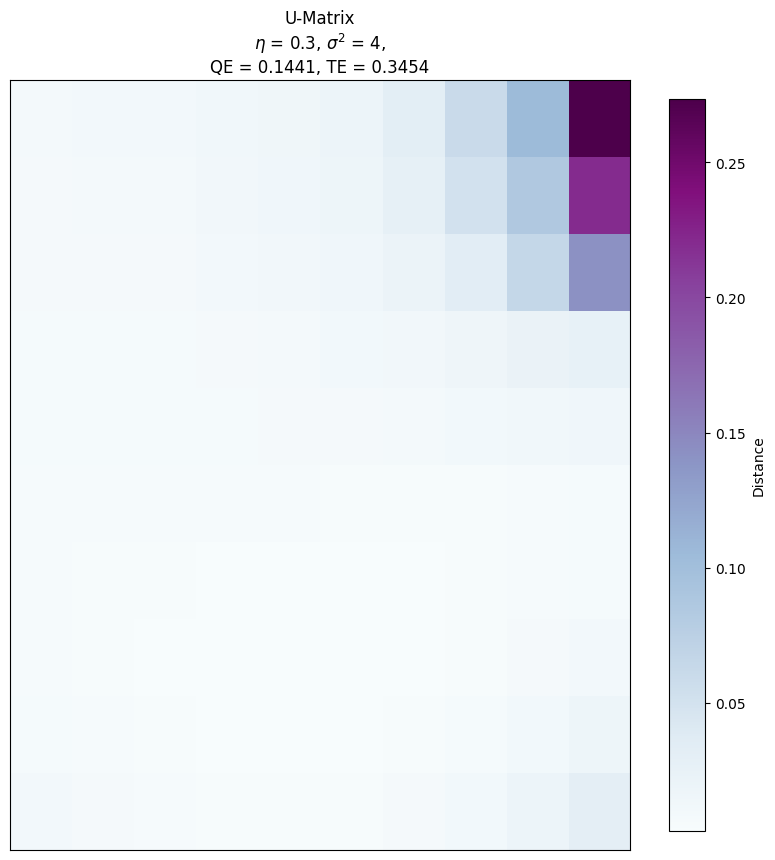

(7, 5)


' For a moment the khaki mob was silent, petrified, at the spectacle of this wanton sacrilege, with amazement and horror. "Hes mad," whispered Bernard, staring with wide open eyes. "Theyll kill him. Theyll…" A great shout suddenly went up from the mob; a wave of movement drove it menacingly towards the Savage.'

In [ ]:
searchtextsom('In the image, there is a large crowd of people standing on a rooftop, overlooking a cityscape. The crowd is spread out across the rooftop, with some standing closer to the top and others near the bottom. The rooftop is surrounded by trees, providing a picturesque view.')

### 9
#### Specific picture under Madrid or Indie Film context. Then activate xtopian fictions with Indie Films.

1/1 [==============================] - 0s 67ms/step


<Figure size 640x480 with 0 Axes>

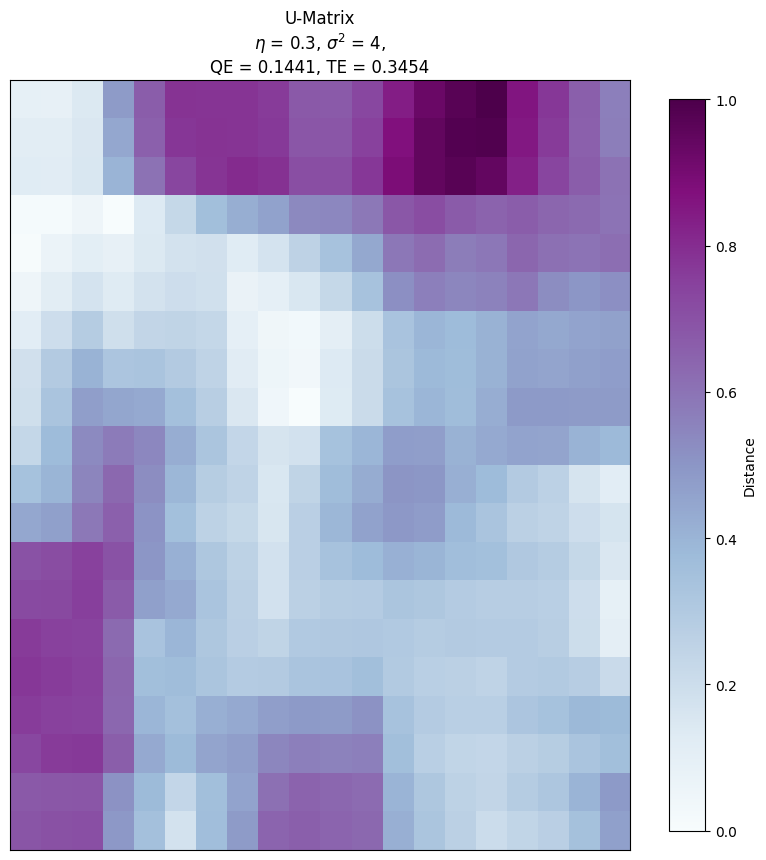

['keyframe_585.jpg']

In [ ]:
searchmadridpicturesom('D:\\FinalAssignment\\Input\\image3.jpg')

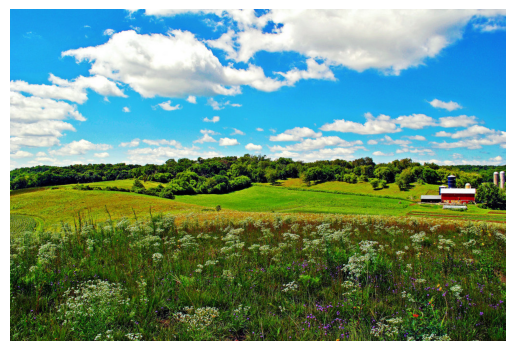

In [ ]:
image_path = r'D:\FinalAssignment\Input\image3.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

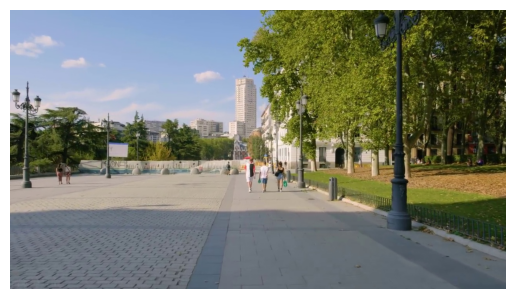

In [ ]:
image_path = r'D:\FinalAssignment\Images\keyframe_585.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 92ms/step


<Figure size 640x480 with 0 Axes>

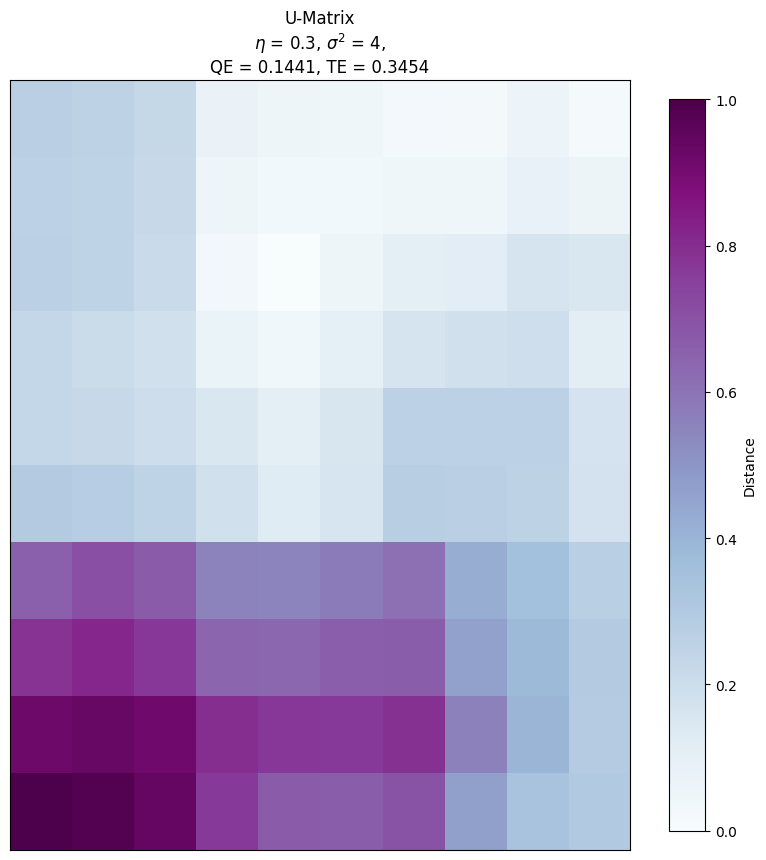

['Nursery Rhymes  Award-Winning Single-Take Short Film  Short of the Week_frame_3241.jpg']

In [ ]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_585.jpg')

In [ ]:
example_content = "Nursery Rhymes  Award-Winning Single-Take Short Film  Short of the Week_frame_3241.jpg"

corresponding_sec0nd_column_values = []

with open("Frame_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_sec0nd_column_values.append(row[1])

print("Correspondant description：", corresponding_sec0nd_column_values)

Correspondant description： ['There are multiple people standing in a grassy field, with one person holding their hand out to a horse.']


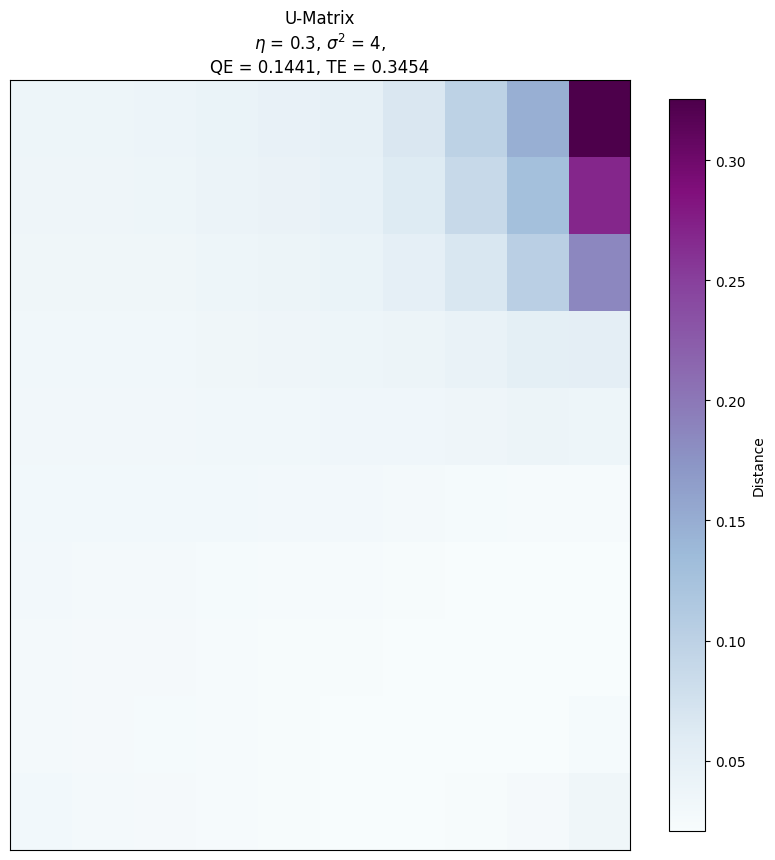

(7, 8)


'Chapter 4 Winston looked round the shabby little room above Mr Charringtons shop. Beside the window the enormous bed was made up, with ragged blankets and a coverless bolster. The old–fashioned clock with the twelve–hour face was ticking away on the mantelpiece.'

In [ ]:
searchtextsom('There are multiple people standing in a grassy field, with one person holding their hand out to a horse.')

### 10
#### Specific picture under Madrid or Indie Film context. Then activate xtopian fictions with Indie Films.

1/1 [==============================] - 0s 72ms/step


<Figure size 640x480 with 0 Axes>

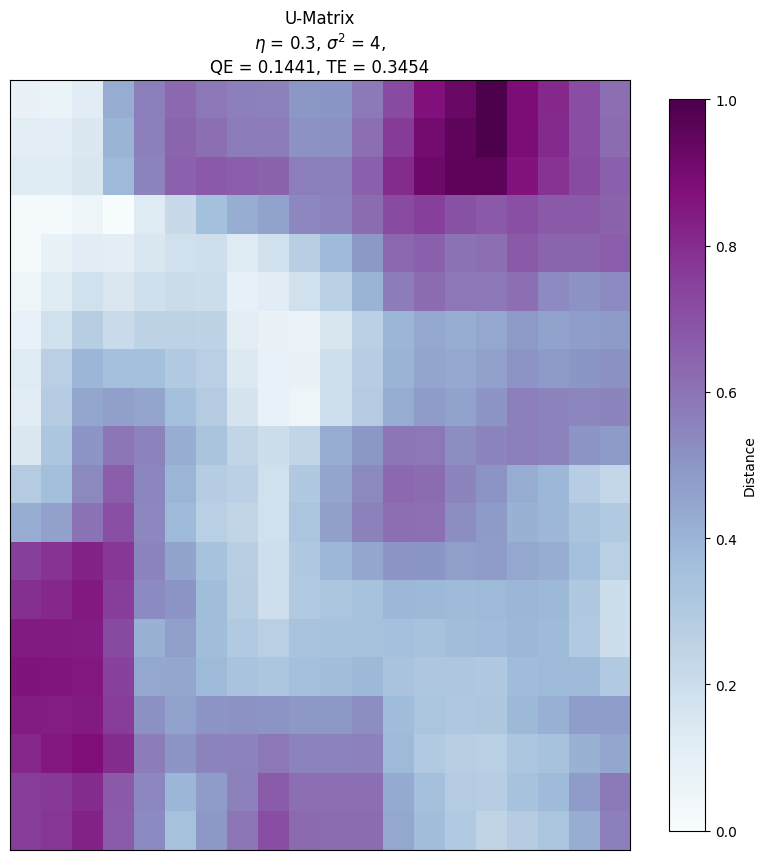

['keyframe_661.jpg']

In [ ]:
searchmadridpicturesom('D:\\FinalAssignment\\Input\\image4.jpg')

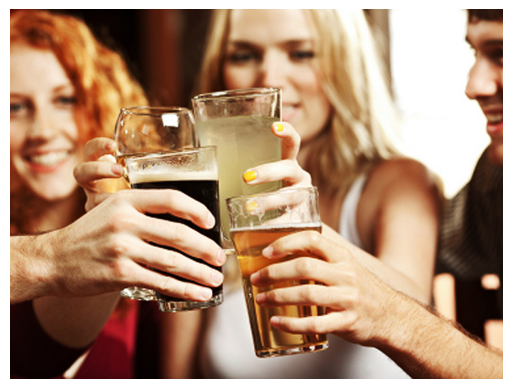

In [ ]:
image_path = r'D:\FinalAssignment\Input\image4.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

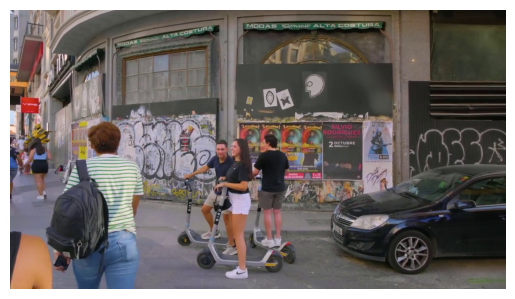

In [ ]:
image_path = r'D:\FinalAssignment\Images\keyframe_661.jpg'

image = Image.open(image_path)

plt.imshow(image)
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 76ms/step


<Figure size 640x480 with 0 Axes>

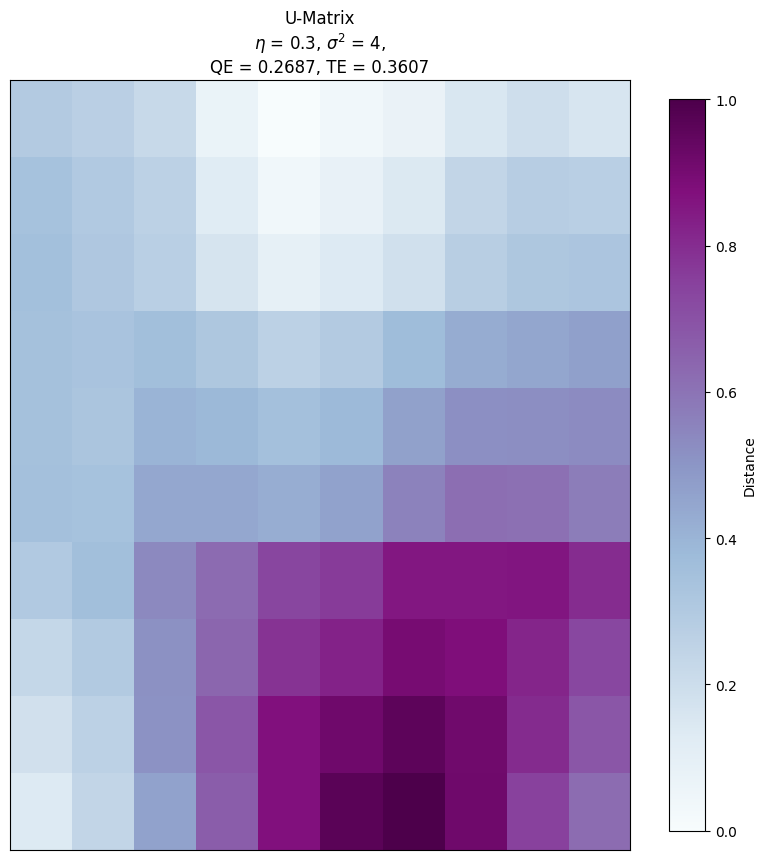

['Short Film about Weight and Female Empowerment  Bye Bye Body_frame_1448.jpg']

In [ ]:
searchindiefilmframessom('D:\\FinalAssignment\\Images\\keyframe_661.jpg')

In [ ]:
example_content = "Short Film about Weight and Female Empowerment  Bye Bye Body_frame_1448.jpg"

corresponding_sec0nd_column_values = []

with open("Frame_Textualisation.csv", 'r', encoding='utf-8') as file:
    csvreader = csv.reader(file)
    for row in csvreader:
        if example_content in row[0]:
            corresponding_sec0nd_column_values.append(row[1])

print("Correspondant description：", corresponding_sec0nd_column_values)

Correspondant description： ['In the image, there is a group of people standing and talking in a room. Among them, there are women wearing dresses. One of the women is holding a baby in her arms.\n\nThere are multiple chairs in the room, with one chair placed near the left side of the room and another chair on the right side. A dining table can be seen in the middle of the room. A refrigerator is also']


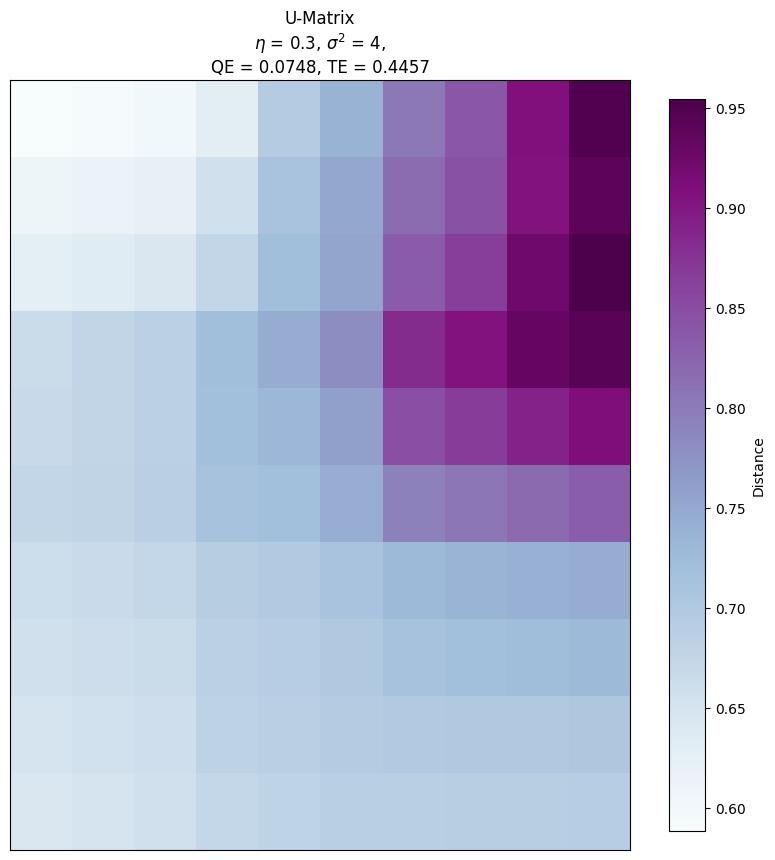

(0, 0)


' Bernards questions made a diversion. Who? How? When? From where? Keeping his eyes fixed on Bernards face (for so passionately did he long to see Lenina smiling that he simply dared not look at her), the young man tried to explain himself.'

In [ ]:
searchtextsom('In the image, there is a group of people standing and talking in a room. Among them, there are women wearing dresses. One of the women is holding a baby in her arms.\n\nThere are multiple chairs in the room, with one chair placed near the left side of the room and another chair on the right side. A dining table can be seen in the middle of the room. A refrigerator is also')